In [6]:
import weighquarks as wq
import numpy as np
import matplotlib.pyplot as plt

data_files = wq.filesFromDir(["2pt_0"],path="./2pt_data/")
col_names = ['t', 'px', 'py', 'pz', 'C_real']
raw_data = wq.mergeTables(data_files, col_names, 'C_real')
binned_data = wq.jacknifeBinData(raw_data)
binned_energy = wq.effectiveEnergy(binned_data)
jack_err = wq.jacknifeError(binned_energy)

Effective energies for these intervals will be set to 0.


In [77]:
# Purpose:    identify the start indexes of plateaus of a given length, excluding index 0
# Parameters: 1D NumPy array representing the bin values for each timeslice YCOORDS
#             1D NumPy array representing jacknife errors for each timeslice YERR

def idPlateau(ycoords, yerr, length=3):
    num_coords = len(ycoords)
    i = 1
    count = 0
    max_err = 0
    min_err = 0
    
    while i < num_coords:
        if count == length:
            return i - count
        
        else:
            
            if (max_err - min_err) > 0:
                curr_max = ycoords[i] + yerr[i]
                curr_min = ycoords[i] - yerr[i]
                if max_err > curr_max:
                    max_err = curr_max
                if min_err < curr_min:
                    min_err = curr_min
                i += 1
                count += 1
                
            else:
                i -= count
                i += 1
                curr_max = ycoords[i] + yerr[i]
                curr_min = ycoords[i] - yerr[i]
                max_err = curr_max
                min_err = curr_min
                count = 0
            
    return 0

def listPlateaus(binned_vals, binned_err, length=3, selected_bins=None):
    vals_by_bin = np.transpose(binned_vals)
    if selected_bins:
        to_plot = selected_bins
    else:
        to_plot = range(len(vals_by_bin))
    plateaus = np.zeros(len(to_plot))
    
    for bin_no in to_plot:
        plateaus[bin_no] = idPlateau(vals_by_bin[bin_no], binned_err, length=length)
        
    return plateaus

In [79]:
def oneDimJacknife(rhos, avg=None):
    if avg:
        rho_bar = avg
    else:
        rho_bar = np.sum(rhos) / len(rhos)
        
    m_fact = (len(rhos) - 1) / len(rhos)
    sig_fact = np.sum( np.square(rhos - rho_bar) )
    delta_t = np.sqrt(m_fact * sig_fact)
    
    return delta_t

In [89]:
def getPlateauVal(ycoords, yerr, min_slice, max_slice):
    num = np.sum(ycoords[min_slice:max_slice] * np.power(yerr[min_slice:max_slice], -2))
    den = np.sum(np.power(yerr[min_slice:max_slice], -2))
    quo = num/den
    
    return quo

def plotPlateauFit(ycoords, yerr, min_slice, max_slice):
    plat_fit = getPlateauVal(ycoords, yerr, min_slice, max_slice)
    plat_err = oneDimJacknife(ycoords[min_slice:max_slice], avg=plat_fit)    
    title_fit = str(round(plat_fit, 5))
    title_err = str(round(plat_err, 5))
    plot_title = "Plateau fit value "+title_fit+" ± "+title_err
    plot_label = "Fit for slices "+str(min_slice)+" to "+str(max_slice)
    
    x = range(1, len(ycoords))
    y = ycoords[1:]
    e = yerr[1:]
    ax = plt.gca()
    ax.set_xlim([0, max_slice])
    ax.set_ylim([0, (y[0]*2)])
    plt.title(plot_title)
    plt.xlabel(plot_label)
    plt.scatter(x, y)
    plt.errorbar(x, y, yerr=e, fmt="o")
    plt.axvline(x=min_slice, linestyle="dashed")
    plt.axhline(y=plat_fit, linestyle="solid")
    plt.axhline(y=plat_fit-plat_err, linestyle=":")
    plt.axhline(y=plat_fit+plat_err, linestyle=":")
    plt.show()
    
    return [plat_fit, plat_err]

def listFits(binned, err, selected_bins=None):
    sort_by_bin = np.transpose(binned)
    if selected_bins:
        to_plot = selected_bins
    else:
        to_plot = range(len(sort_by_bin))
    
    fit_vals = np.zeros((len(to_plot), 2))
    for bin_no in to_plot:
        plateau_min = idPlateau(sort_by_bin[bin_no], err)
        plateau_max = wq.maxSlice(err, max_fact=10)
        fit_vals[bin_no] = plotPlateauFit(sort_by_bin[bin_no], err, plateau_min, plateau_max)
      
    return fit_vals

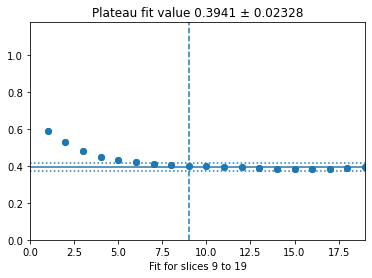

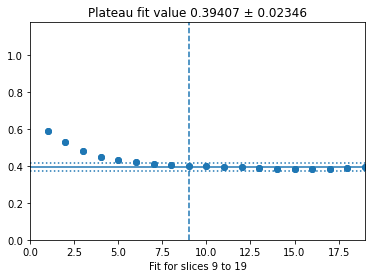

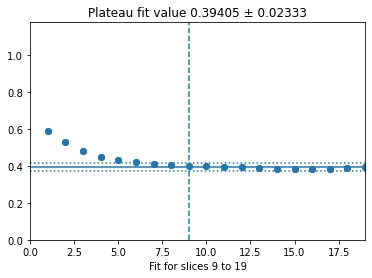

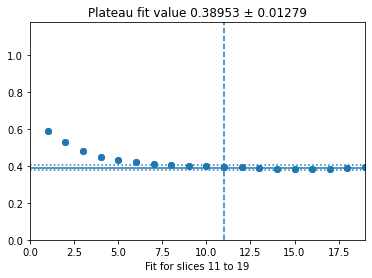

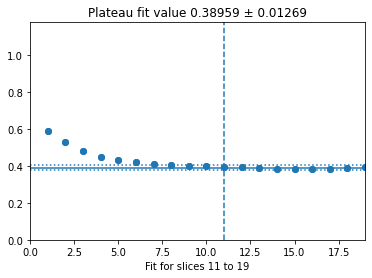

...

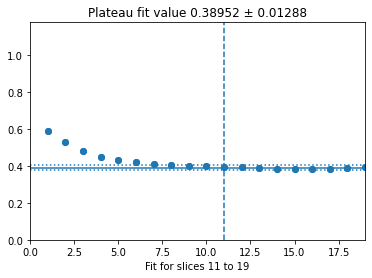

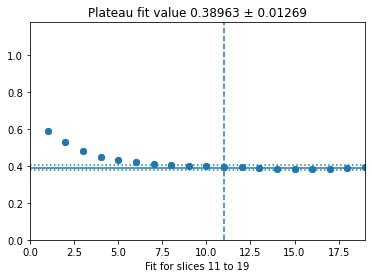

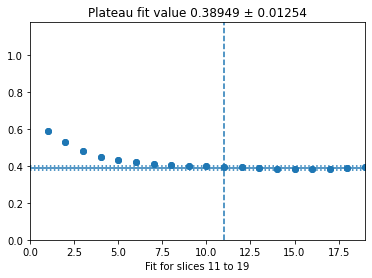

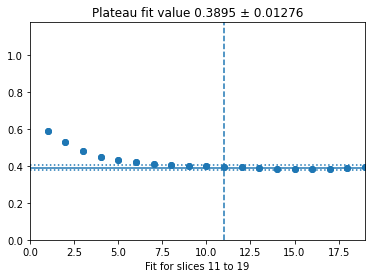

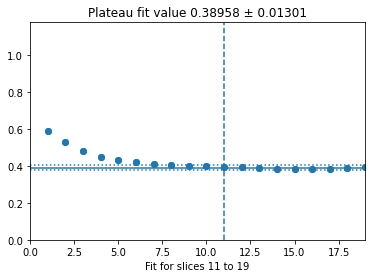

array([[0.39409572, 0.02328332],
       [0.39407242, 0.02345715],
       [0.39405269, 0.02332619],
       [0.38952735, 0.01279158],
       [0.38959416, 0.01268579],
       [0.38960451, 0.01280456],
       [0.38957437, 0.01276864],
       [0.38954295, 0.01296675],
       [0.39412329, 0.02343937],
       [0.38953622, 0.01283284],
       [0.38953897, 0.01274769],
       [0.38953274, 0.01283025],
       [0.38953337, 0.01329732],
       [0.39410859, 0.02314149],
       [0.38957871, 0.01288038],
       [0.38961426, 0.01289875],
       [0.38958919, 0.01300849],
       [0.38957002, 0.01270175],
       [0.39410042, 0.02340251],
       [0.38960151, 0.01280898],
       [0.38952173, 0.0130814 ],
       [0.39409332, 0.0230514 ],
       [0.39414842, 0.02297952],
       [0.38959016, 0.0129707 ],
       [0.38948542, 0.01278366],
       [0.38959579, 0.01314258],
       [0.39410805, 0.02314031],
       [0.39403339, 0.02333888],
       [0.38960204, 0.01286663],
       [0.38951597, 0.01281158],
       [0.

In [90]:
listFits(binned_energy, jack_err)

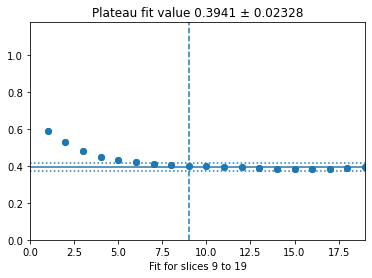

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


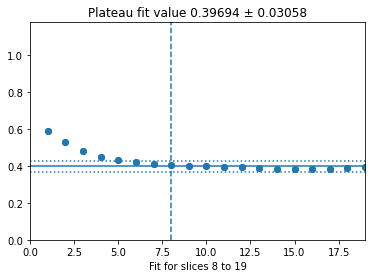

Adjusted to 8


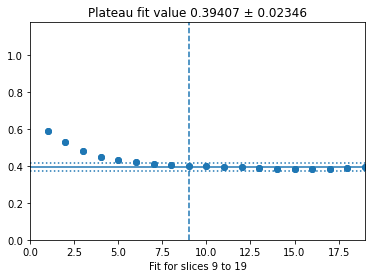

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


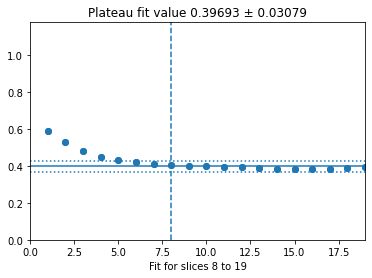

Adjusted to 8


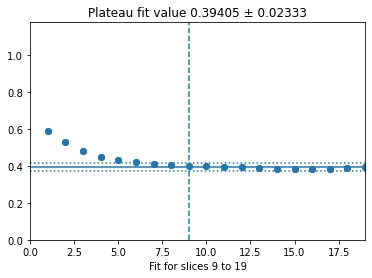

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


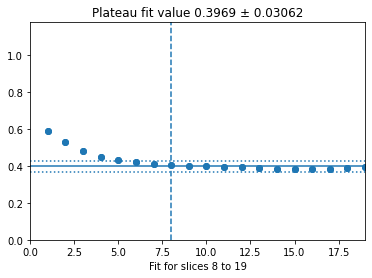

Adjusted to 8


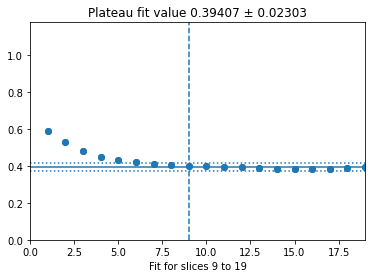

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


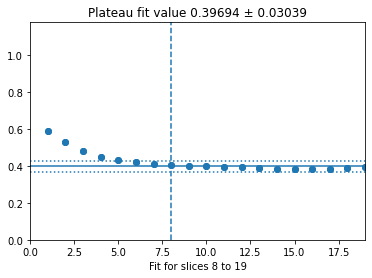

Adjusted to 8


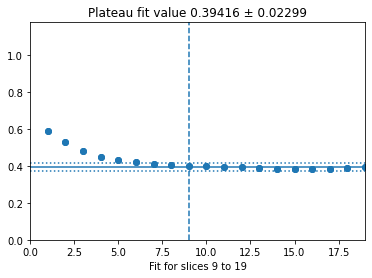

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


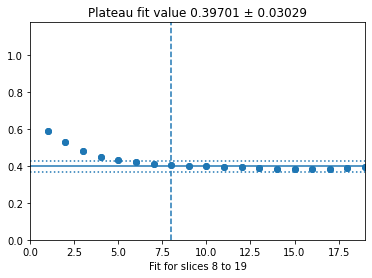

Adjusted to 8


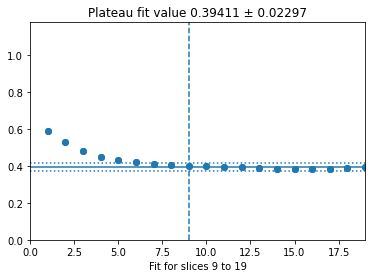

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


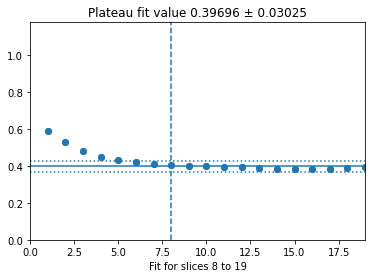

Adjusted to 8


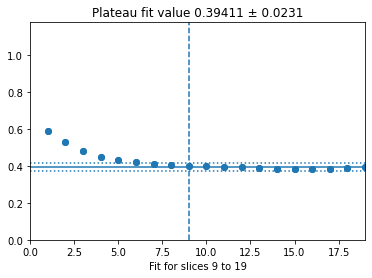

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


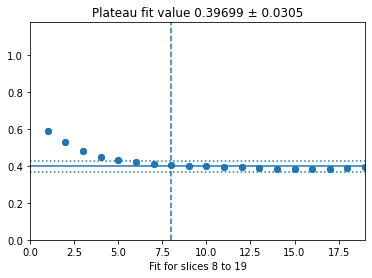

Adjusted to 8


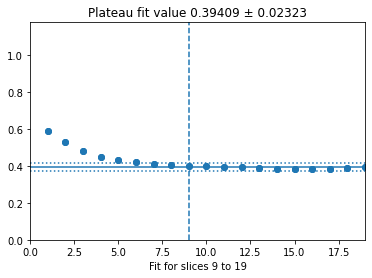

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


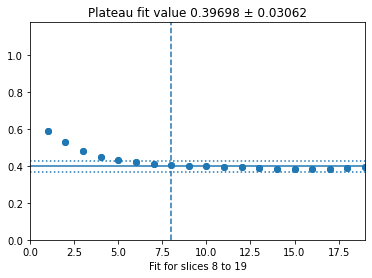

Adjusted to 8


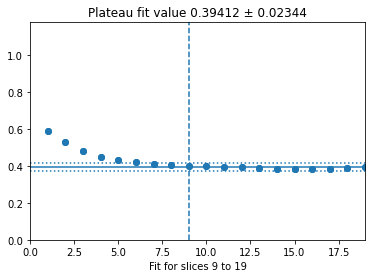

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


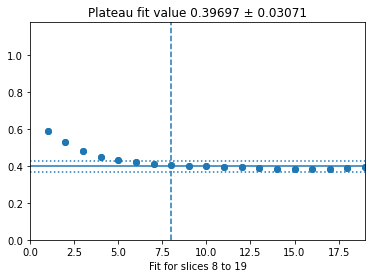

Adjusted to 8


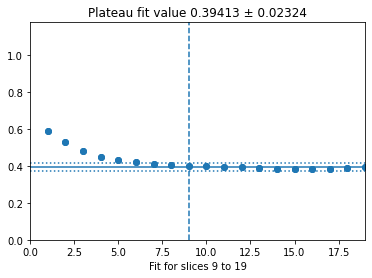

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


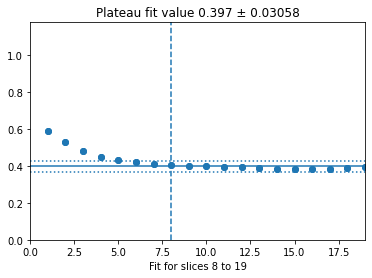

Adjusted to 8


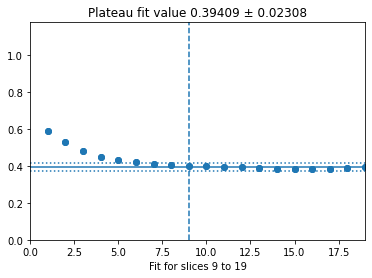

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


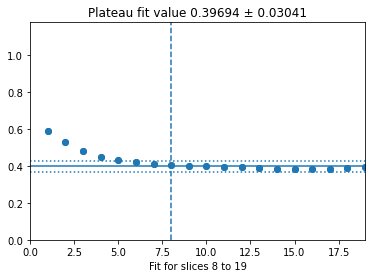

Adjusted to 8


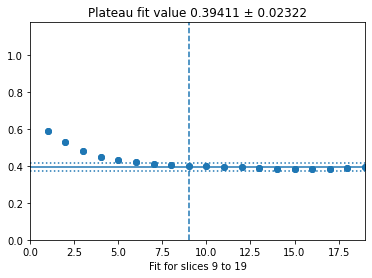

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


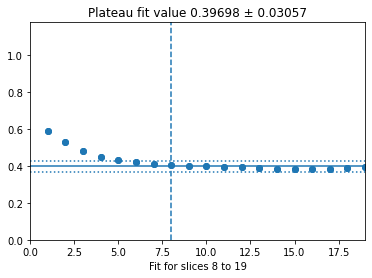

Adjusted to 8


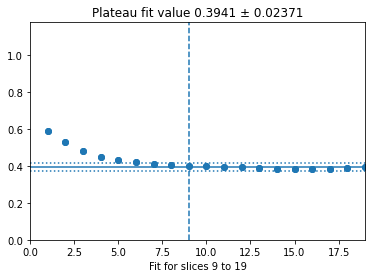

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


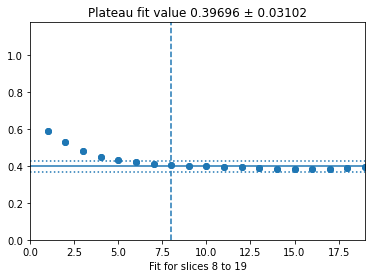

Adjusted to 8


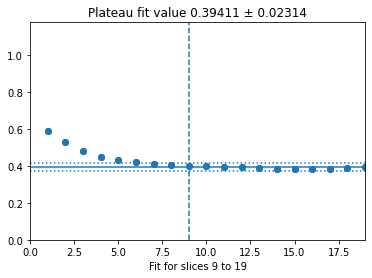

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


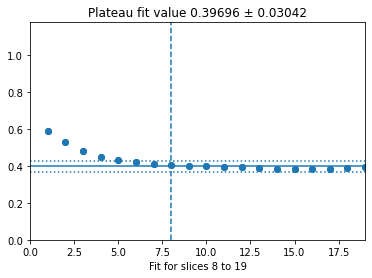

Adjusted to 8


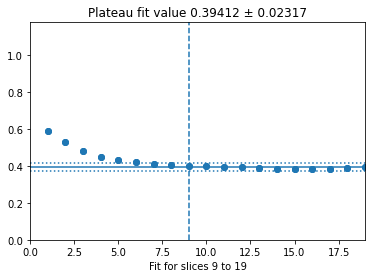

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


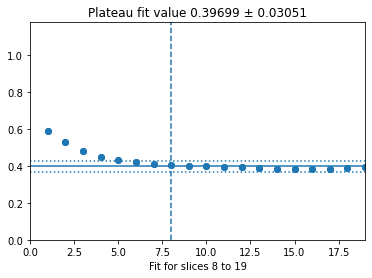

Adjusted to 8


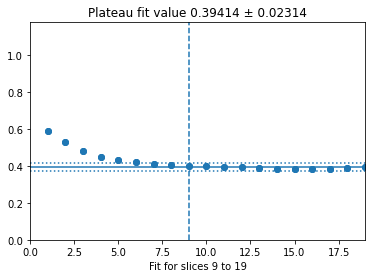

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


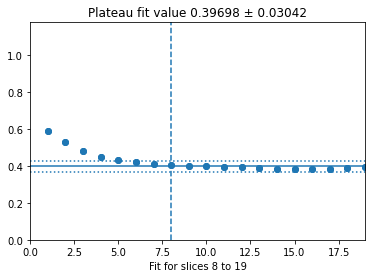

Adjusted to 8


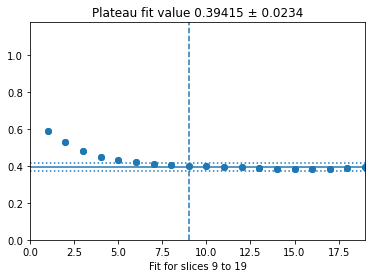

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


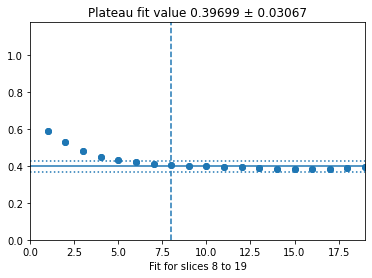

Adjusted to 8


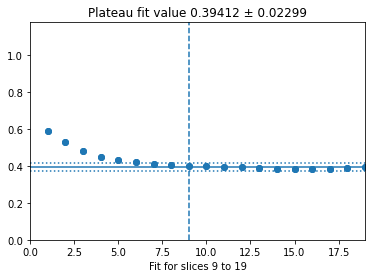

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


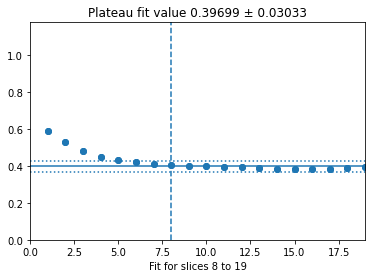

Adjusted to 8


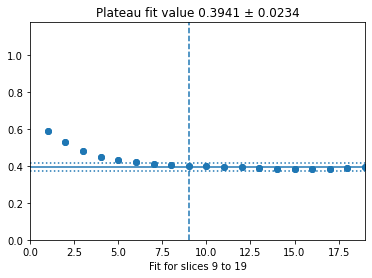

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


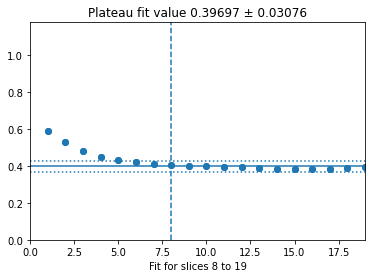

Adjusted to 8


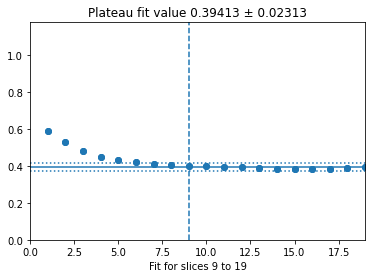

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


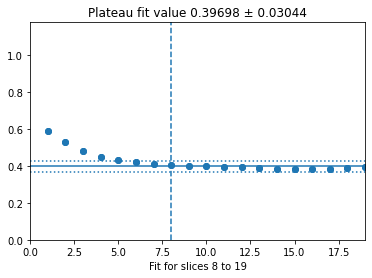

Adjusted to 8


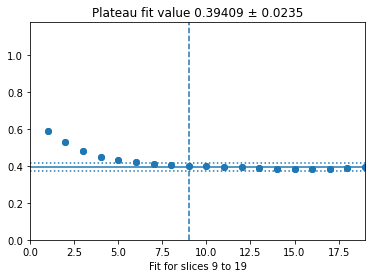

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


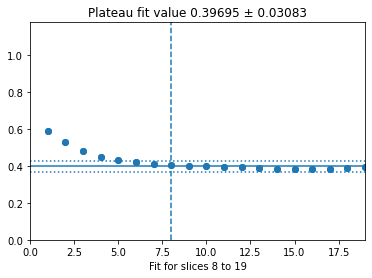

Adjusted to 8


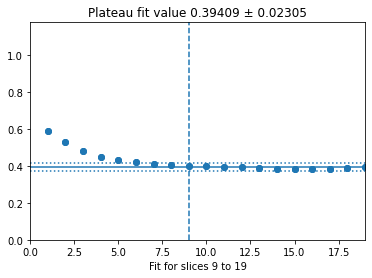

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


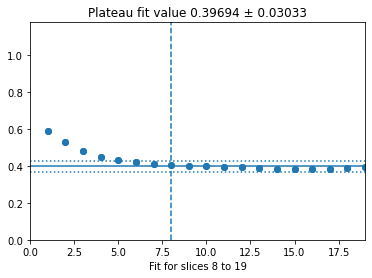

Adjusted to 8


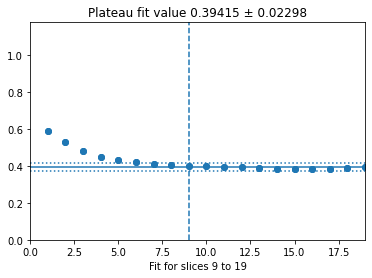

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


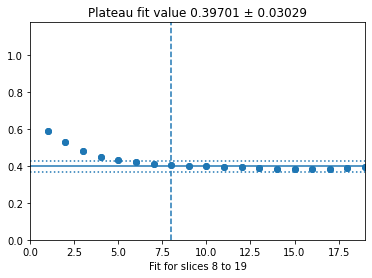

Adjusted to 8


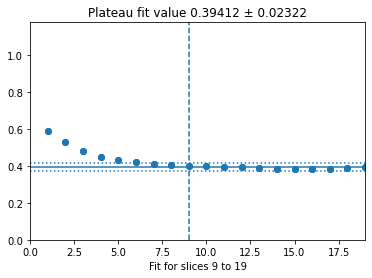

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


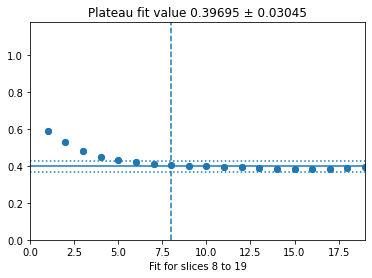

Adjusted to 8


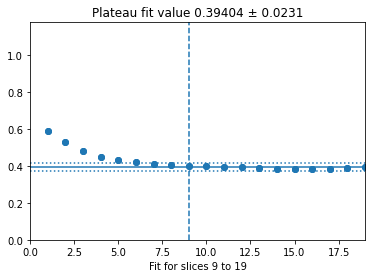

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


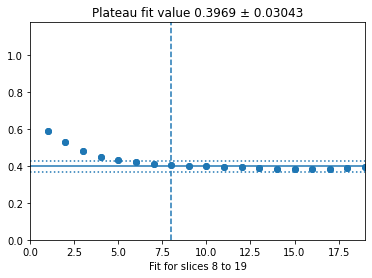

Adjusted to 8


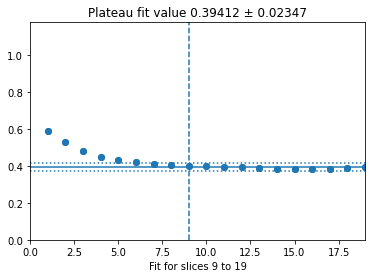

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


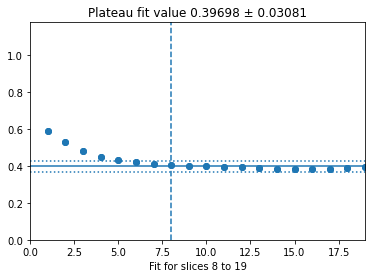

Adjusted to 8


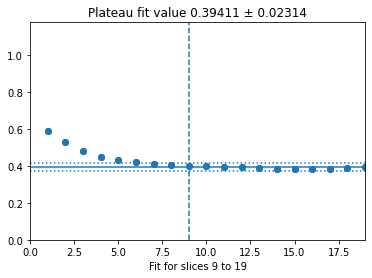

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


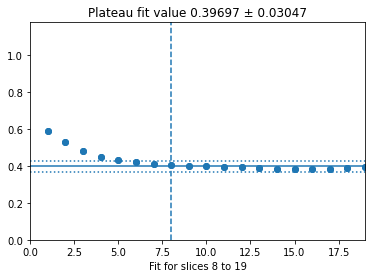

Adjusted to 8


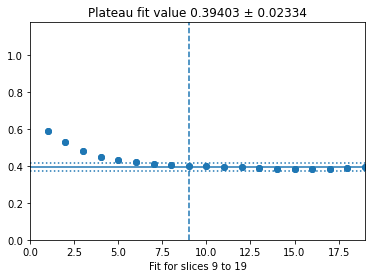

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


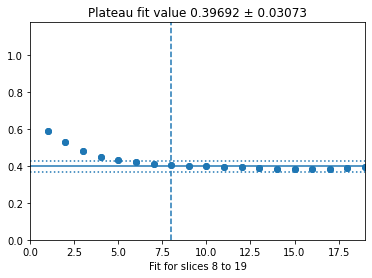

Adjusted to 8


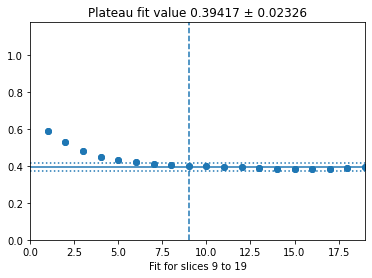

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


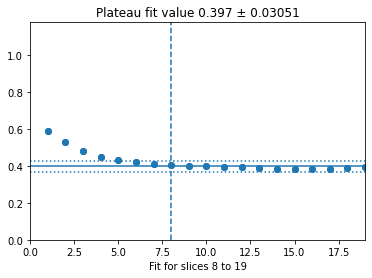

Adjusted to 8


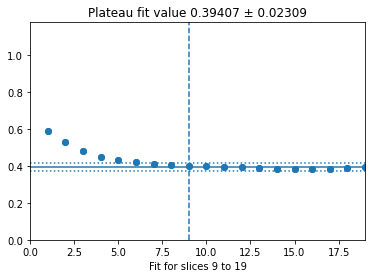

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


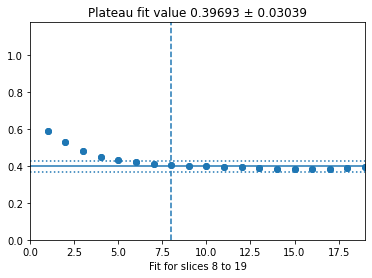

Adjusted to 8


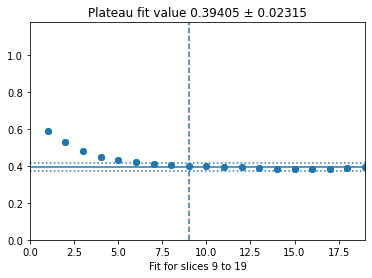

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


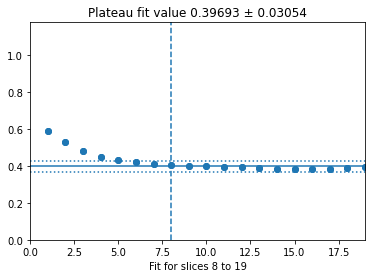

Adjusted to 8


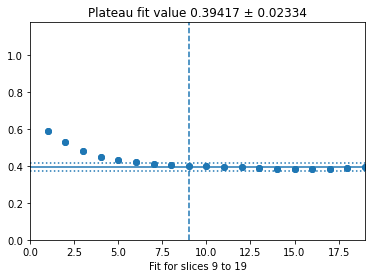

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


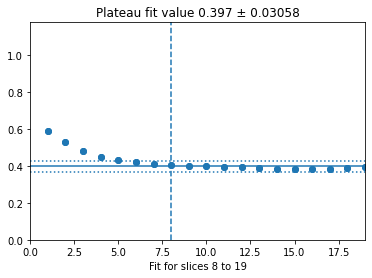

Adjusted to 8


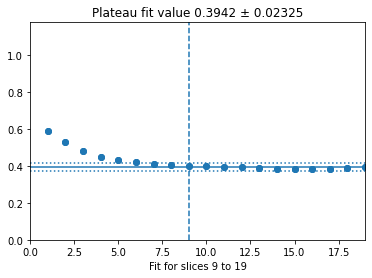

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


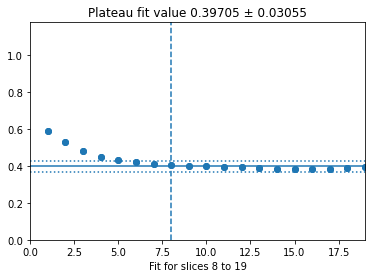

Adjusted to 8


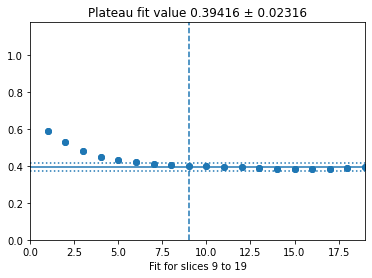

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


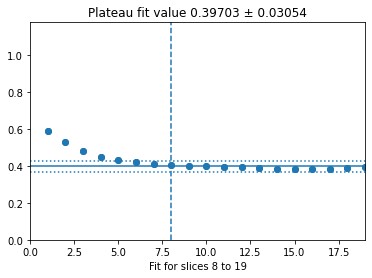

Adjusted to 8


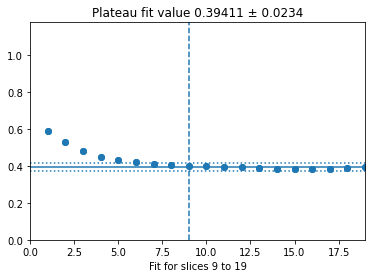

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


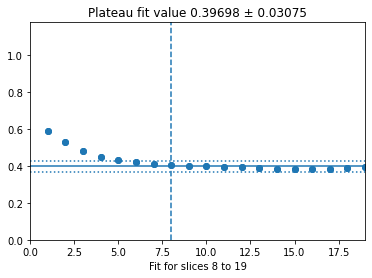

Adjusted to 8


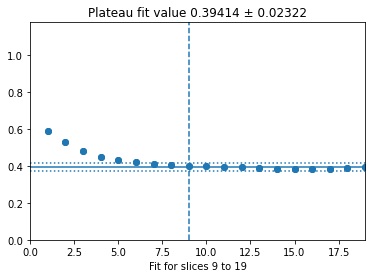

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


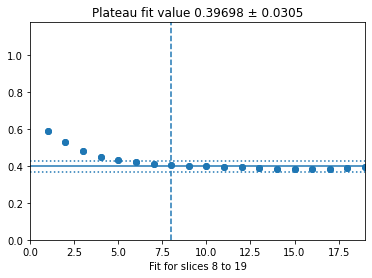

Adjusted to 8


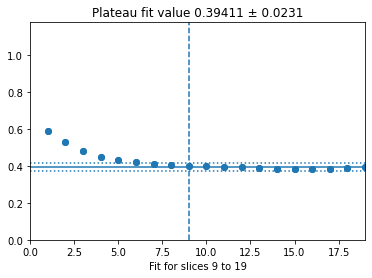

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


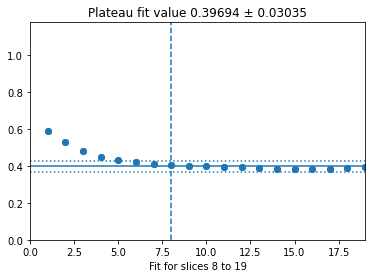

Adjusted to 8


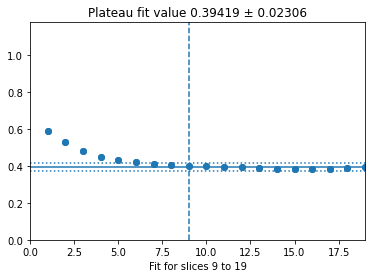

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


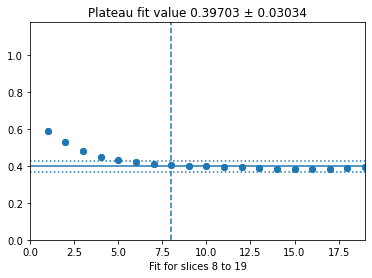

Adjusted to 8


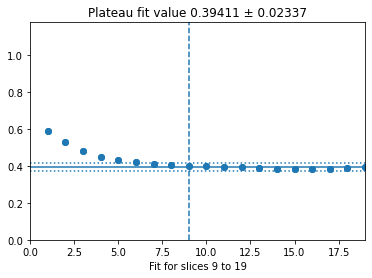

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


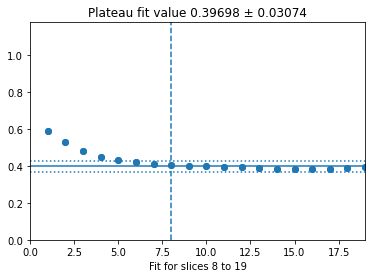

Adjusted to 8


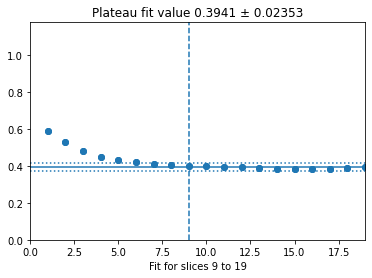

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


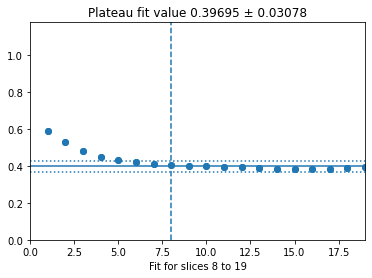

Adjusted to 8


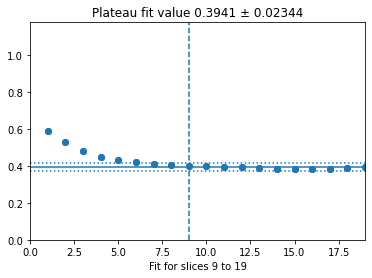

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


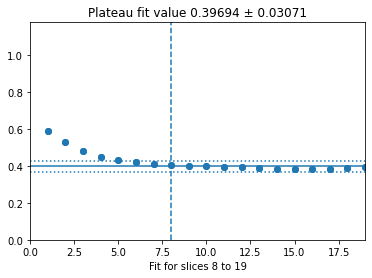

Adjusted to 8


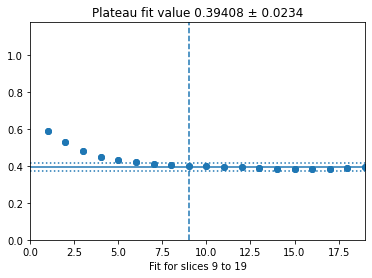

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


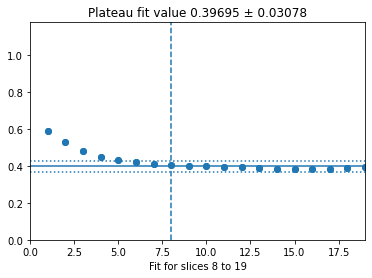

Adjusted to 8


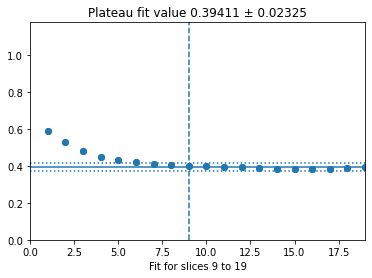

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


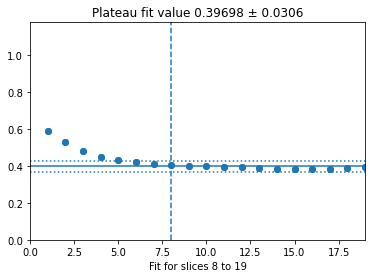

Adjusted to 8


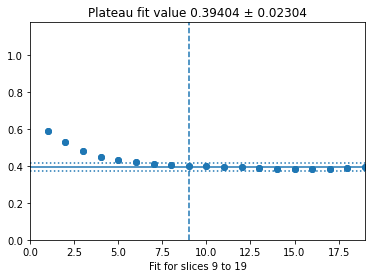

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


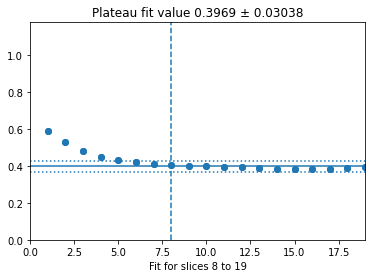

Adjusted to 8


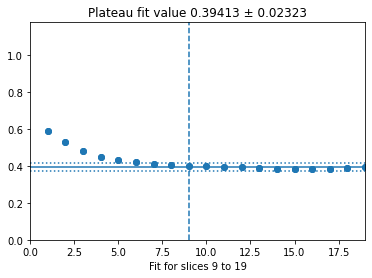

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


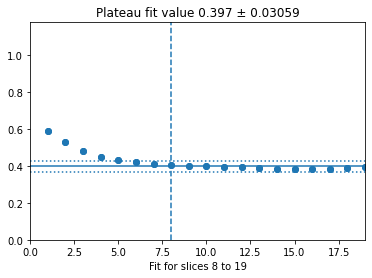

Adjusted to 8


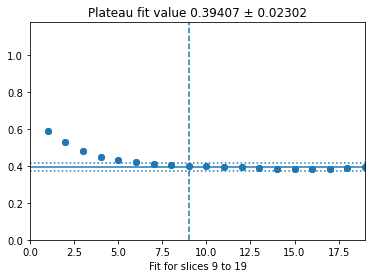

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


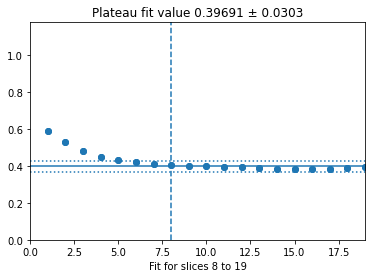

Adjusted to 8


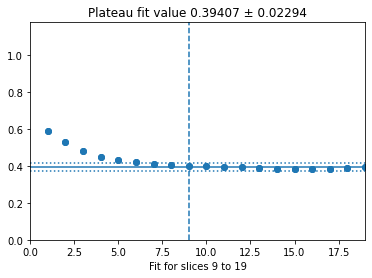

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


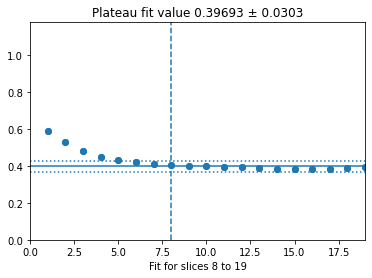

Adjusted to 8


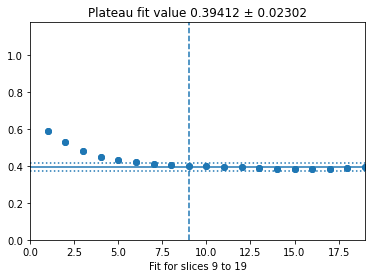

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


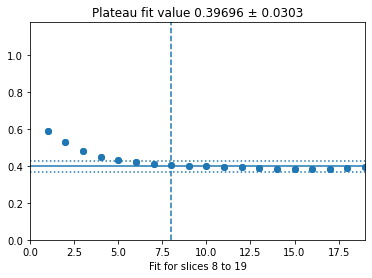

Adjusted to 8


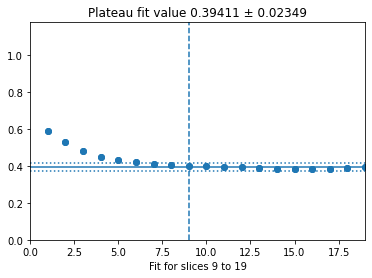

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


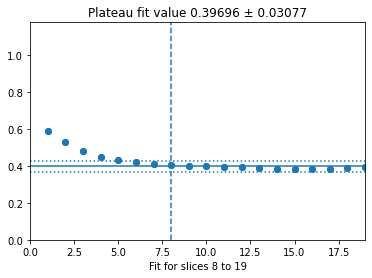

Adjusted to 8


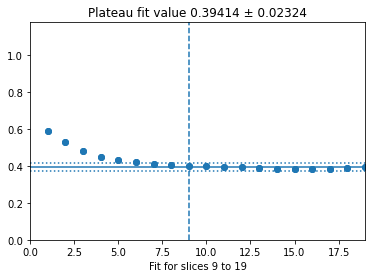

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


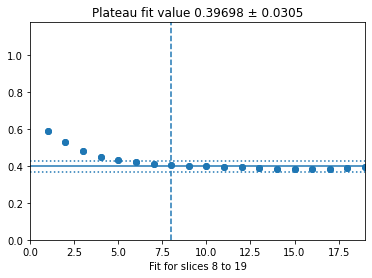

Adjusted to 8


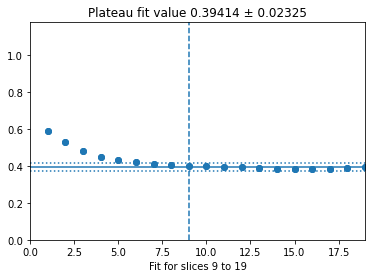

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


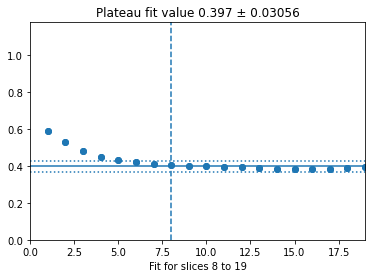

Adjusted to 8


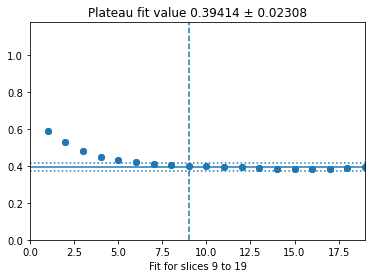

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


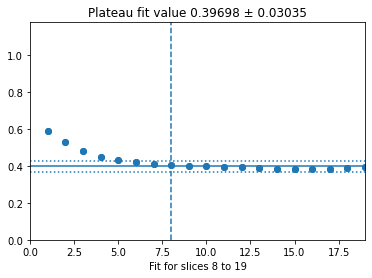

Adjusted to 8


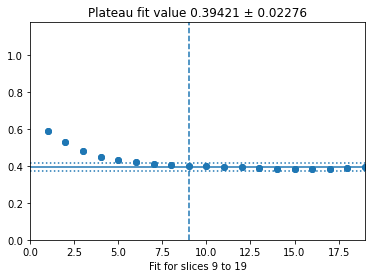

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


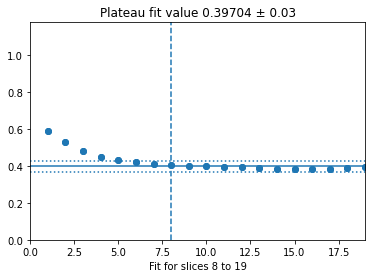

Adjusted to 8


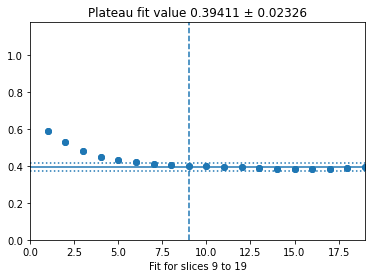

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


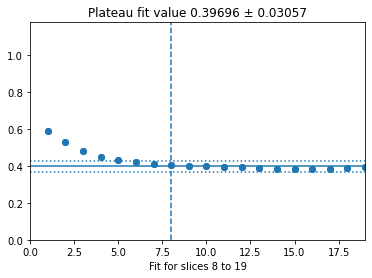

Adjusted to 8


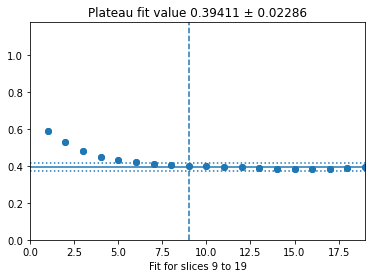

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


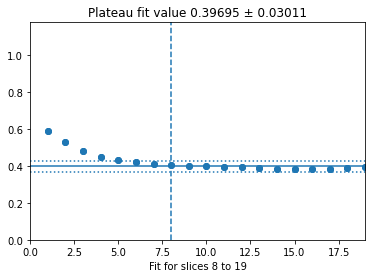

Adjusted to 8


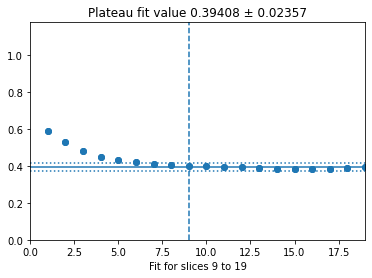

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


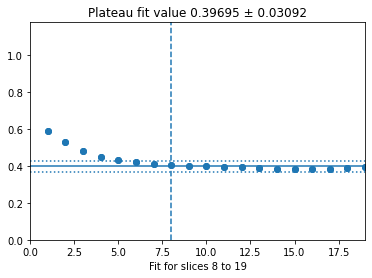

Adjusted to 8


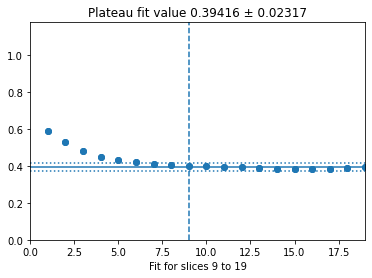

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


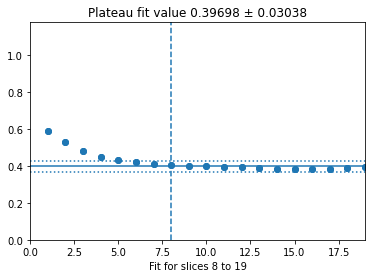

Adjusted to 8


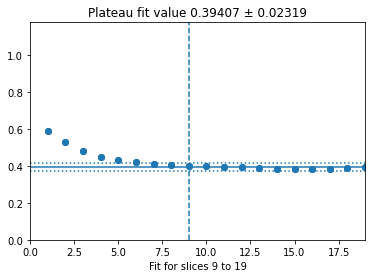

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


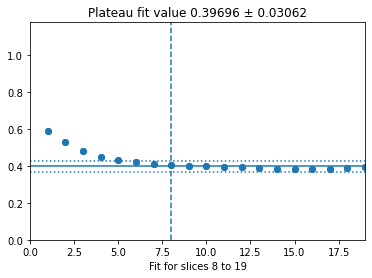

Adjusted to 8


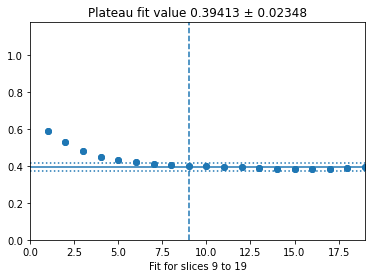

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


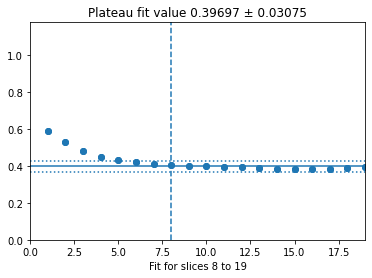

Adjusted to 8


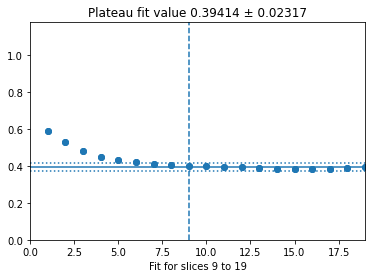

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


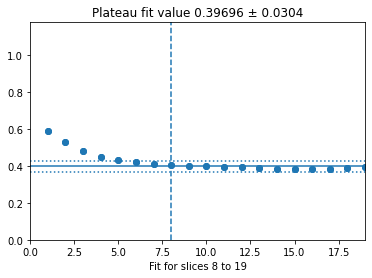

Adjusted to 8


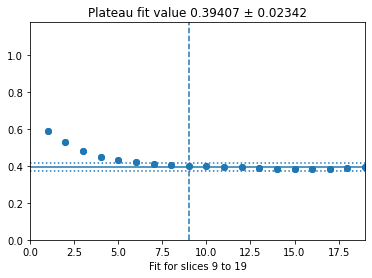

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


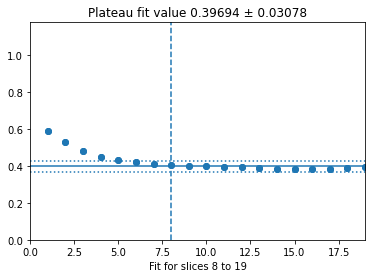

Adjusted to 8


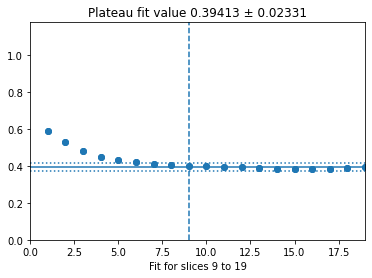

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


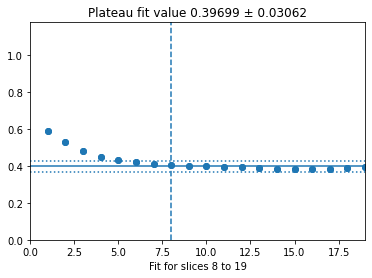

Adjusted to 8


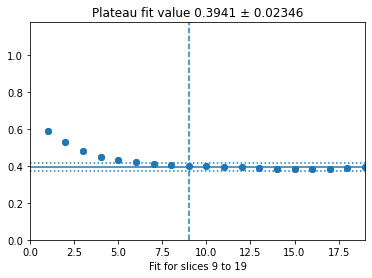

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


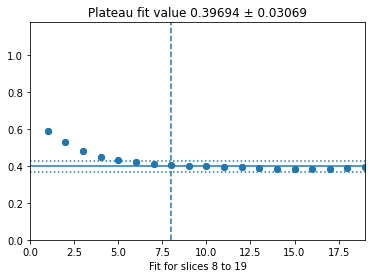

Adjusted to 8


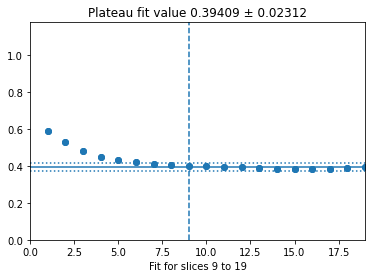

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


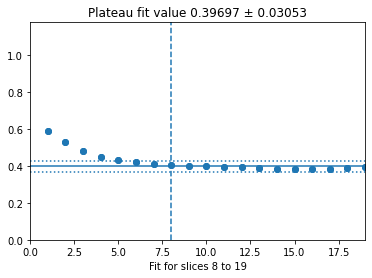

Adjusted to 8


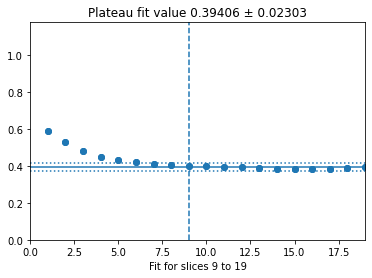

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


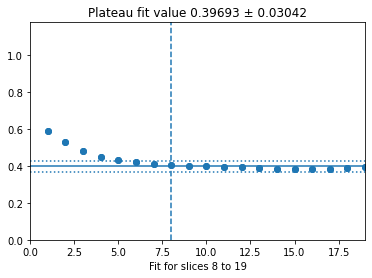

Adjusted to 8


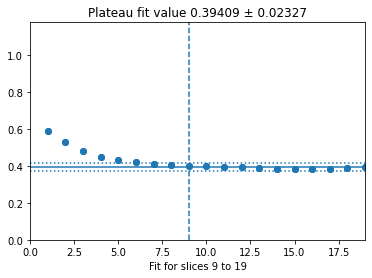

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


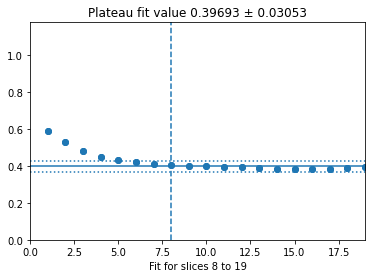

Adjusted to 8


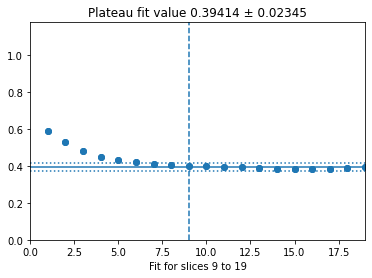

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


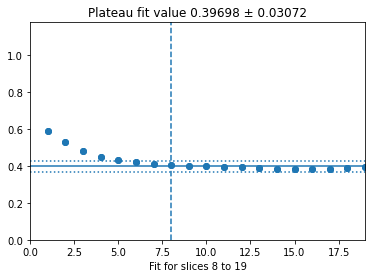

Adjusted to 8


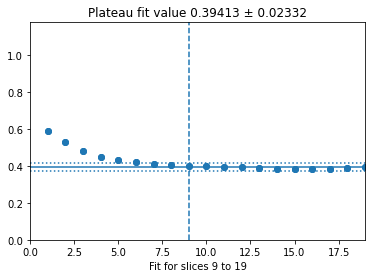

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


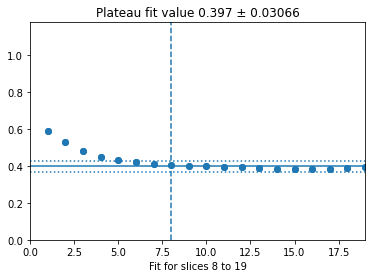

Adjusted to 8


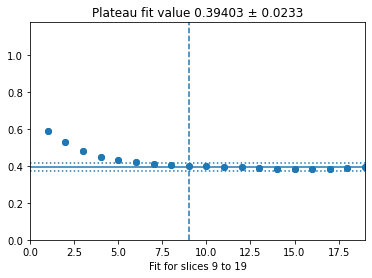

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


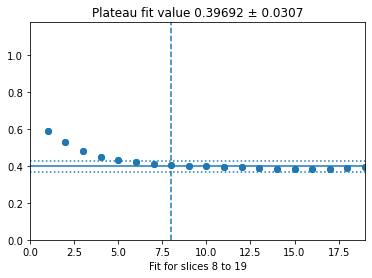

Adjusted to 8


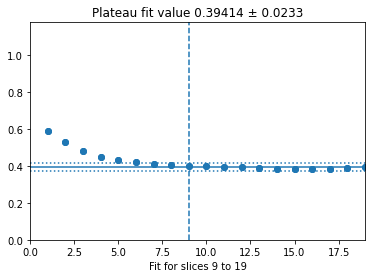

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


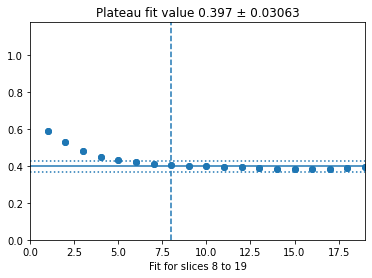

Adjusted to 8


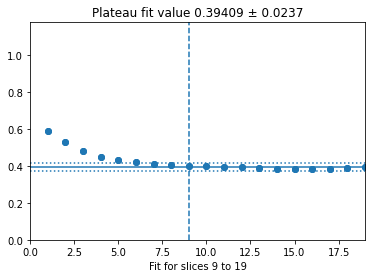

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


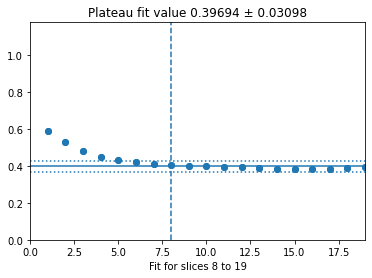

Adjusted to 8


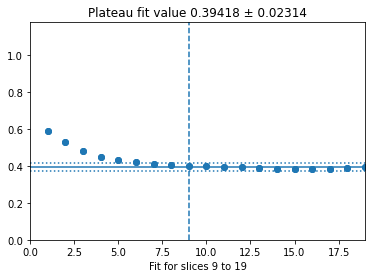

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


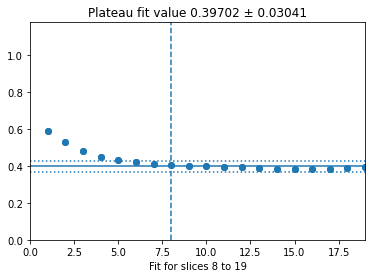

Adjusted to 8


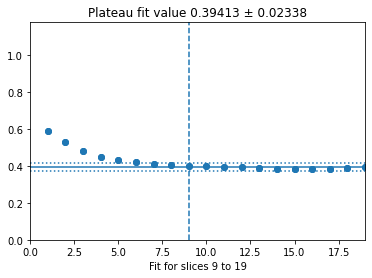

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


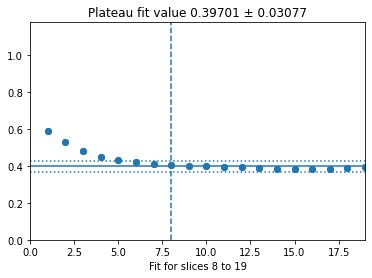

Adjusted to 8


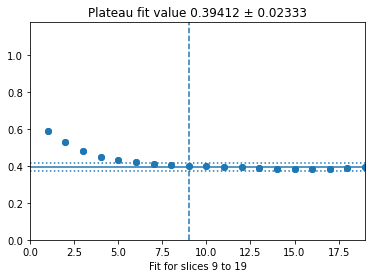

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


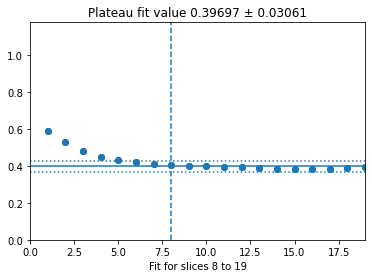

Adjusted to 8


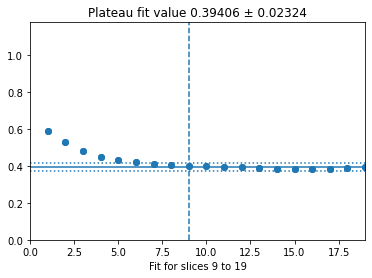

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


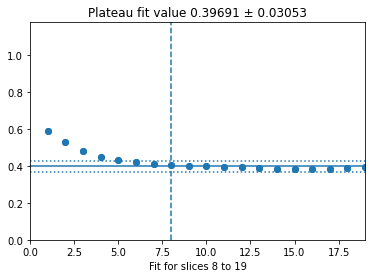

Adjusted to 8


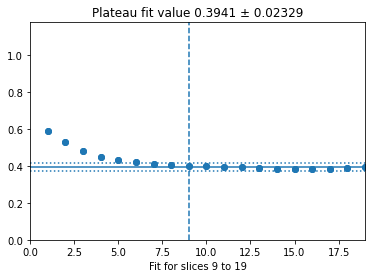

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


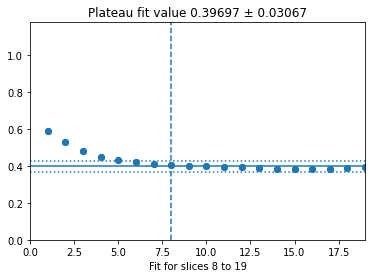

Adjusted to 8


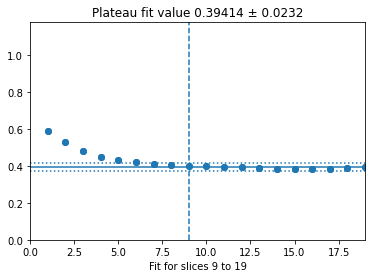

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


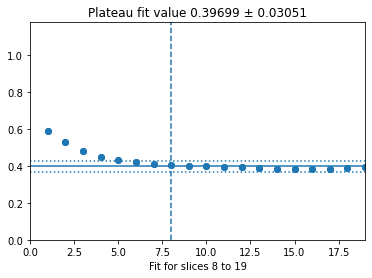

Adjusted to 8


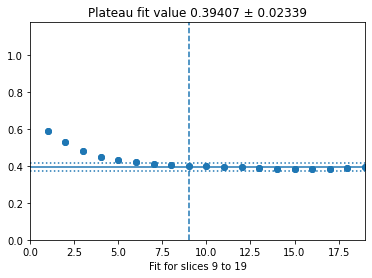

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


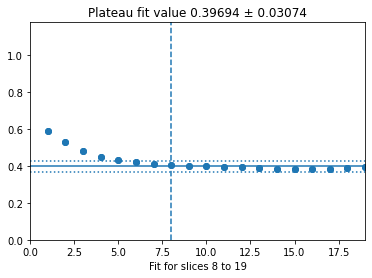

Adjusted to 8


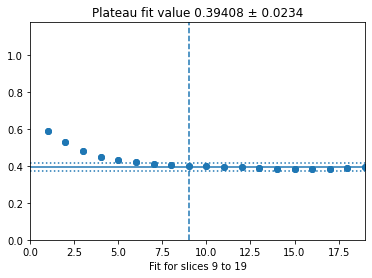

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


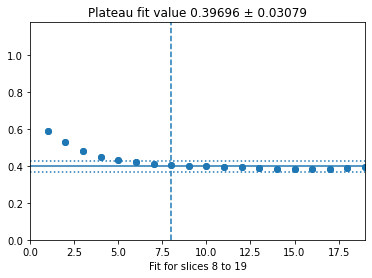

Adjusted to 8


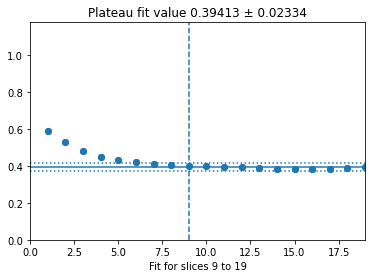

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


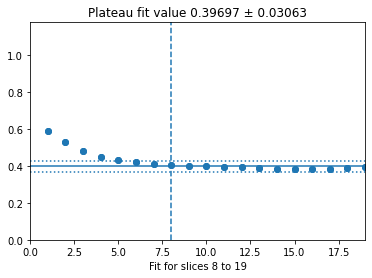

Adjusted to 8


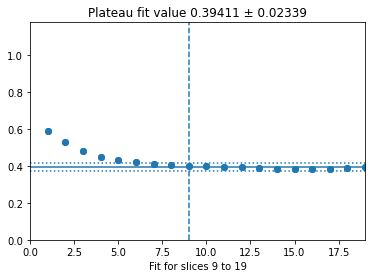

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


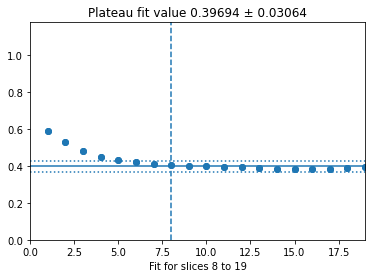

Adjusted to 8


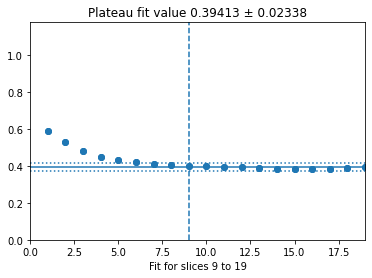

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


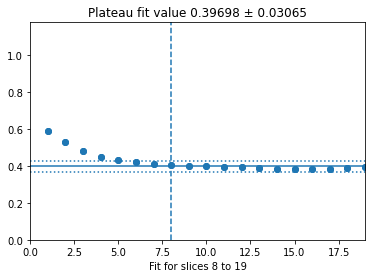

Adjusted to 8


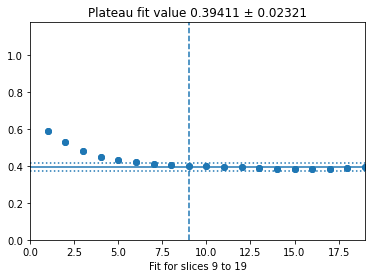

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


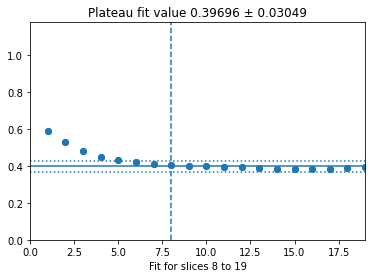

Adjusted to 8


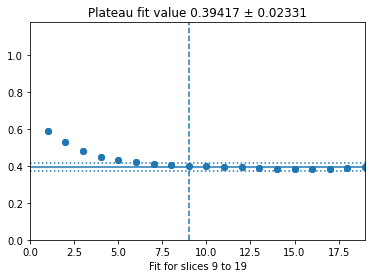

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


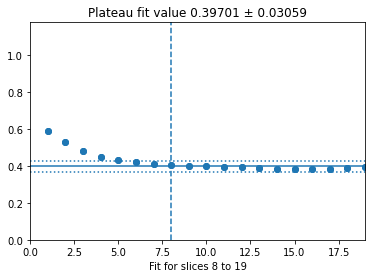

Adjusted to 8


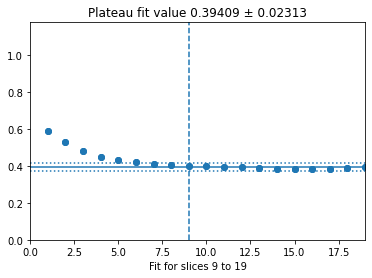

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


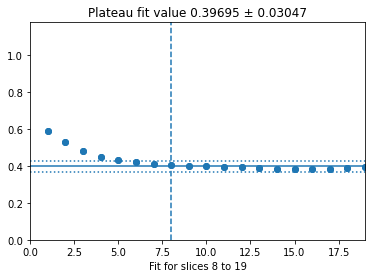

Adjusted to 8


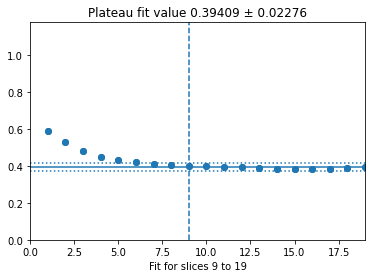

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


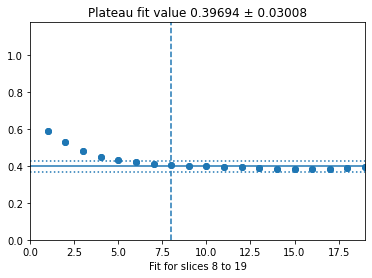

Adjusted to 8


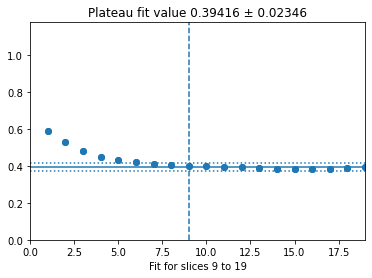

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


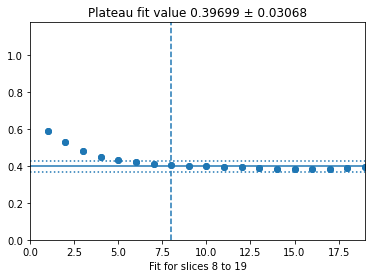

Adjusted to 8


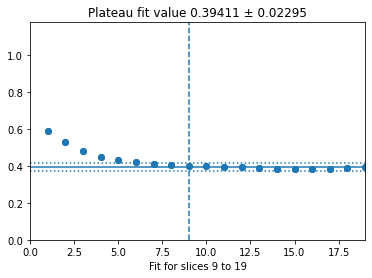

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


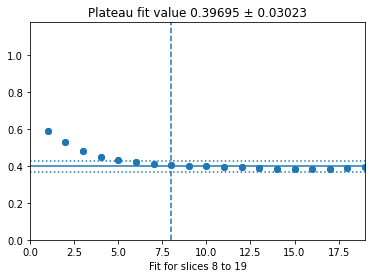

Adjusted to 8


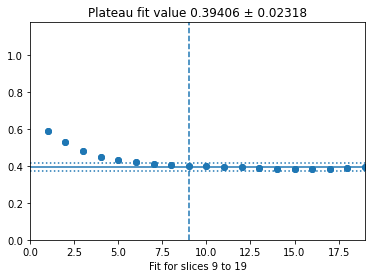

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


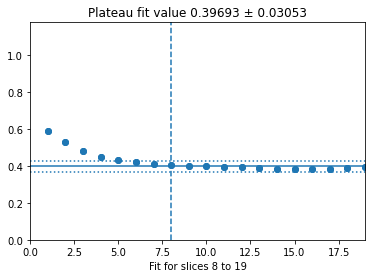

Adjusted to 8


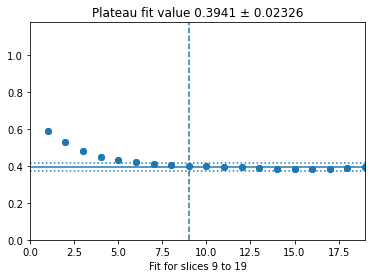

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


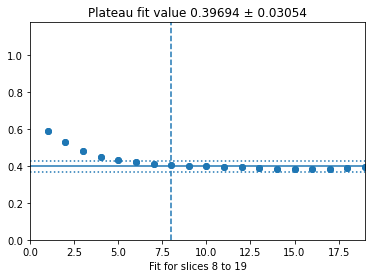

Adjusted to 8


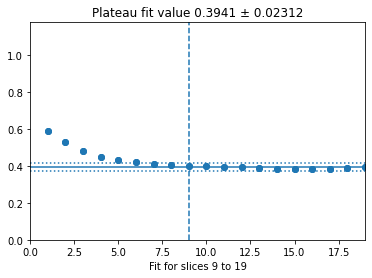

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


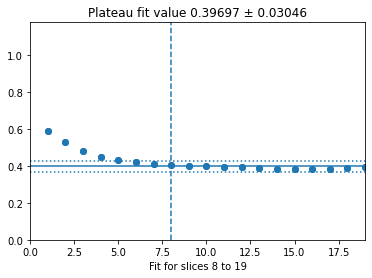

Adjusted to 8


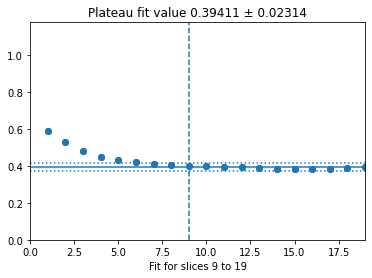

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


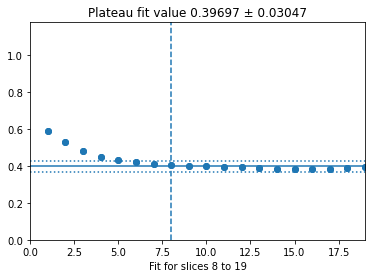

Adjusted to 8


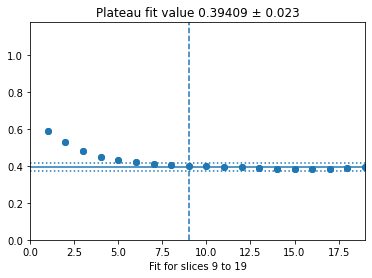

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


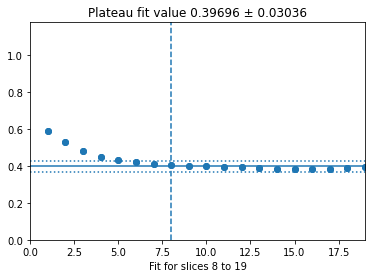

Adjusted to 8


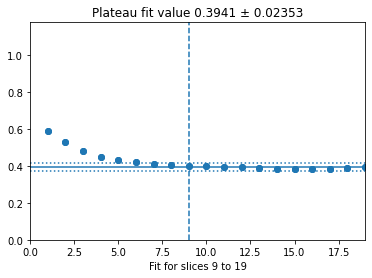

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


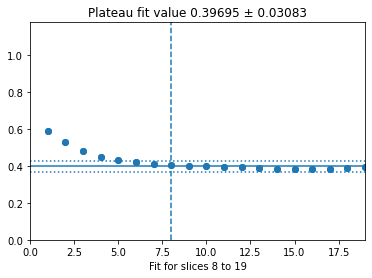

Adjusted to 8


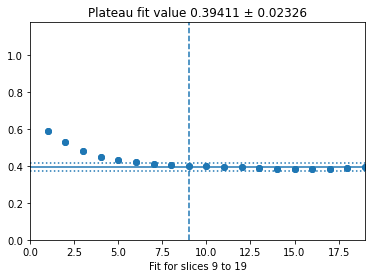

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


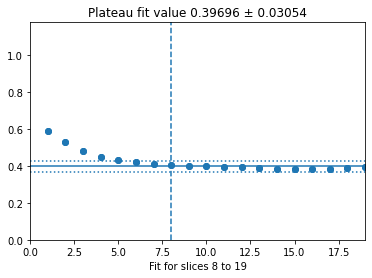

Adjusted to 8


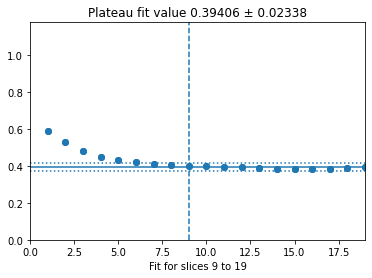

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


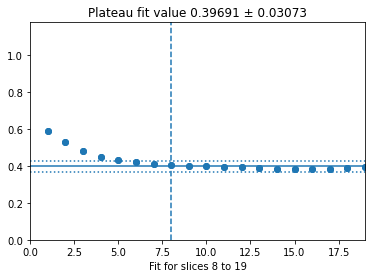

Adjusted to 8


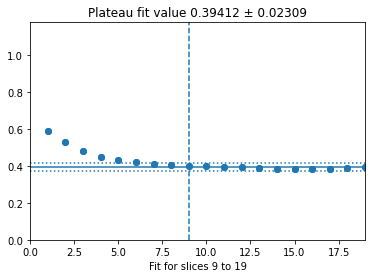

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


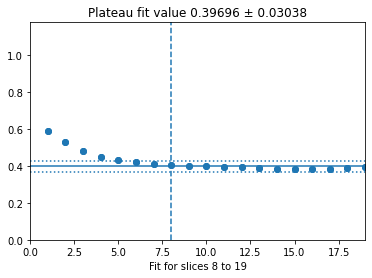

Adjusted to 8


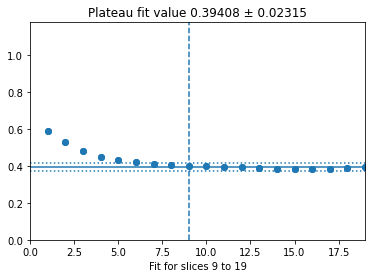

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


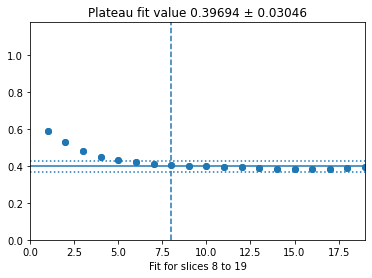

Adjusted to 8


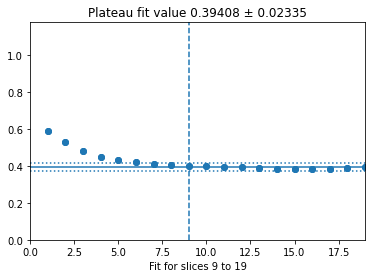

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


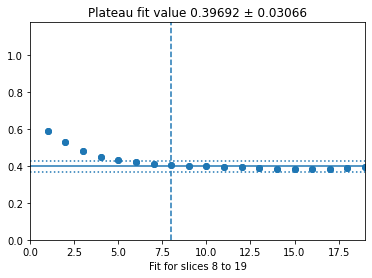

Adjusted to 8


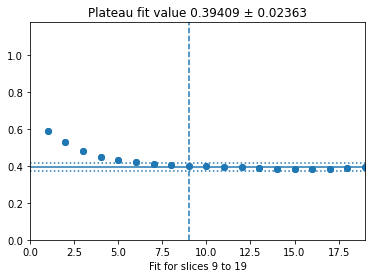

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


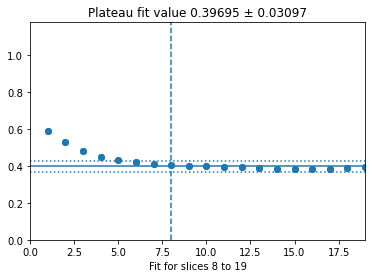

Adjusted to 8


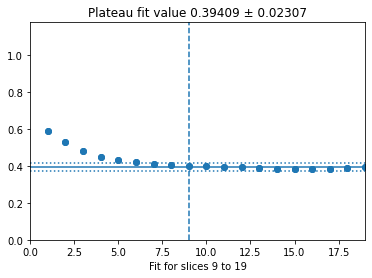

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


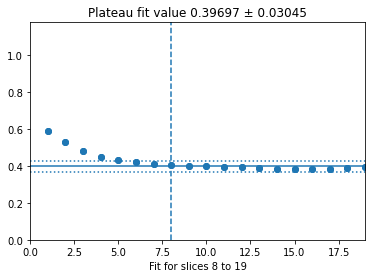

Adjusted to 8


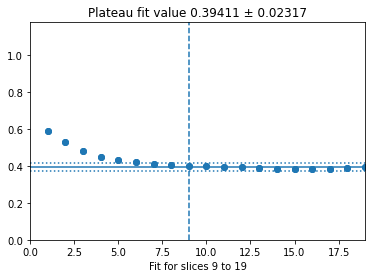

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


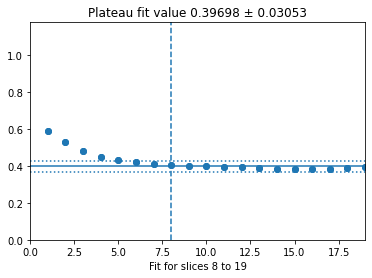

Adjusted to 8


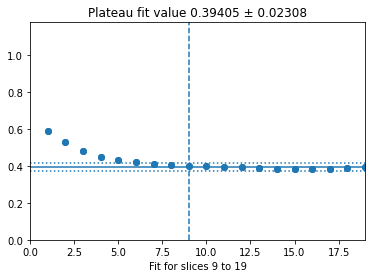

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


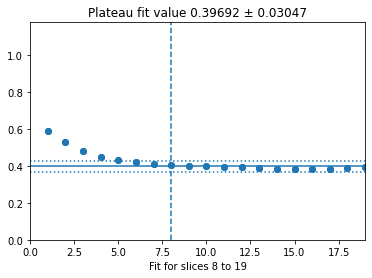

Adjusted to 8


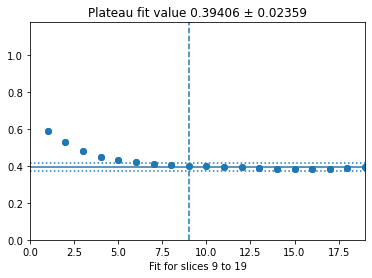

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


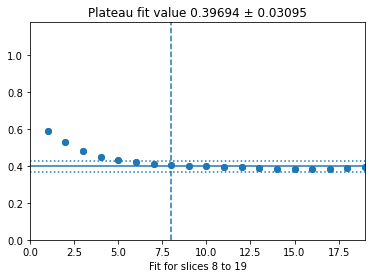

Adjusted to 8


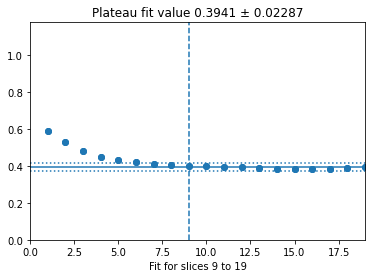

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


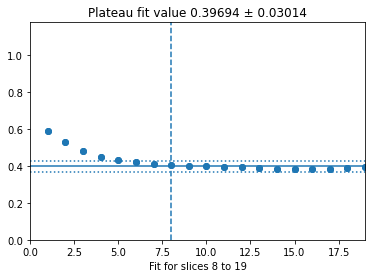

Adjusted to 8


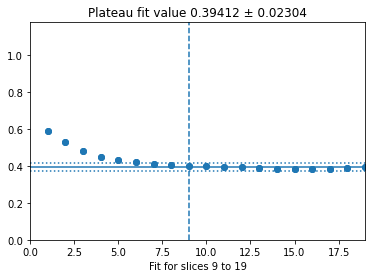

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


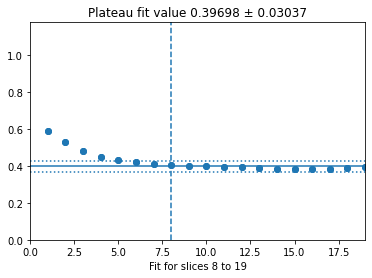

Adjusted to 8


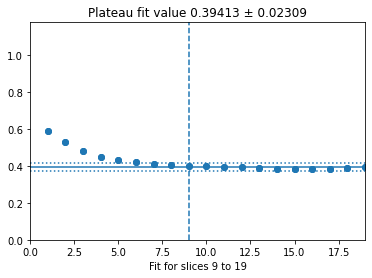

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


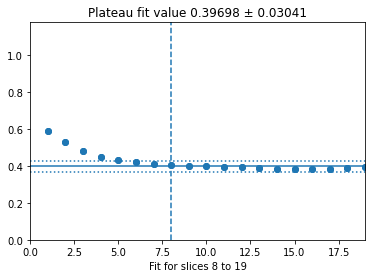

Adjusted to 8


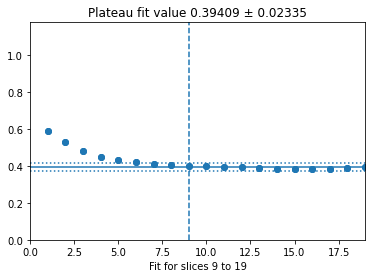

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


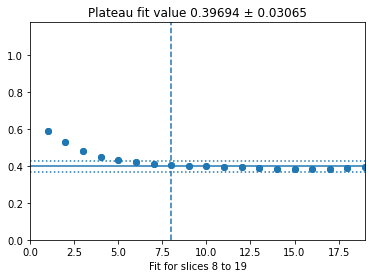

Adjusted to 8


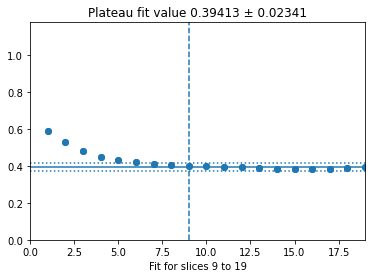

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


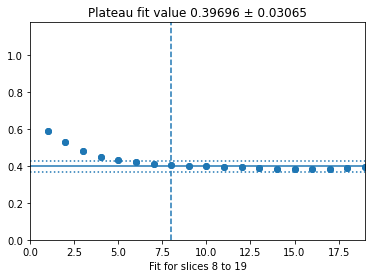

Adjusted to 8


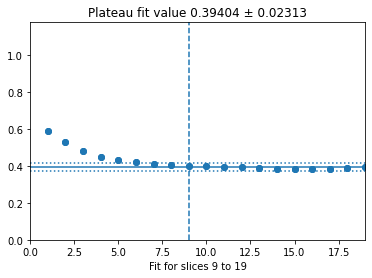

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


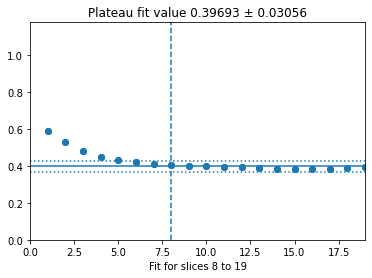

Adjusted to 8


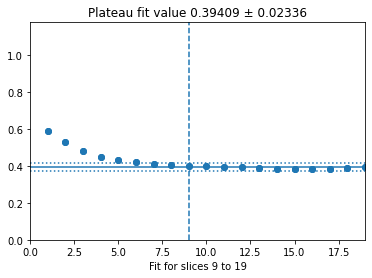

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


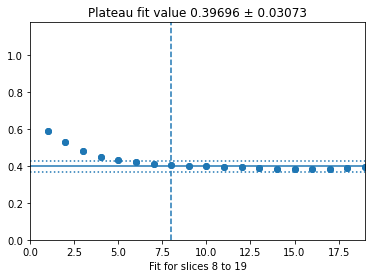

Adjusted to 8


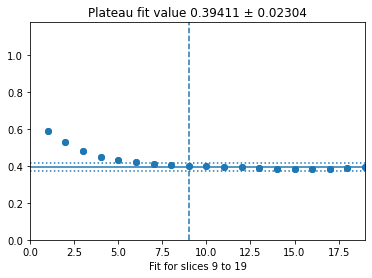

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


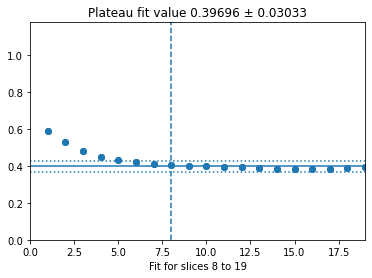

Adjusted to 8


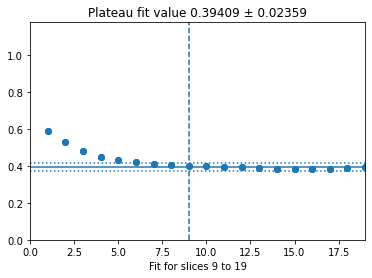

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


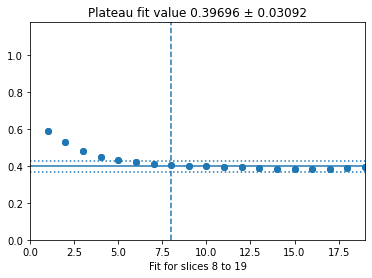

Adjusted to 8


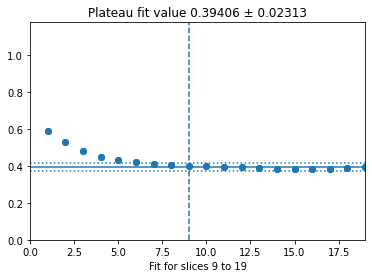

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


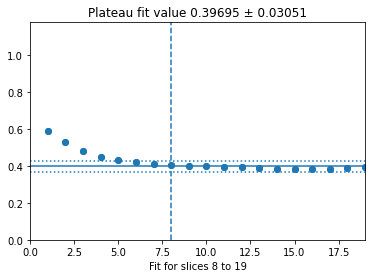

Adjusted to 8


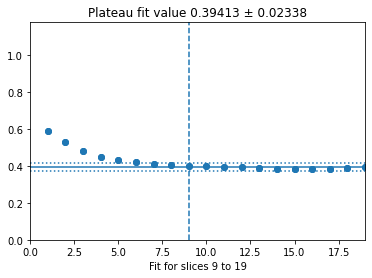

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


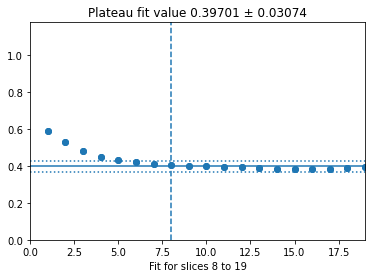

Adjusted to 8


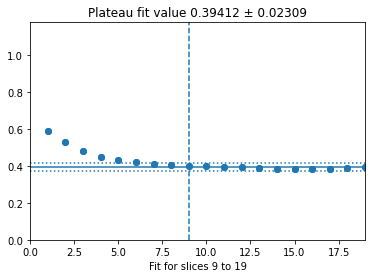

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


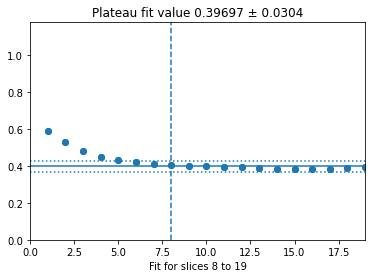

Adjusted to 8


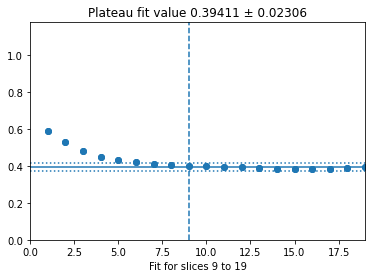

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


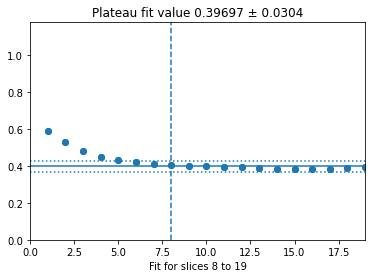

Adjusted to 8


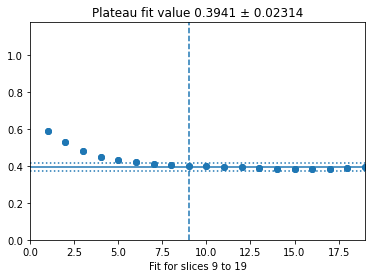

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


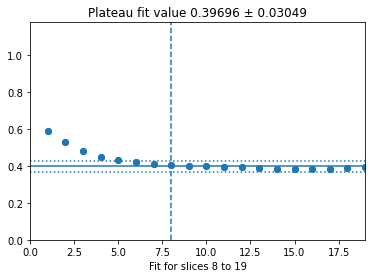

Adjusted to 8


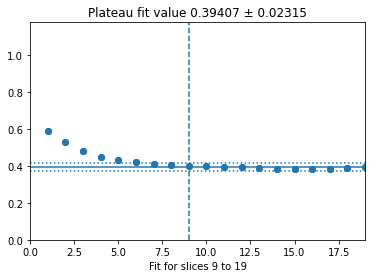

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


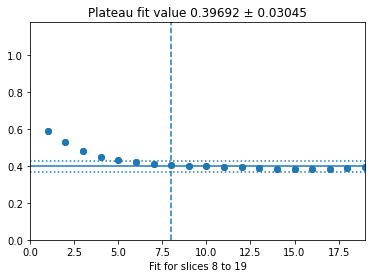

Adjusted to 8


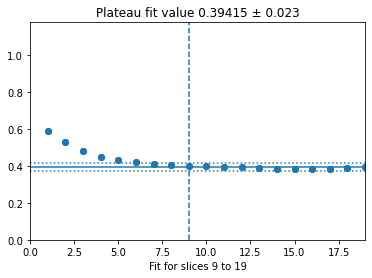

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


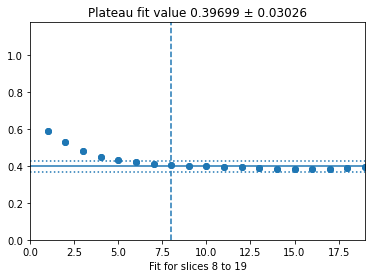

Adjusted to 8


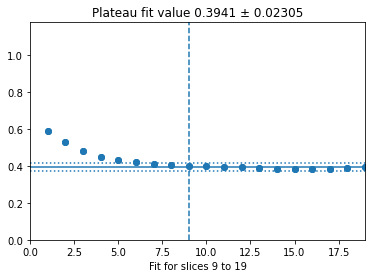

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


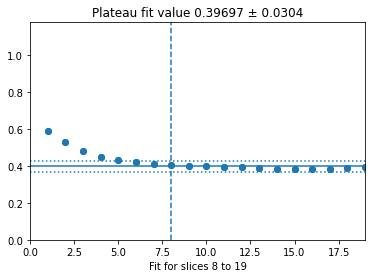

Adjusted to 8


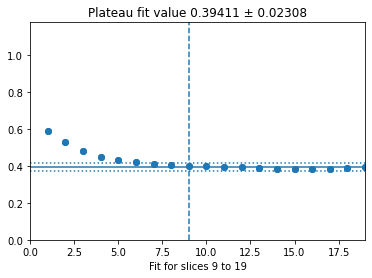

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


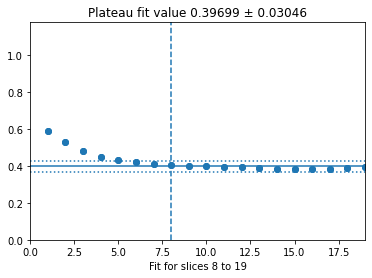

Adjusted to 8


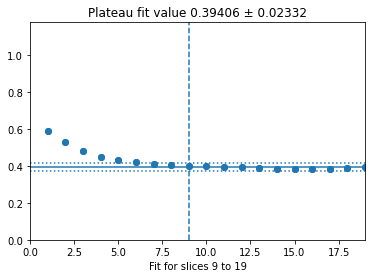

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


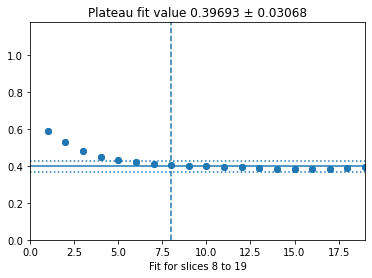

Adjusted to 8


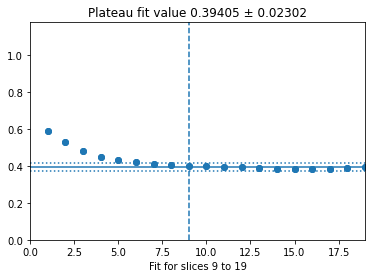

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


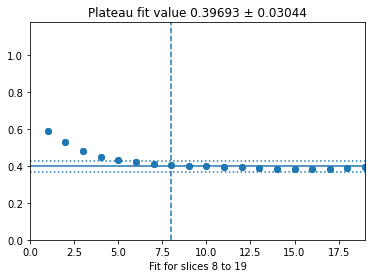

Adjusted to 8


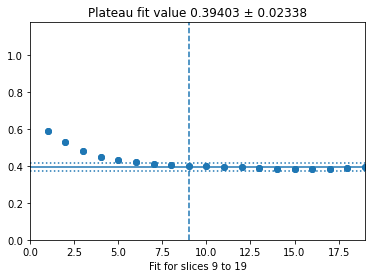

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


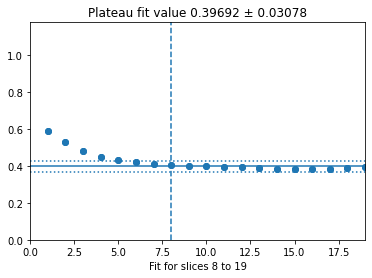

Adjusted to 8


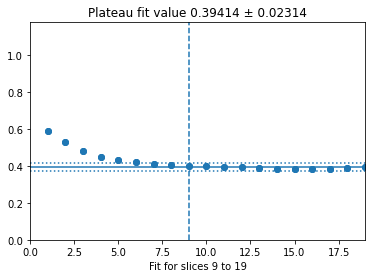

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


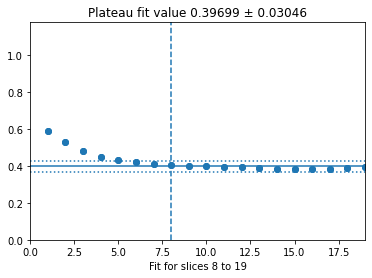

Adjusted to 8


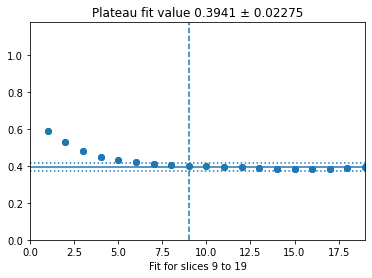

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


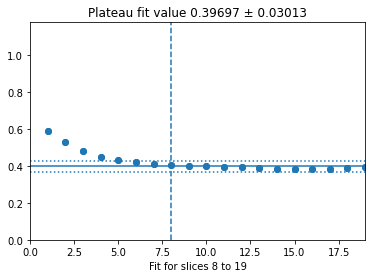

Adjusted to 8


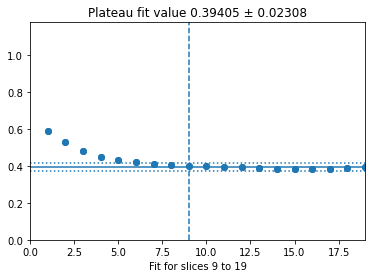

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


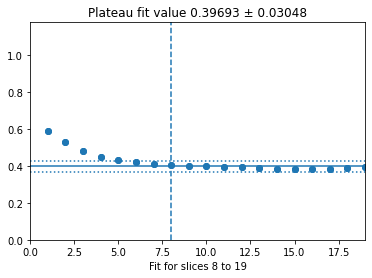

Adjusted to 8


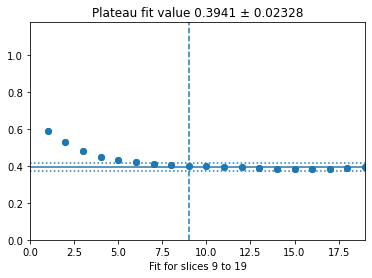

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


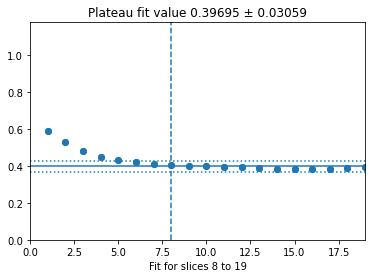

Adjusted to 8


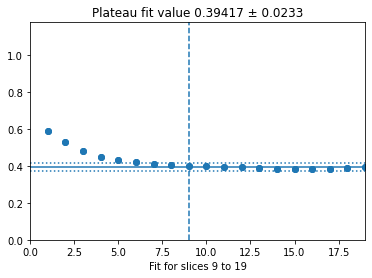

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


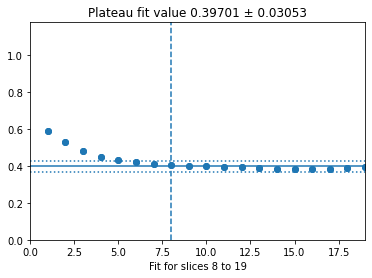

Adjusted to 8


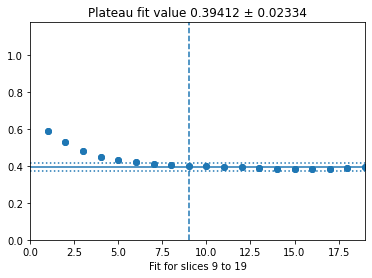

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


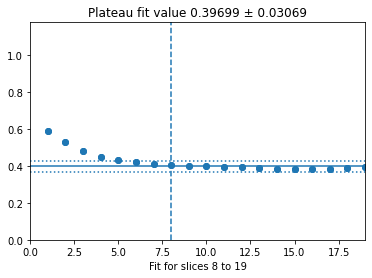

Adjusted to 8


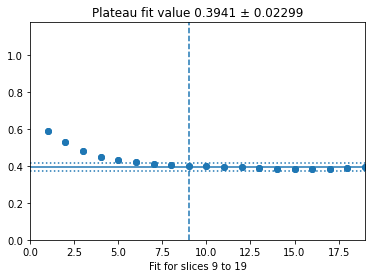

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


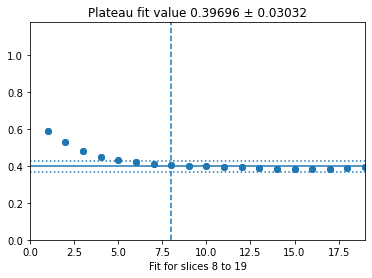

Adjusted to 8


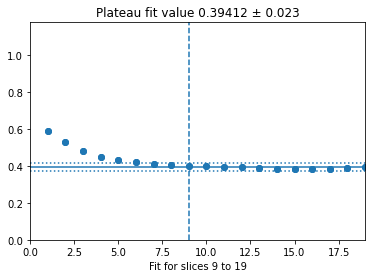

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


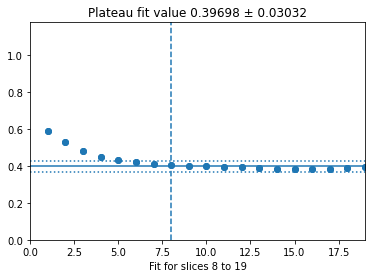

Adjusted to 8


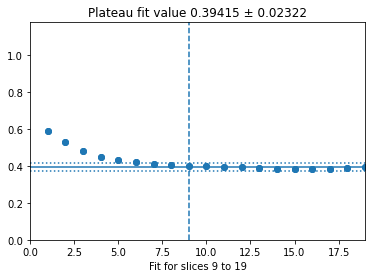

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


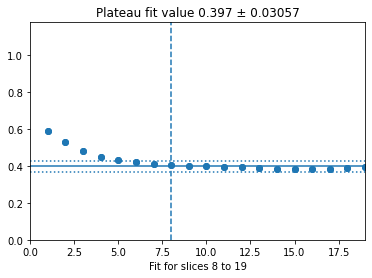

Adjusted to 8


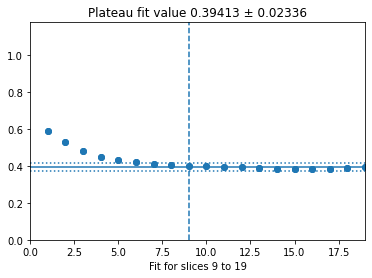

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


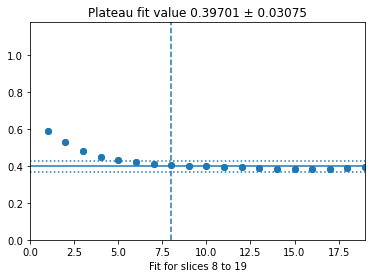

Adjusted to 8


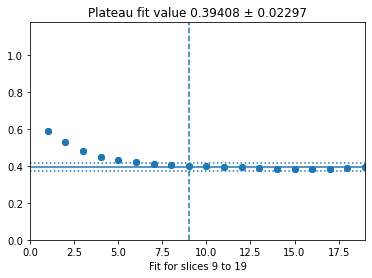

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


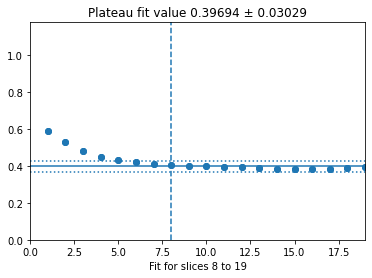

Adjusted to 8


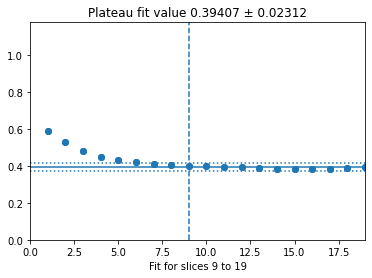

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


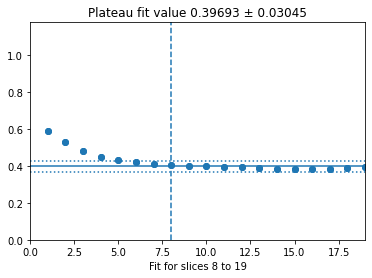

Adjusted to 8


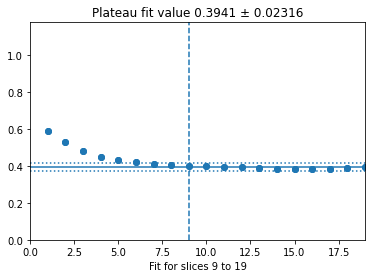

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


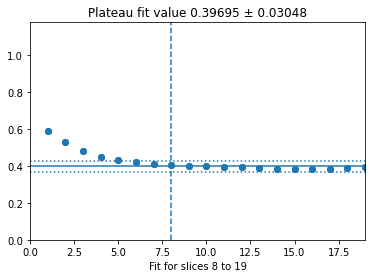

Adjusted to 8


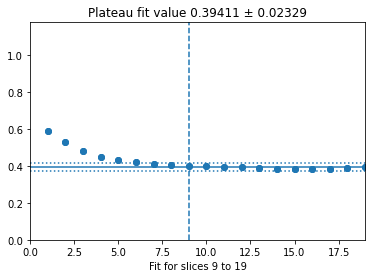

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


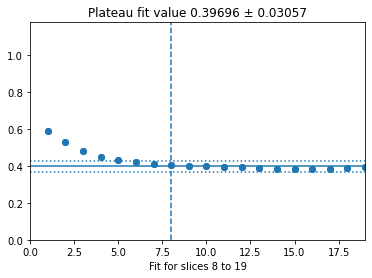

Adjusted to 8


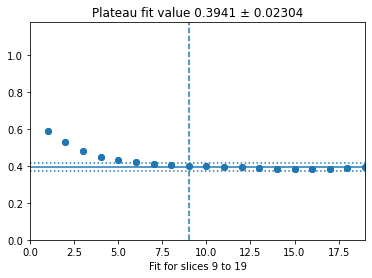

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


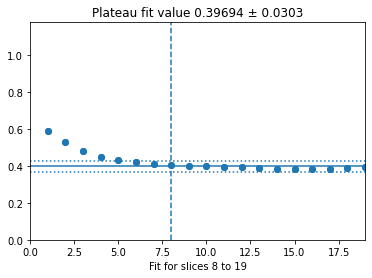

Adjusted to 8


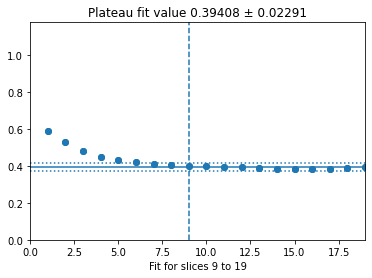

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


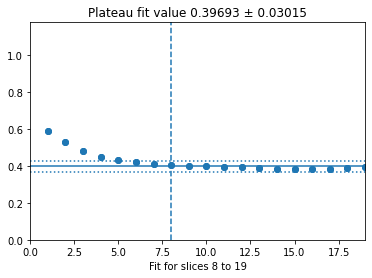

Adjusted to 8


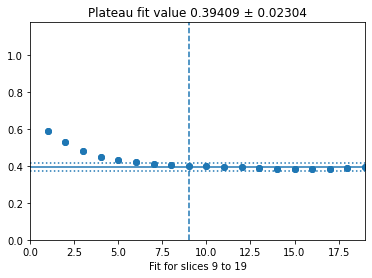

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


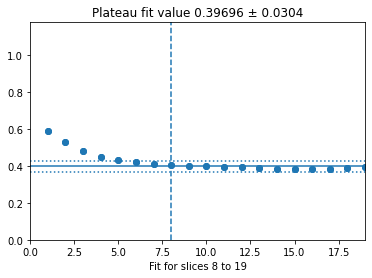

Adjusted to 8


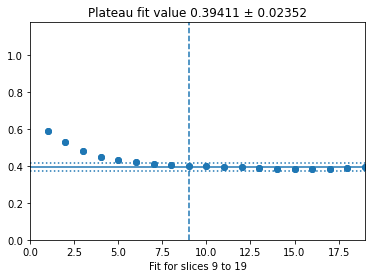

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


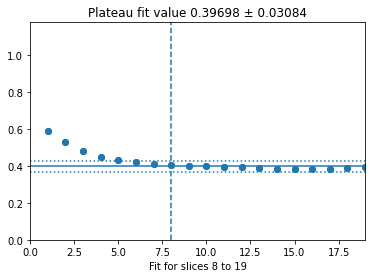

Adjusted to 8


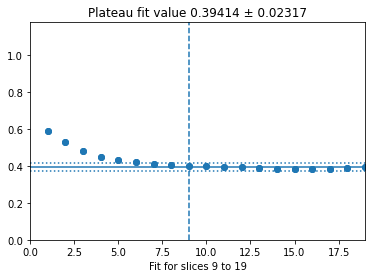

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


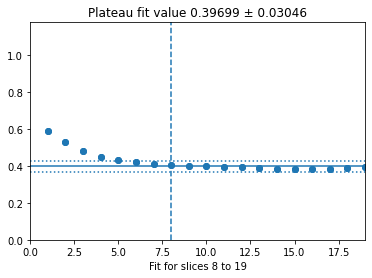

Adjusted to 8


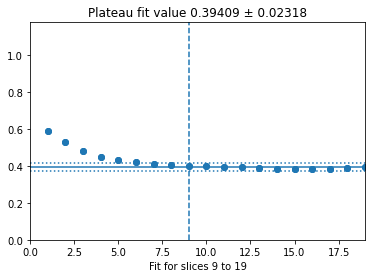

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


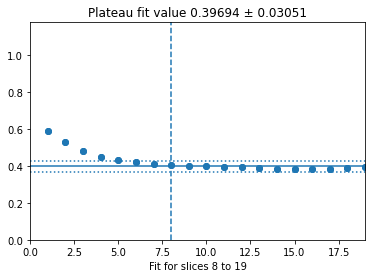

Adjusted to 8


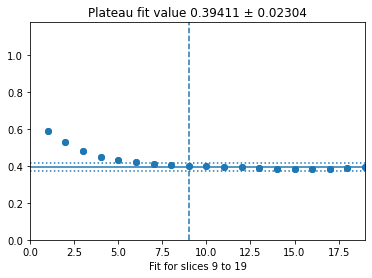

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


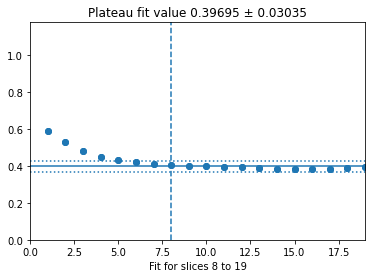

Adjusted to 8


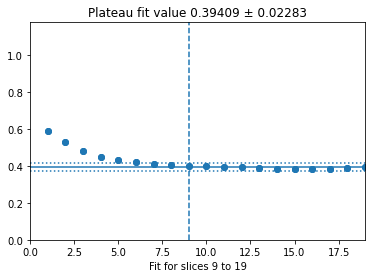

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


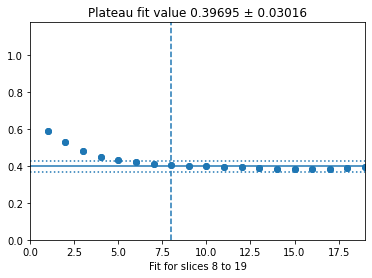

Adjusted to 8


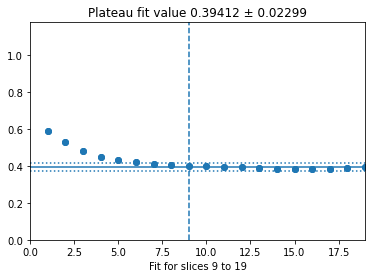

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


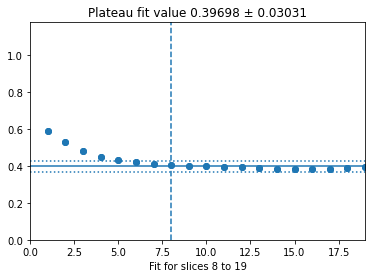

Adjusted to 8


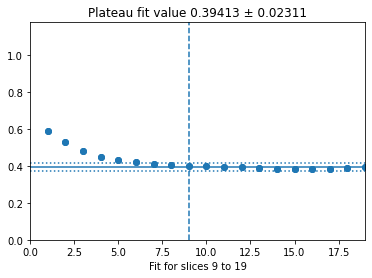

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


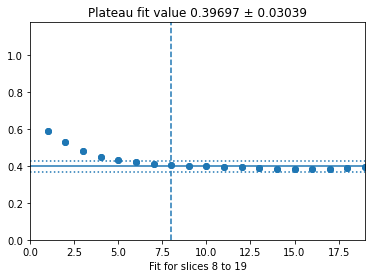

Adjusted to 8


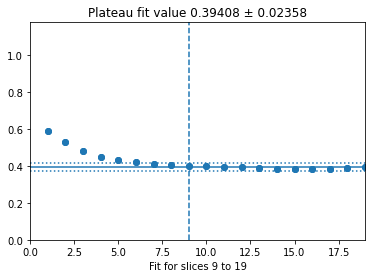

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


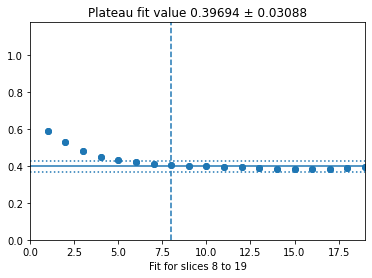

Adjusted to 8


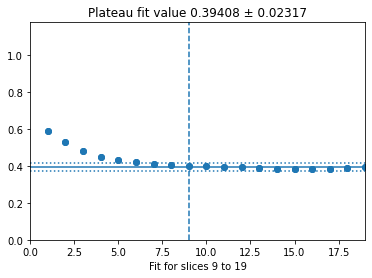

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


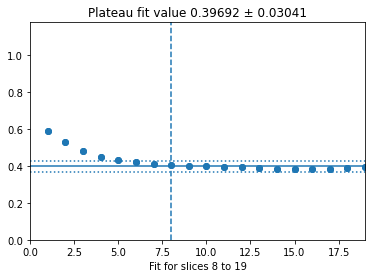

Adjusted to 8


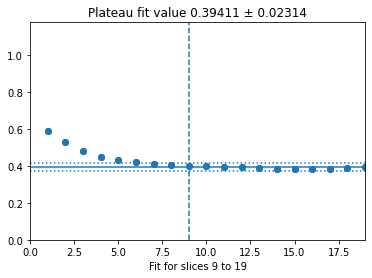

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


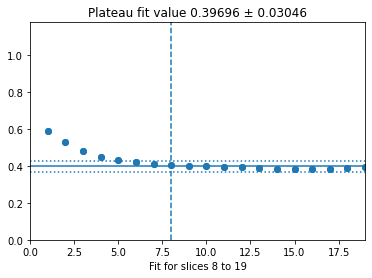

Adjusted to 8


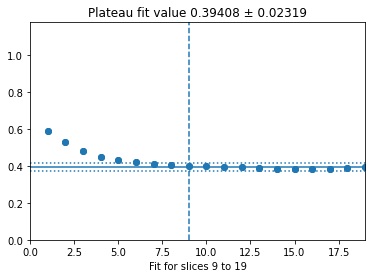

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


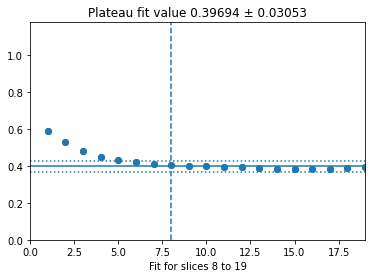

Adjusted to 8


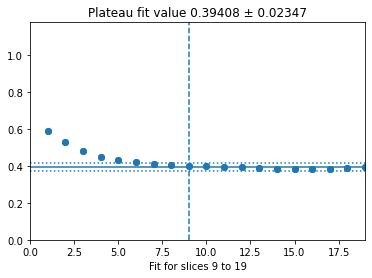

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


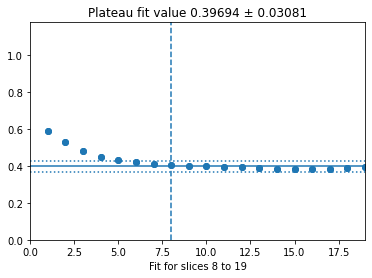

Adjusted to 8


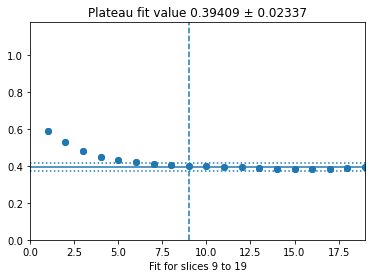

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


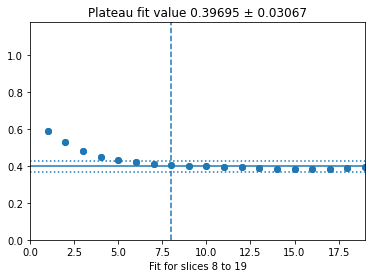

Adjusted to 8


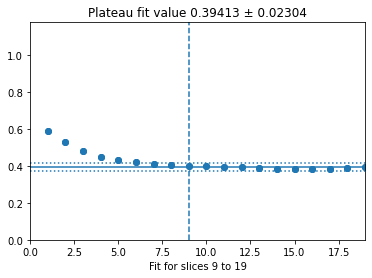

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


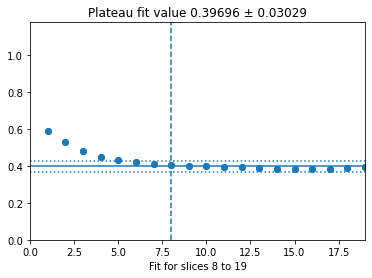

Adjusted to 8


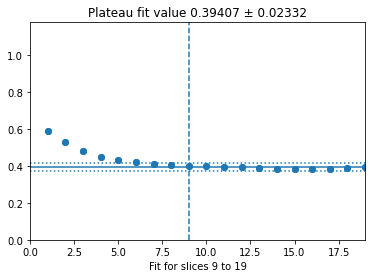

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


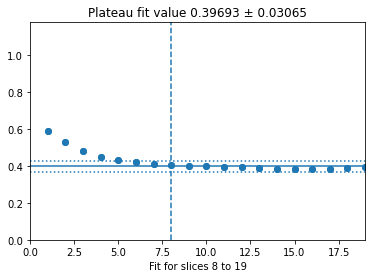

Adjusted to 8


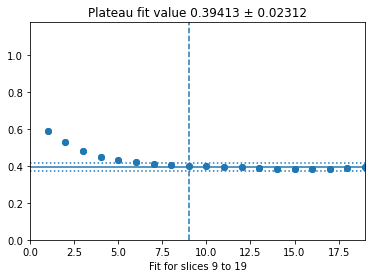

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


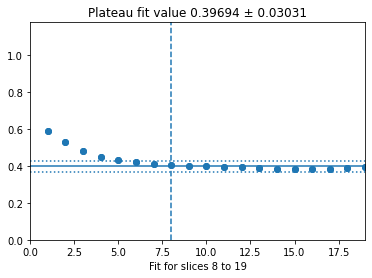

Adjusted to 8


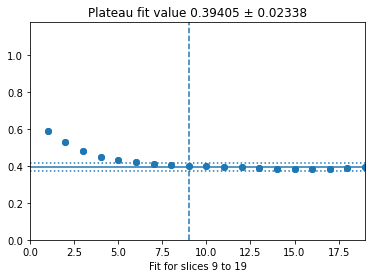

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


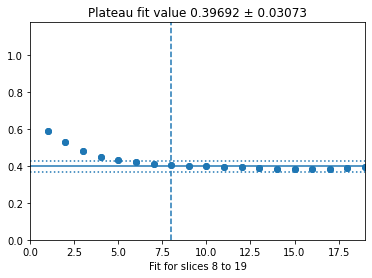

Adjusted to 8


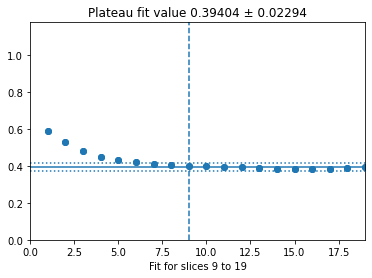

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


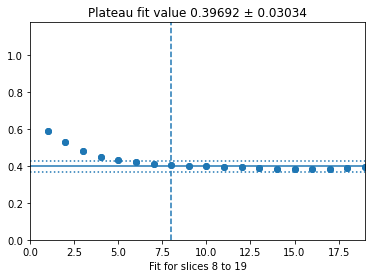

Adjusted to 8


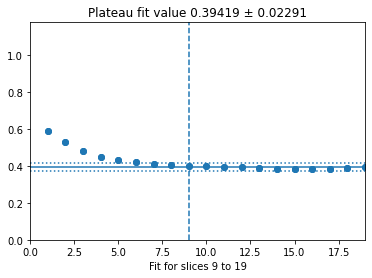

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


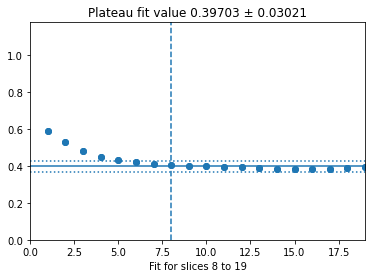

Adjusted to 8


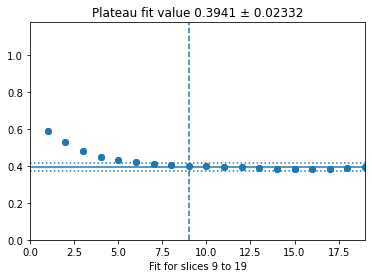

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


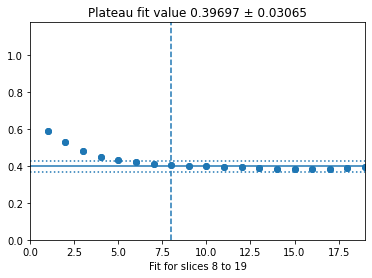

Adjusted to 8


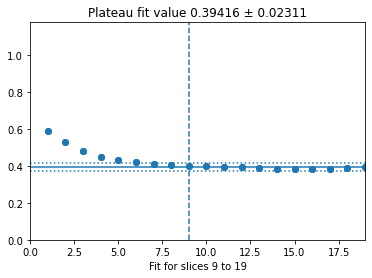

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


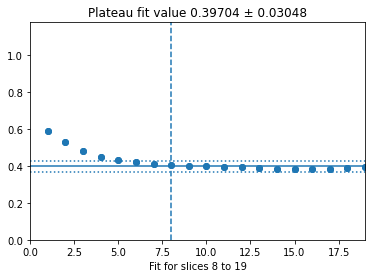

Adjusted to 8


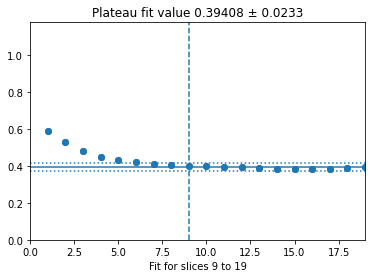

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


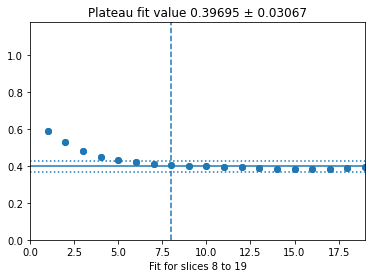

Adjusted to 8


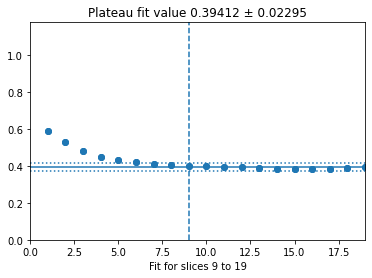

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


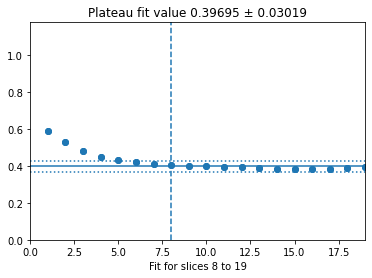

Adjusted to 8


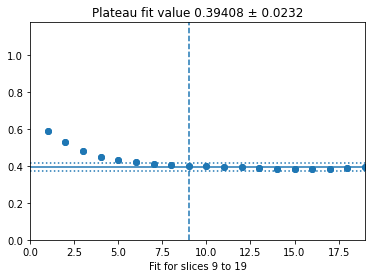

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


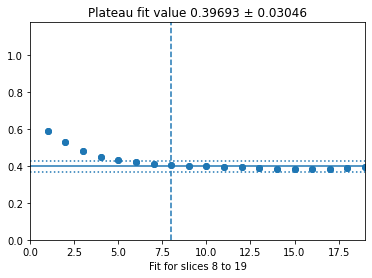

Adjusted to 8


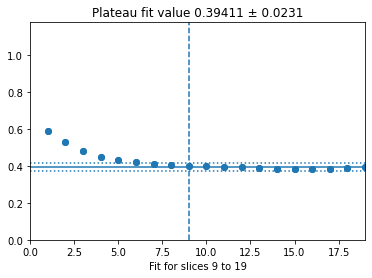

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


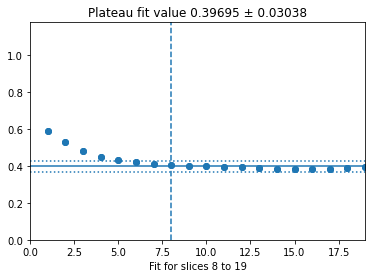

Adjusted to 8


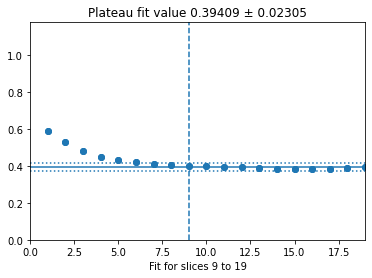

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


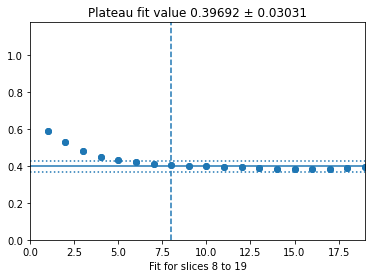

Adjusted to 8


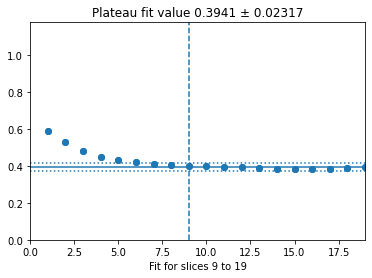

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


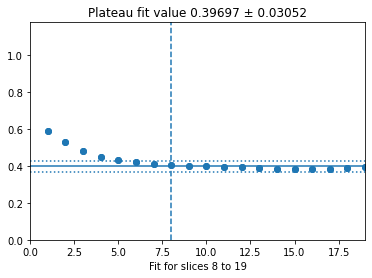

Adjusted to 8


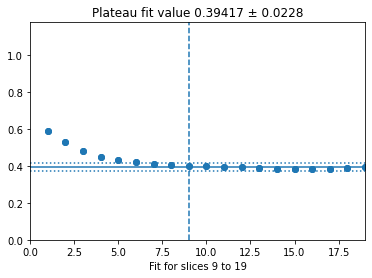

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


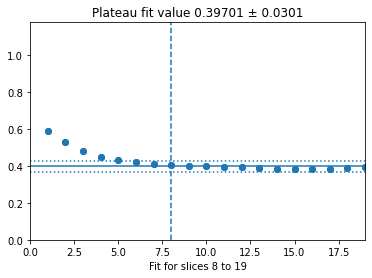

Adjusted to 8


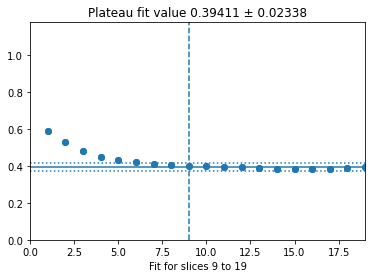

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


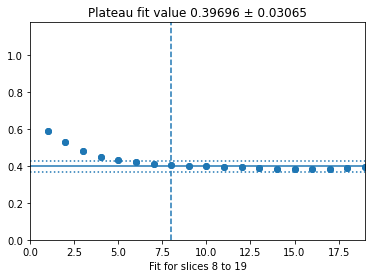

Adjusted to 8


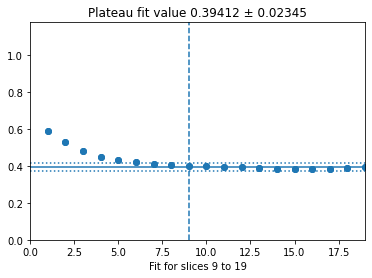

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


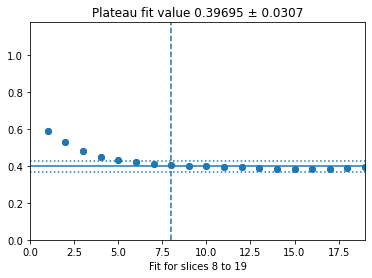

Adjusted to 8


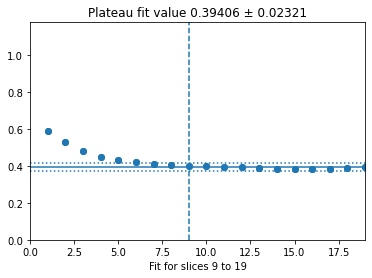

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


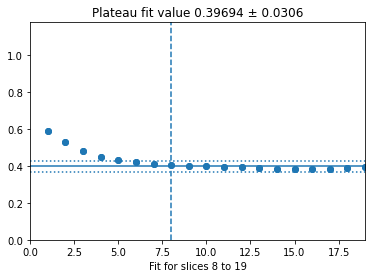

Adjusted to 8


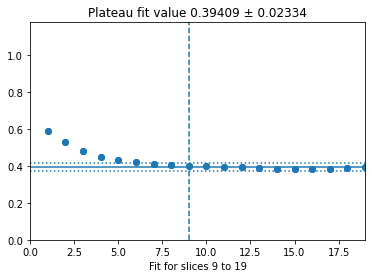

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


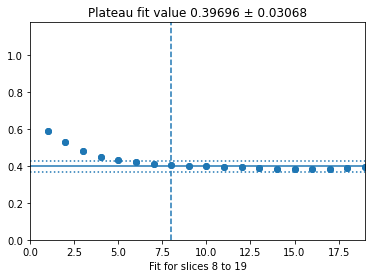

Adjusted to 8


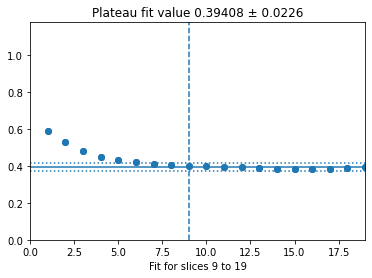

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


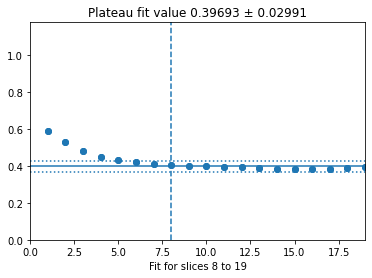

Adjusted to 8


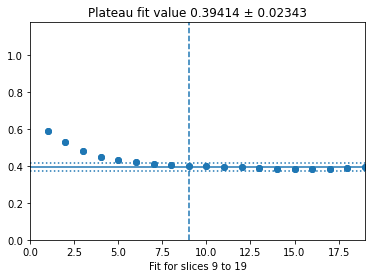

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


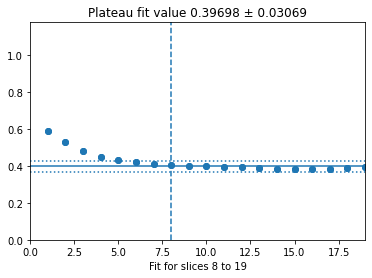

Adjusted to 8


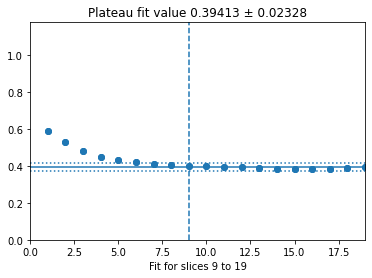

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


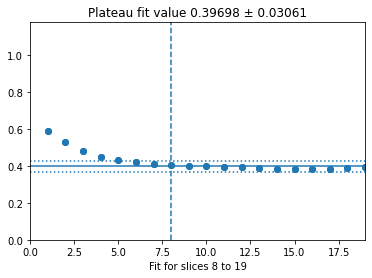

Adjusted to 8


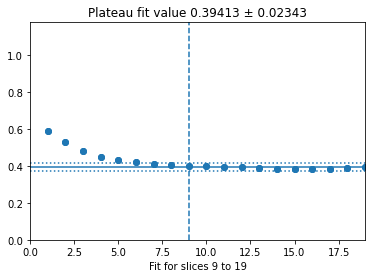

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


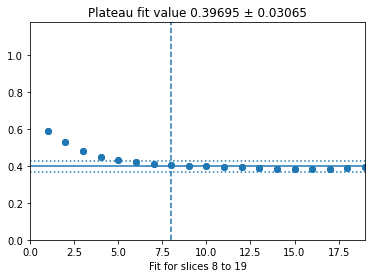

Adjusted to 8


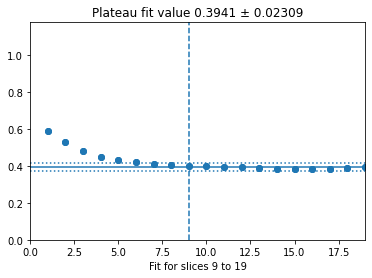

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


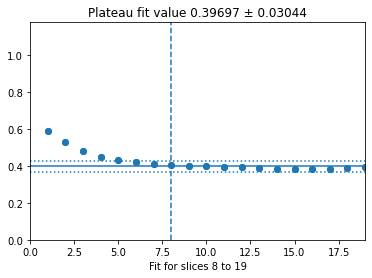

Adjusted to 8


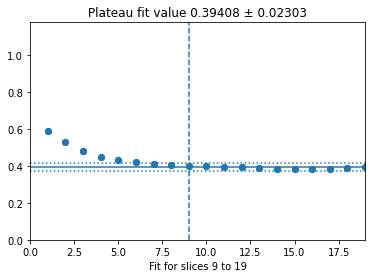

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


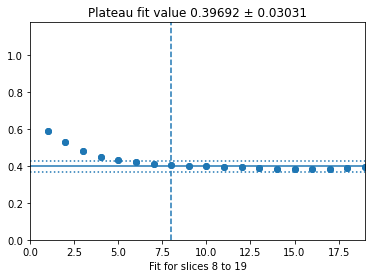

Adjusted to 8


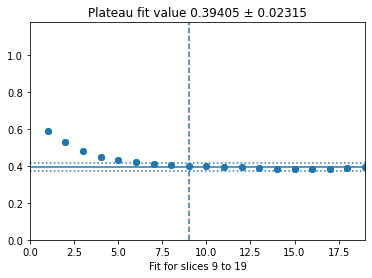

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


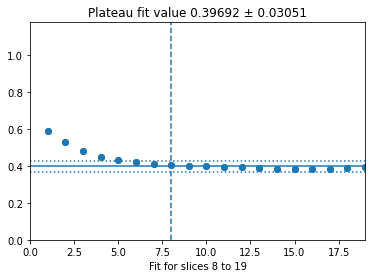

Adjusted to 8


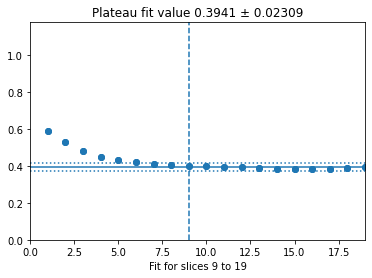

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


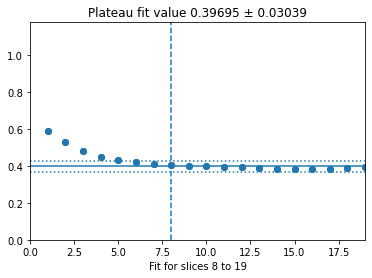

Adjusted to 8


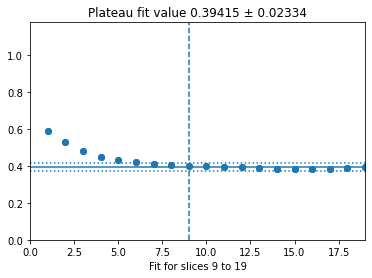

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


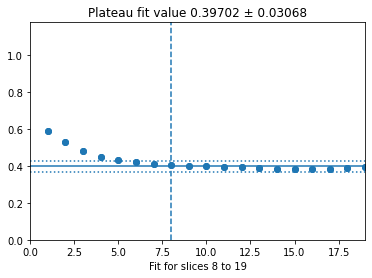

Adjusted to 8


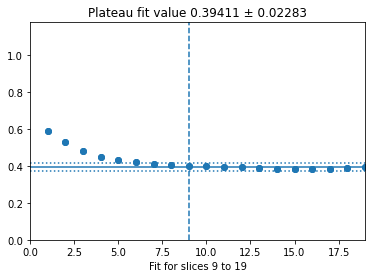

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


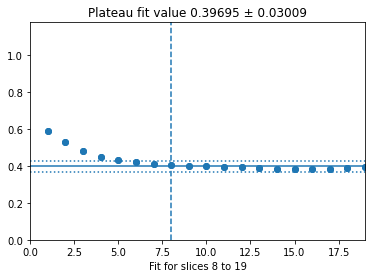

Adjusted to 8


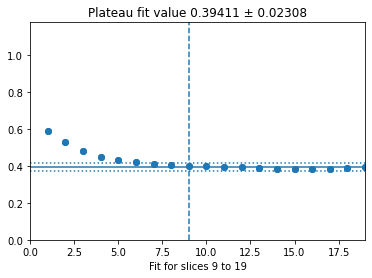

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


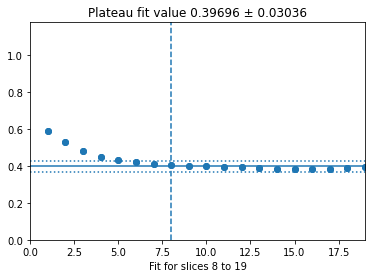

Adjusted to 8


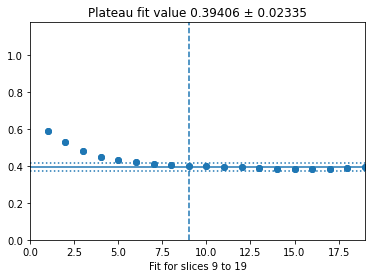

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


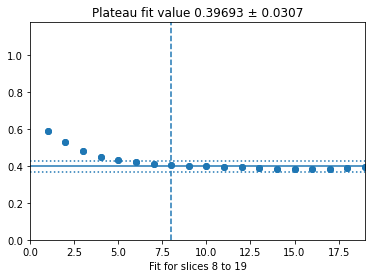

Adjusted to 8


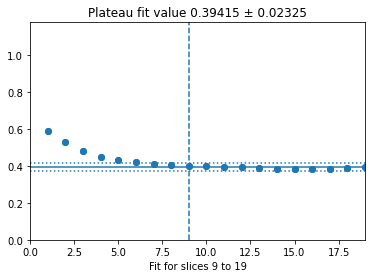

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


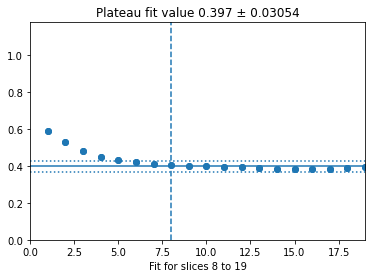

Adjusted to 8


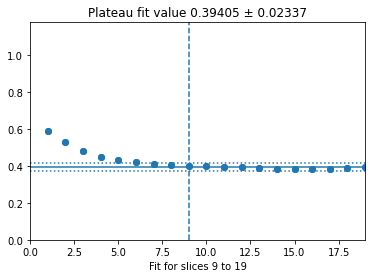

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


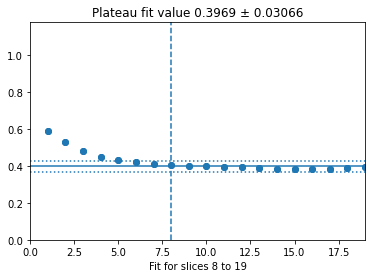

Adjusted to 8


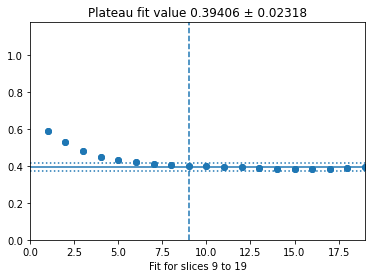

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


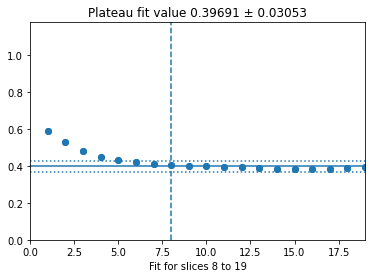

Adjusted to 8


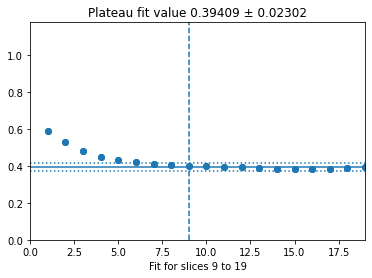

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


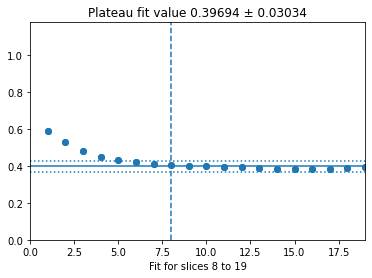

Adjusted to 8


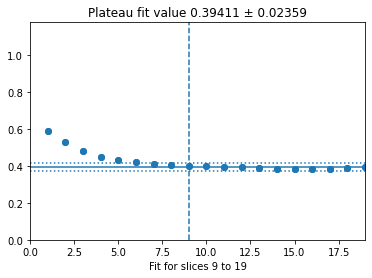

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


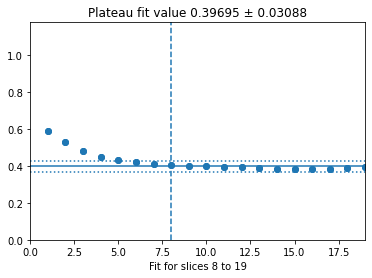

Adjusted to 8


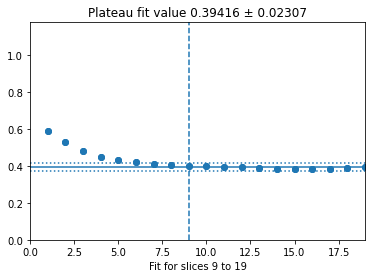

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


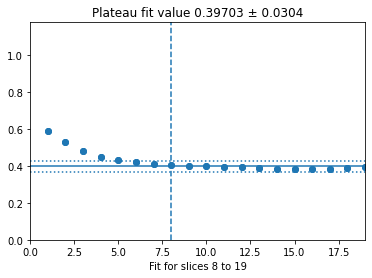

Adjusted to 8


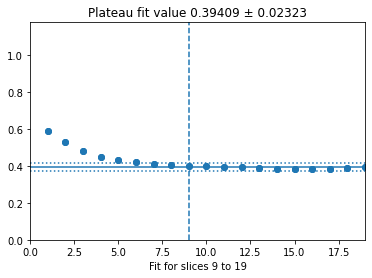

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


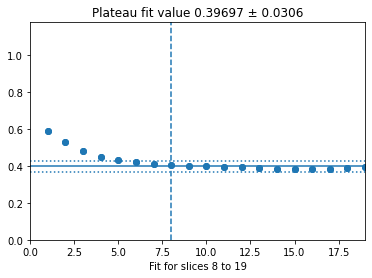

Adjusted to 8


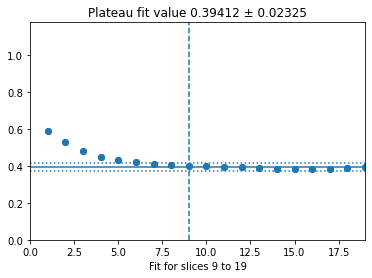

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


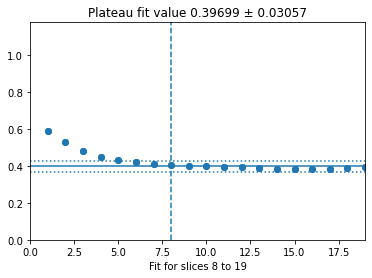

Adjusted to 8


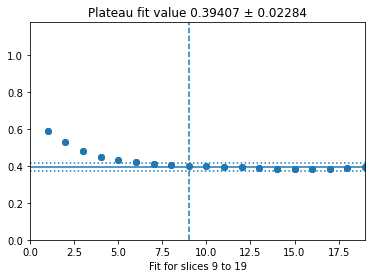

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


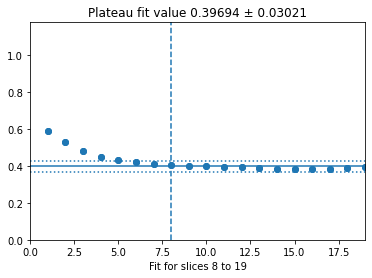

Adjusted to 8


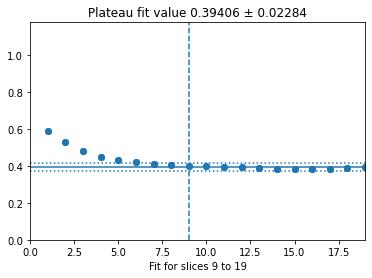

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


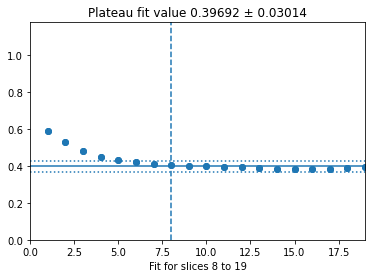

Adjusted to 8


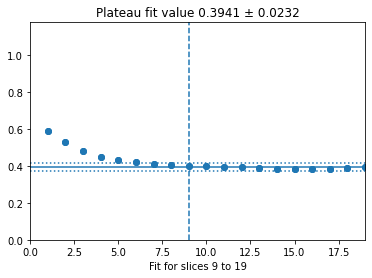

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


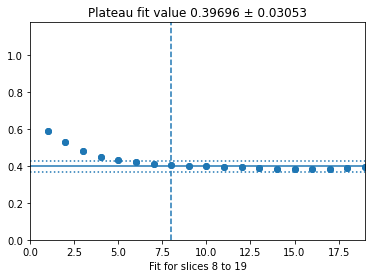

Adjusted to 8


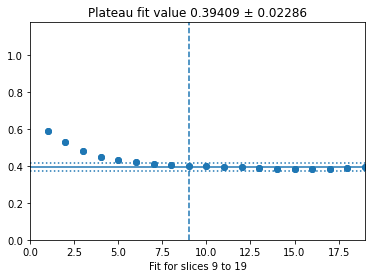

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


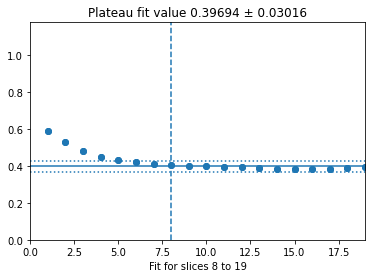

Adjusted to 8


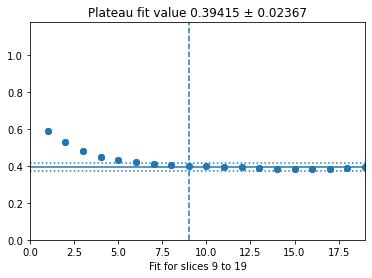

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


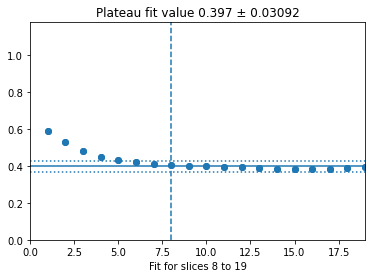

Adjusted to 8


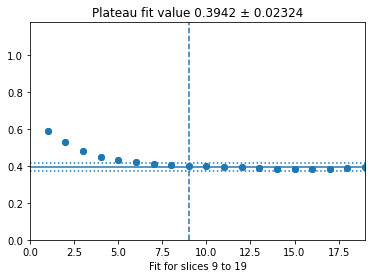

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


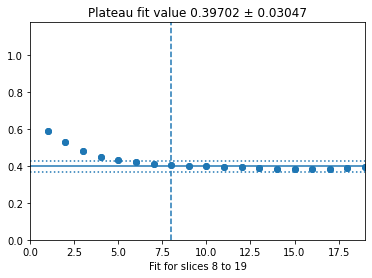

Adjusted to 8


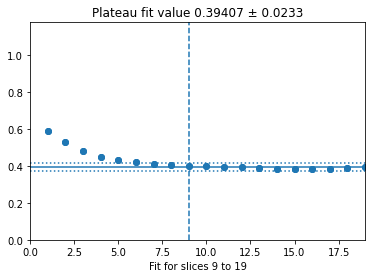

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


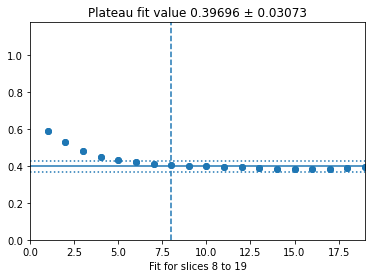

Adjusted to 8


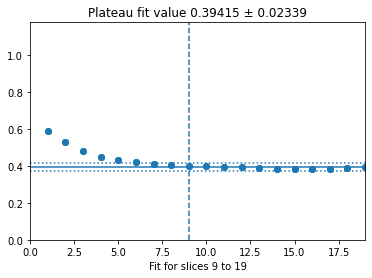

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


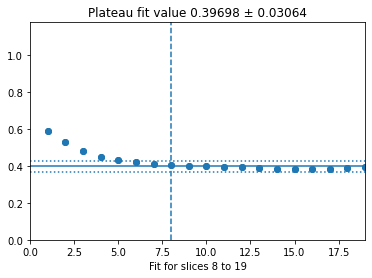

Adjusted to 8


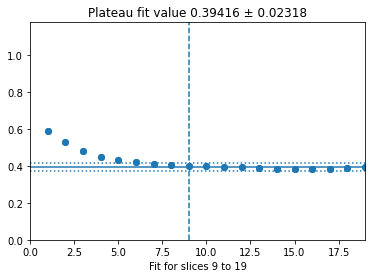

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


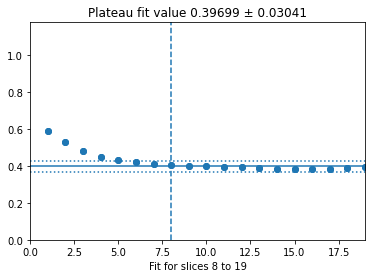

Adjusted to 8


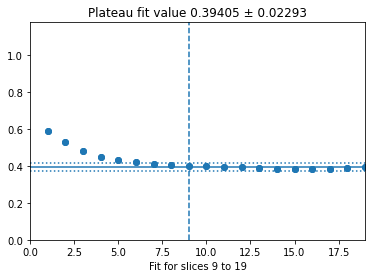

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


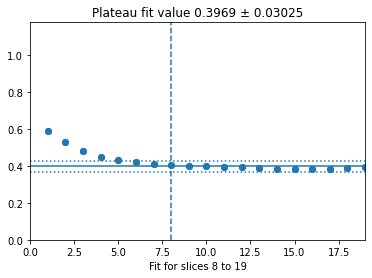

Adjusted to 8


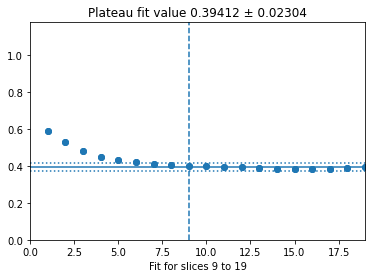

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


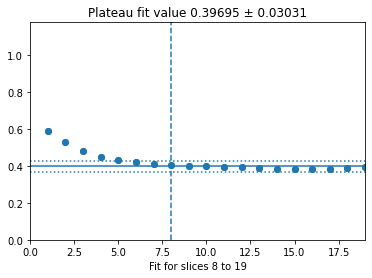

Adjusted to 8


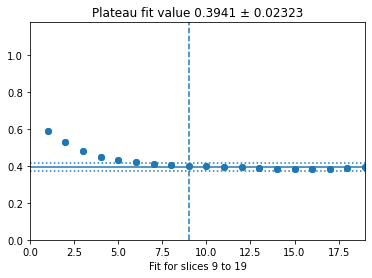

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


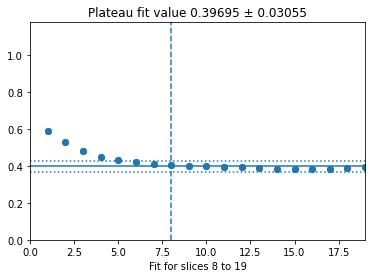

Adjusted to 8


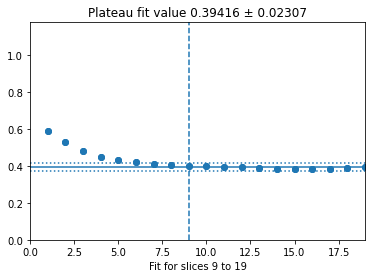

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


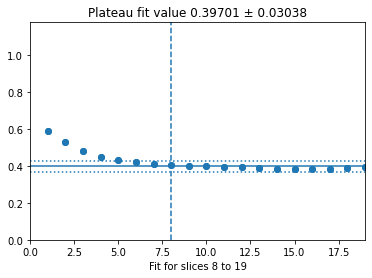

Adjusted to 8


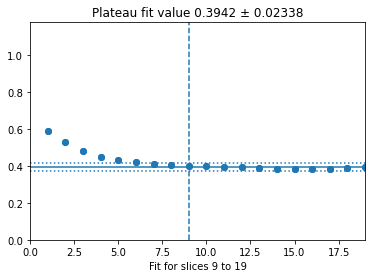

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


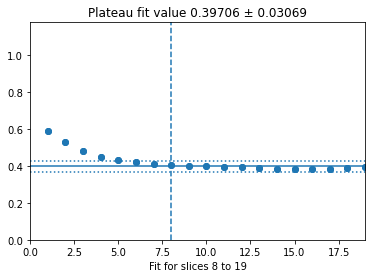

Adjusted to 8


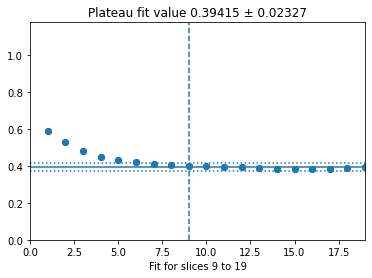

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


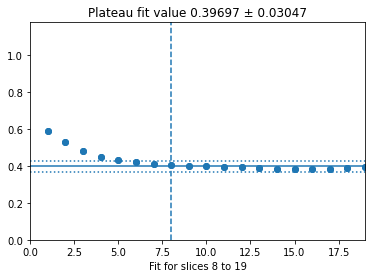

Adjusted to 8


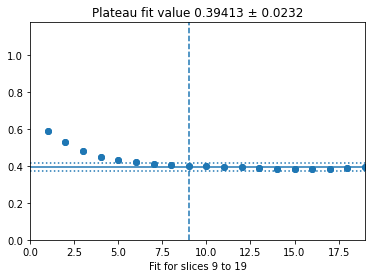

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


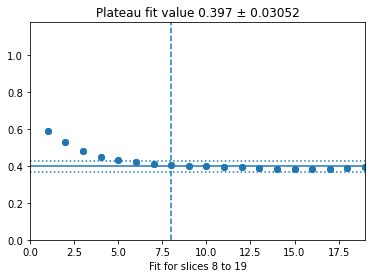

Adjusted to 8


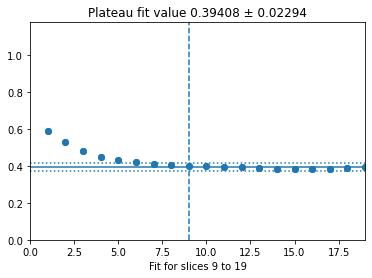

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


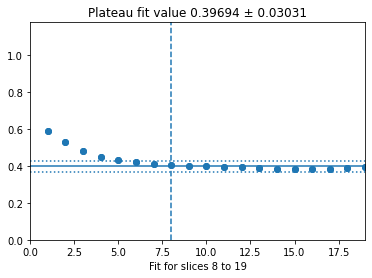

Adjusted to 8


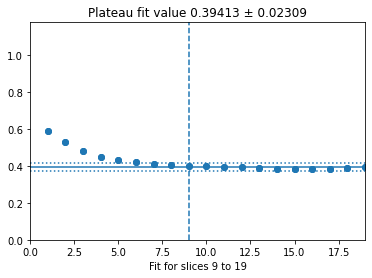

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


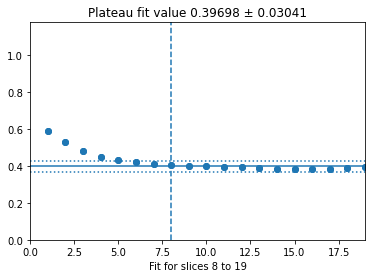

Adjusted to 8


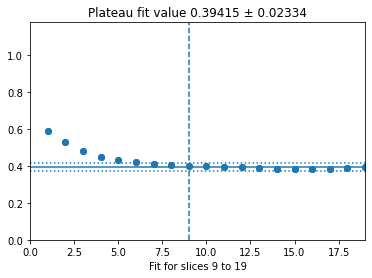

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


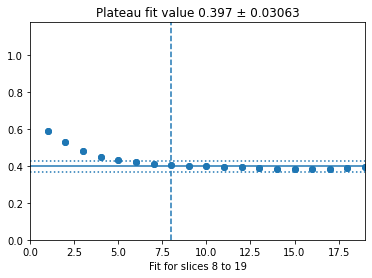

Adjusted to 8


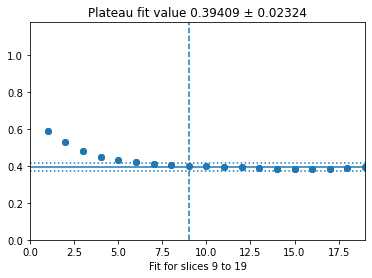

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


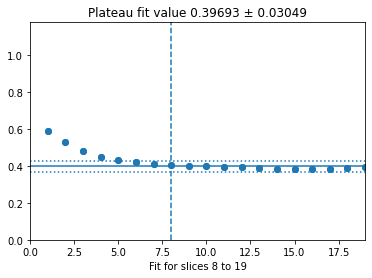

Adjusted to 8


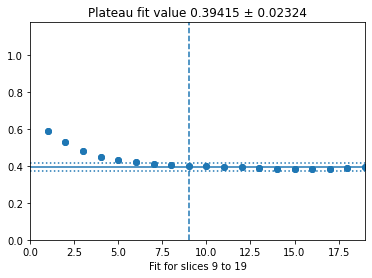

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


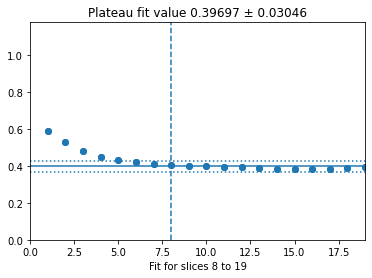

Adjusted to 8


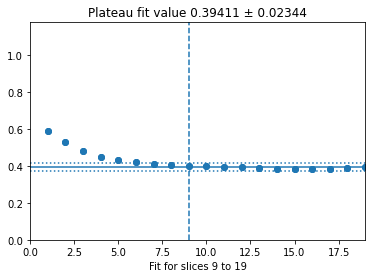

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


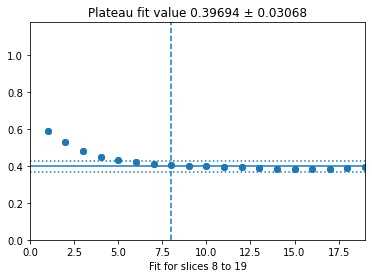

Adjusted to 8


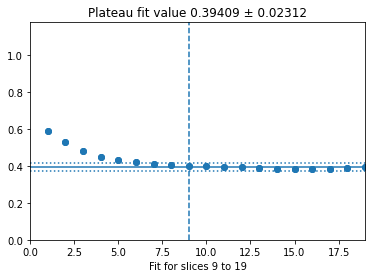

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


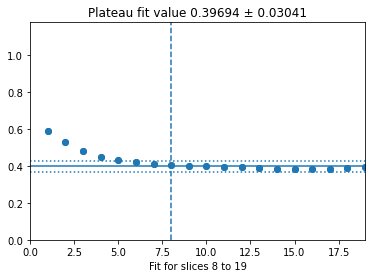

Adjusted to 8


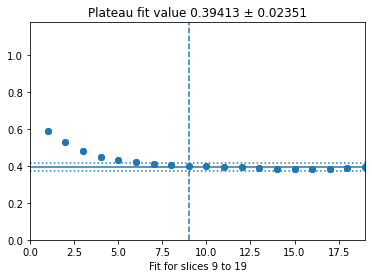

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


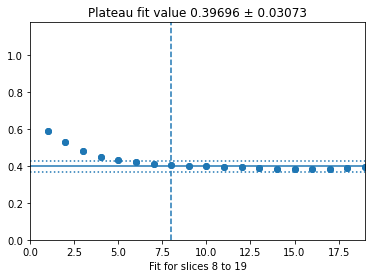

Adjusted to 8


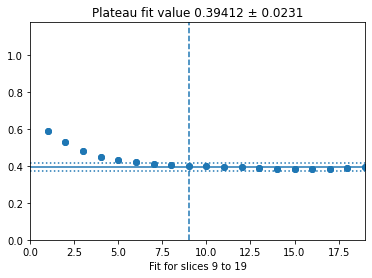

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


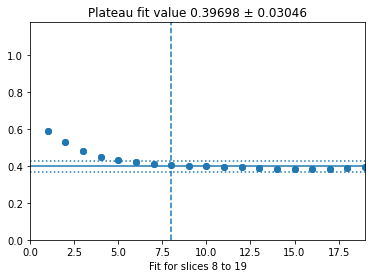

Adjusted to 8


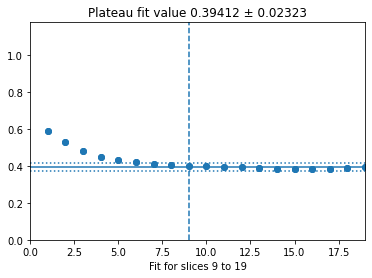

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


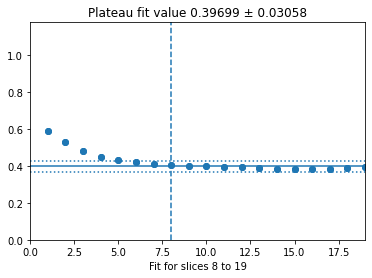

Adjusted to 8


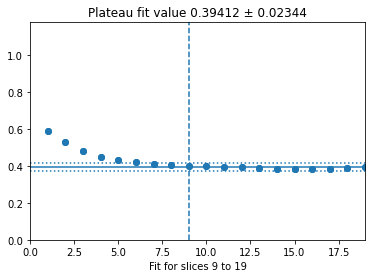

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


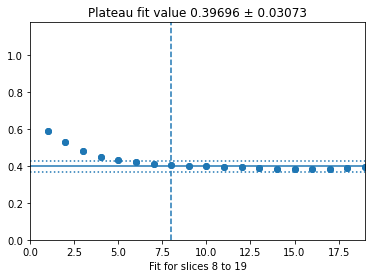

Adjusted to 8


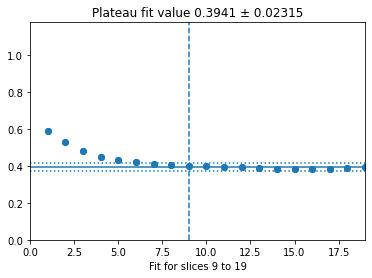

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


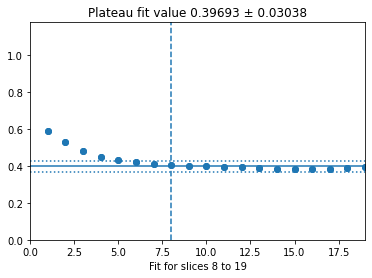

Adjusted to 8


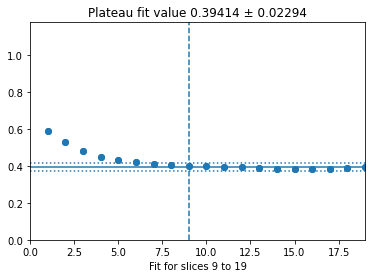

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


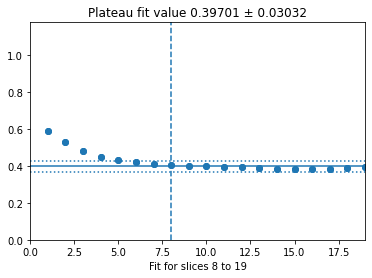

Adjusted to 8


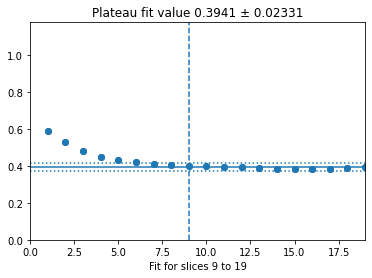

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


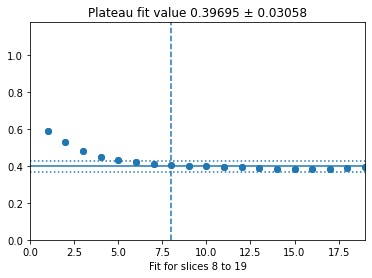

Adjusted to 8


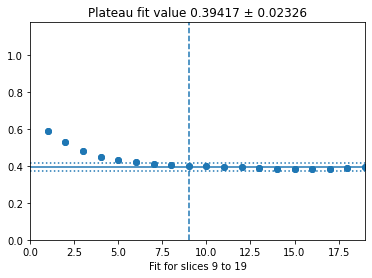

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


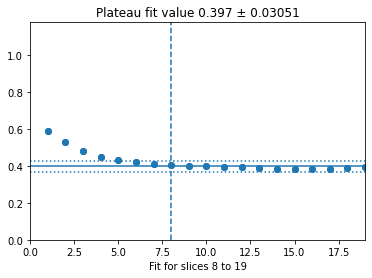

Adjusted to 8


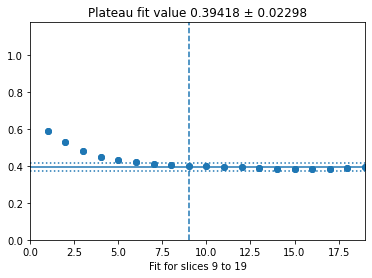

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


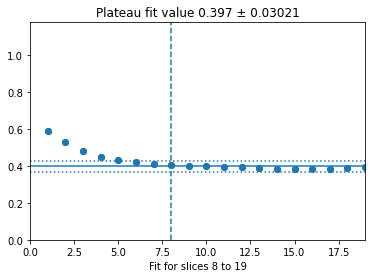

Adjusted to 8


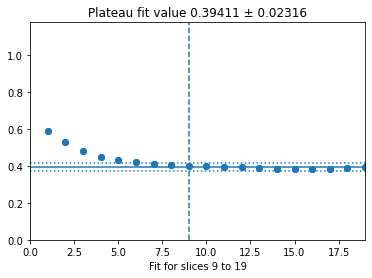

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


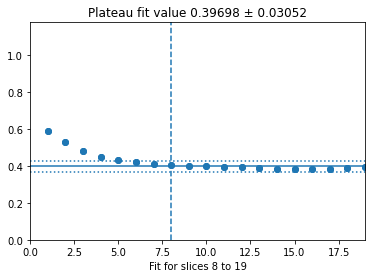

Adjusted to 8


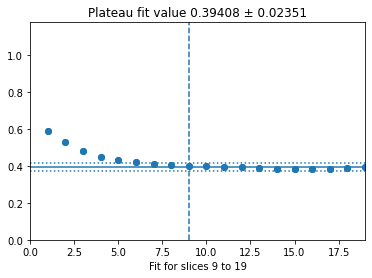

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


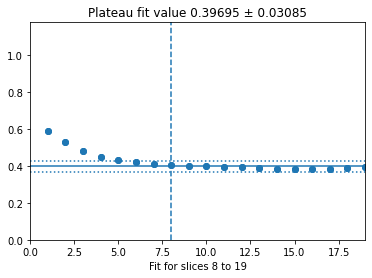

Adjusted to 8


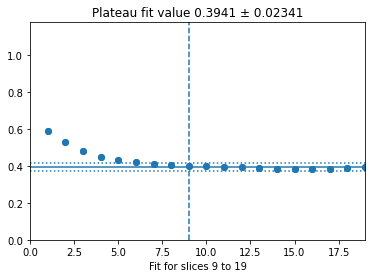

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


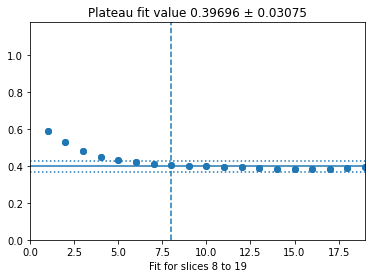

Adjusted to 8


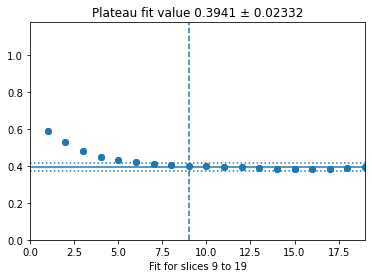

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


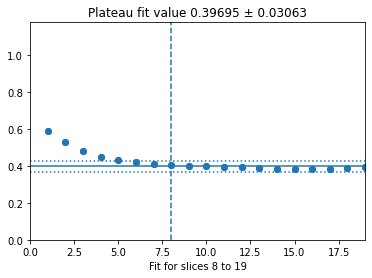

Adjusted to 8


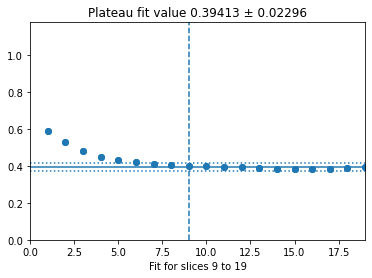

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


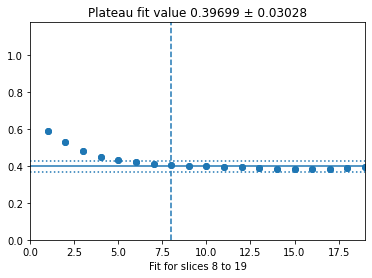

Adjusted to 8


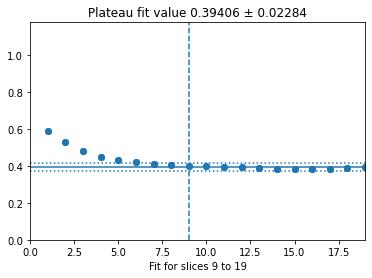

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


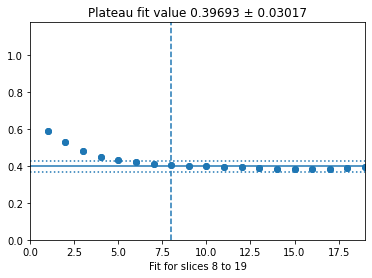

Adjusted to 8


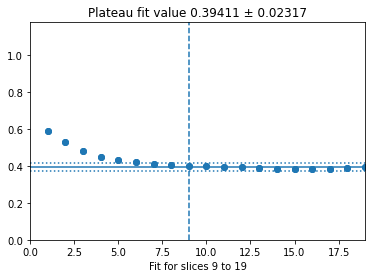

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


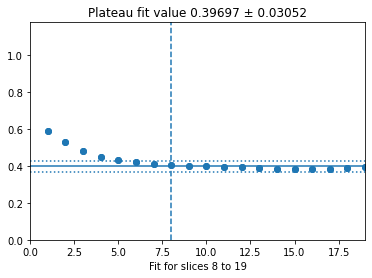

Adjusted to 8


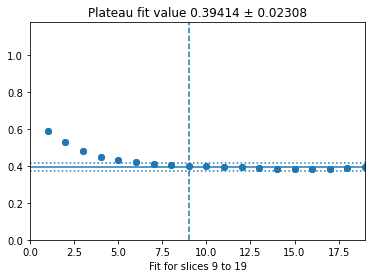

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


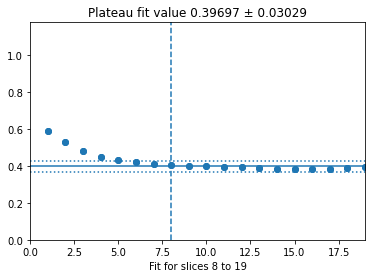

Adjusted to 8


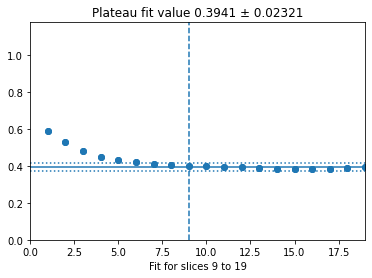

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


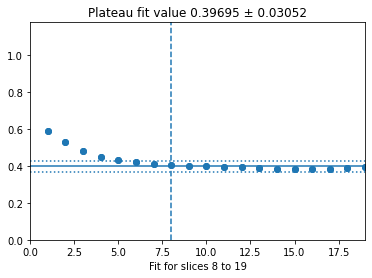

Adjusted to 8


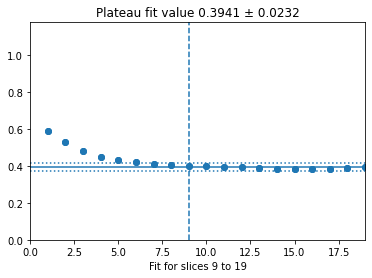

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


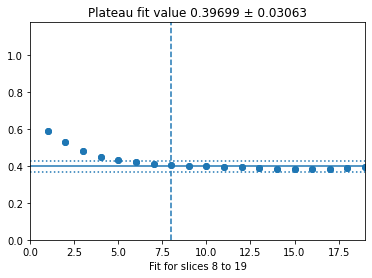

Adjusted to 8


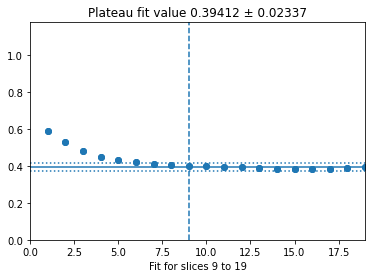

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


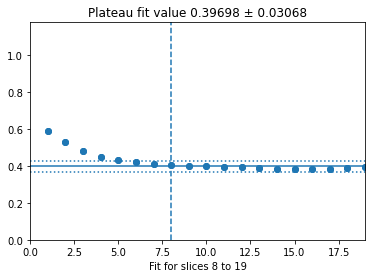

Adjusted to 8


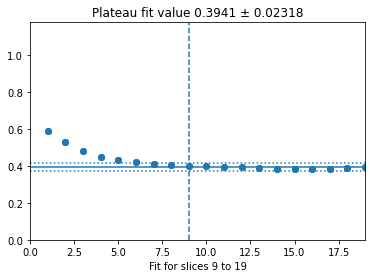

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


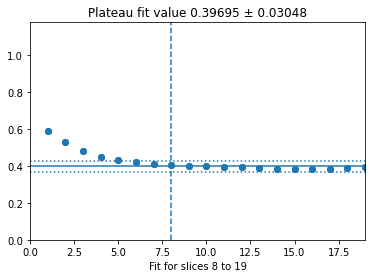

Adjusted to 8


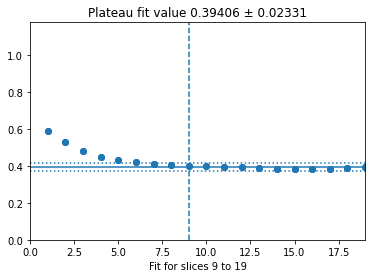

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


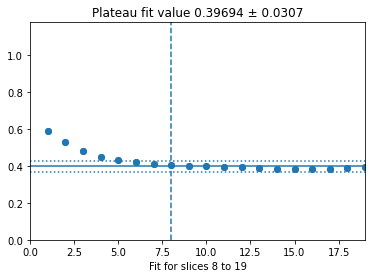

Adjusted to 8


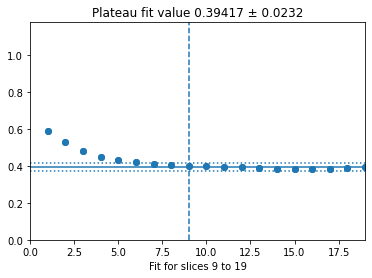

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


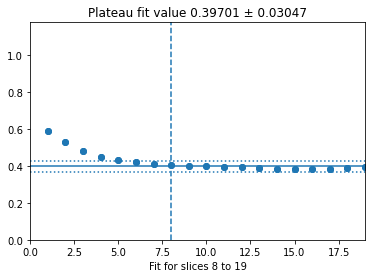

Adjusted to 8


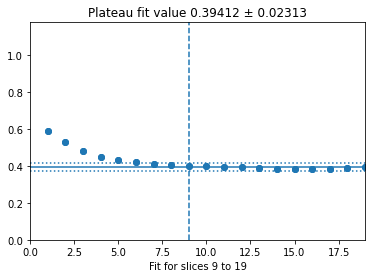

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


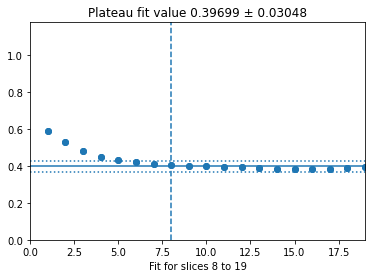

Adjusted to 8


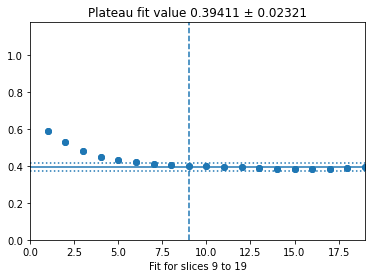

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


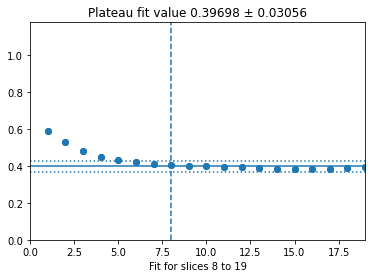

Adjusted to 8


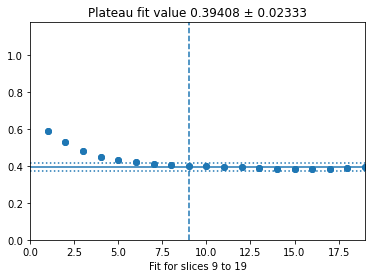

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


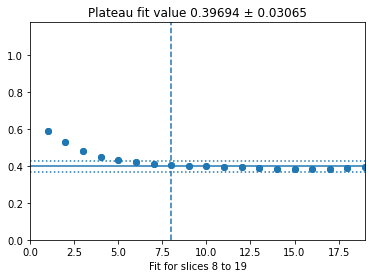

Adjusted to 8


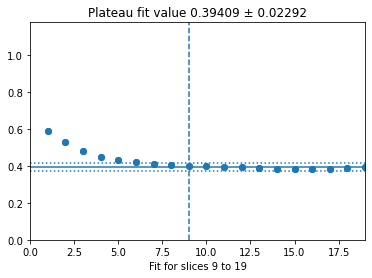

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


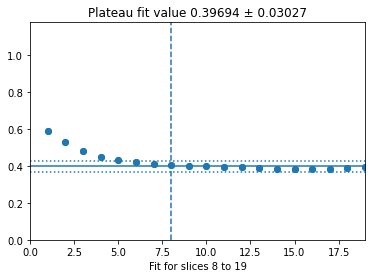

Adjusted to 8


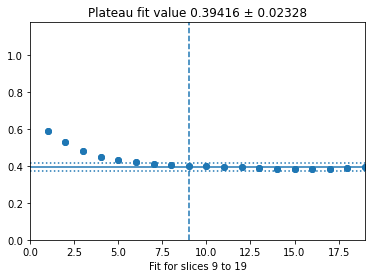

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


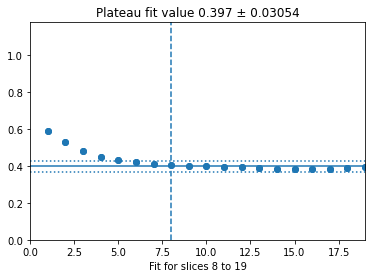

Adjusted to 8


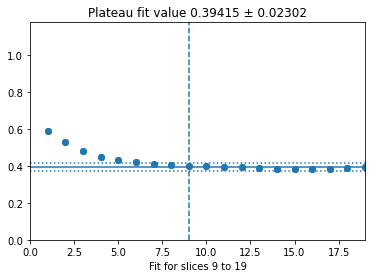

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


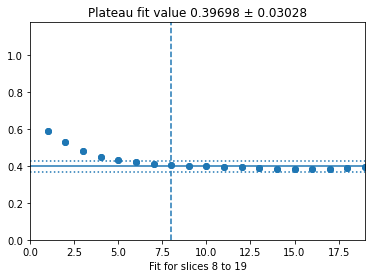

Adjusted to 8


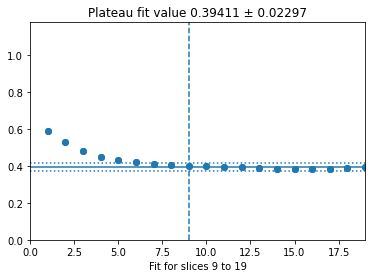

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


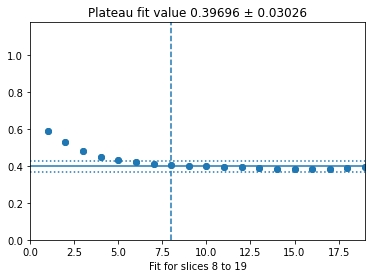

Adjusted to 8


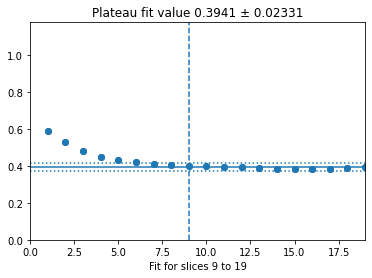

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


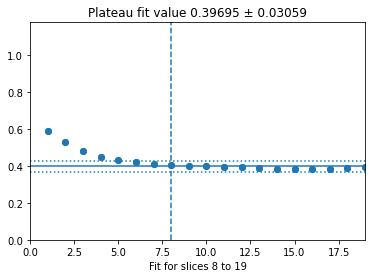

Adjusted to 8


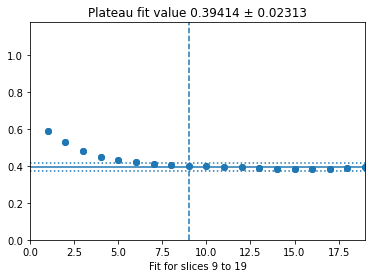

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


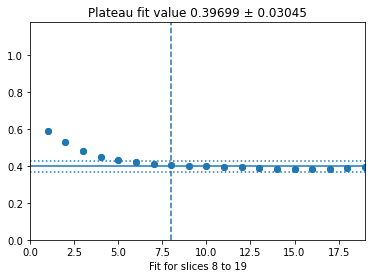

Adjusted to 8


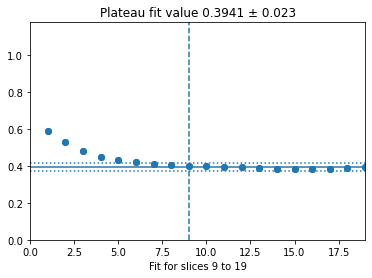

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


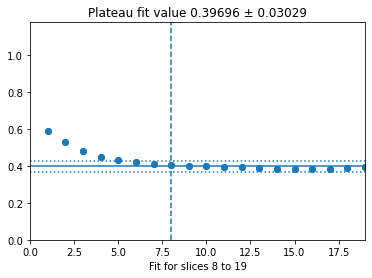

Adjusted to 8


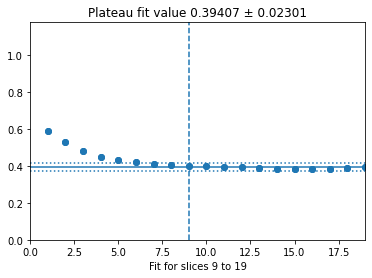

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


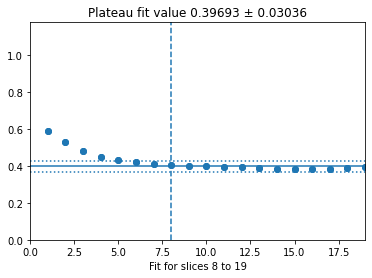

Adjusted to 8


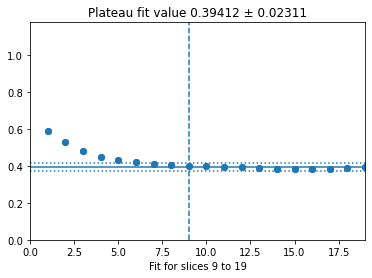

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


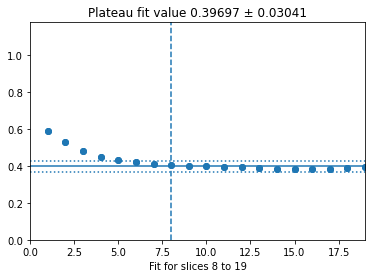

Adjusted to 8


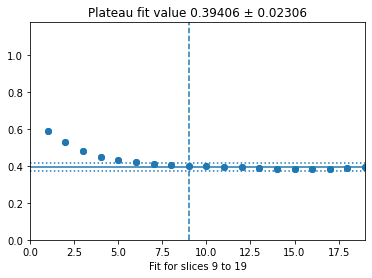

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


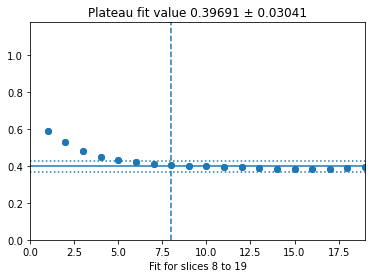

Adjusted to 8


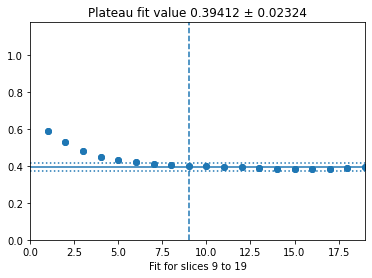

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


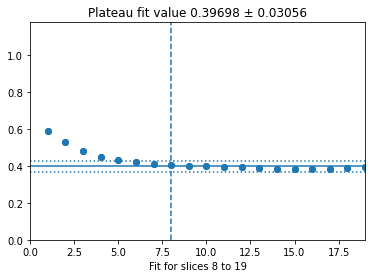

Adjusted to 8


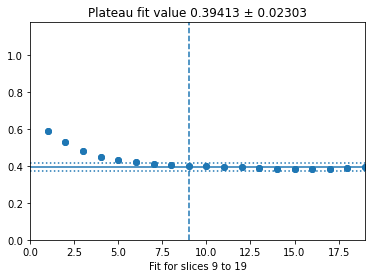

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


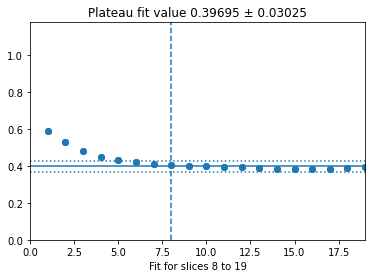

Adjusted to 8


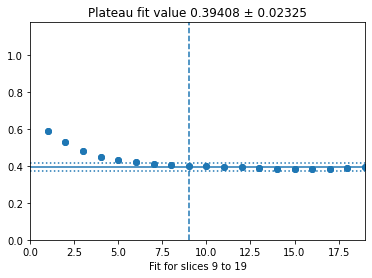

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


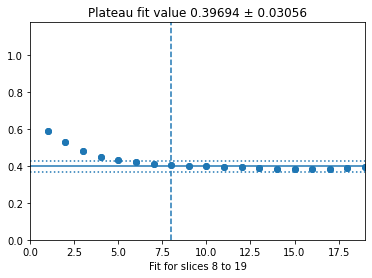

Adjusted to 8


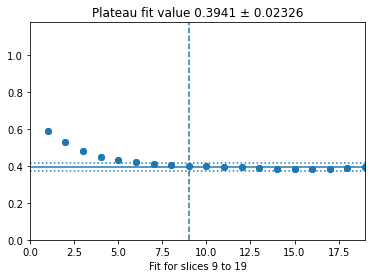

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


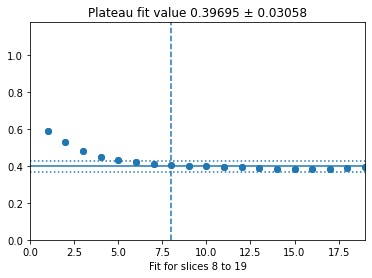

Adjusted to 8


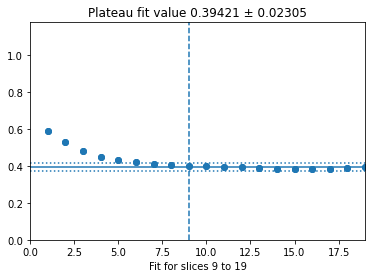

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


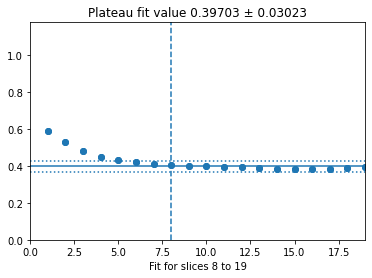

Adjusted to 8


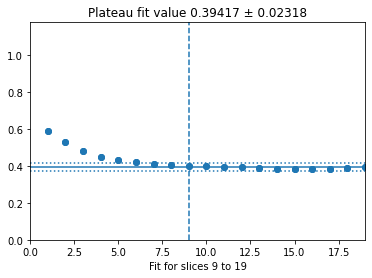

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


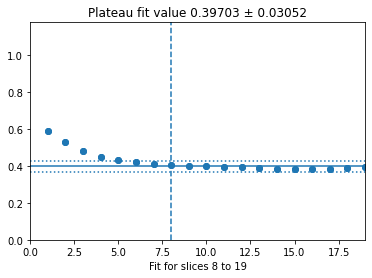

Adjusted to 8


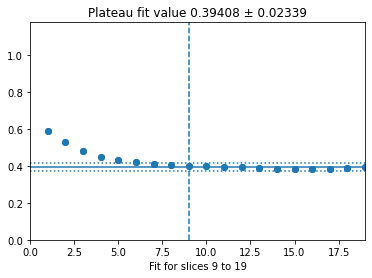

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


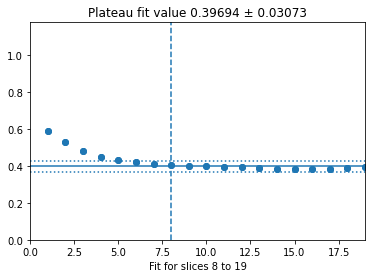

Adjusted to 8


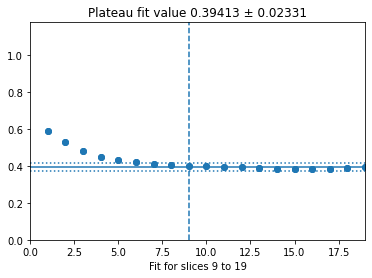

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


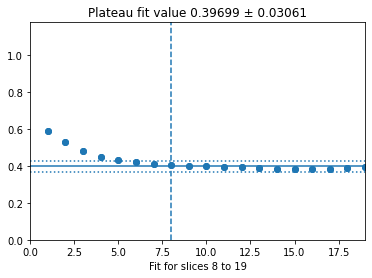

Adjusted to 8


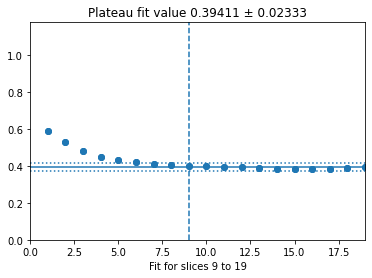

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


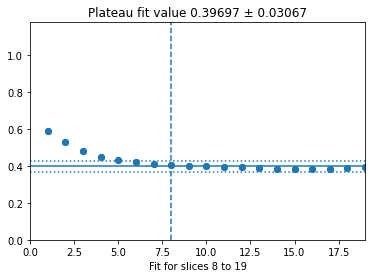

Adjusted to 8


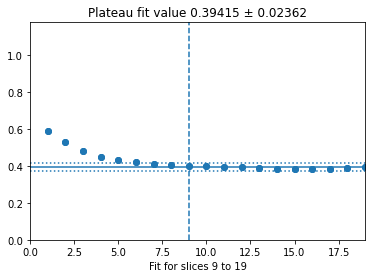

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


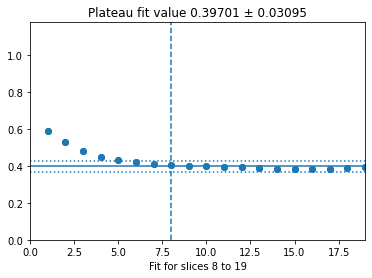

Adjusted to 8


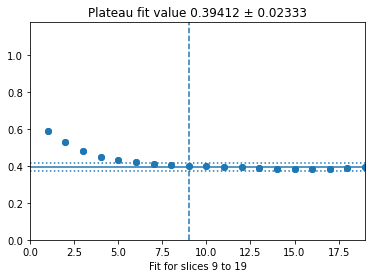

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


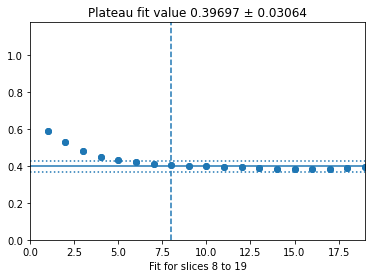

Adjusted to 8


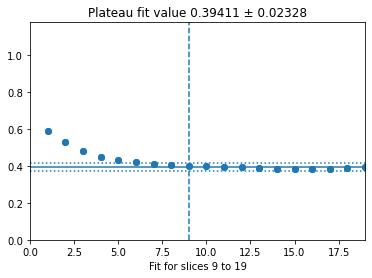

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


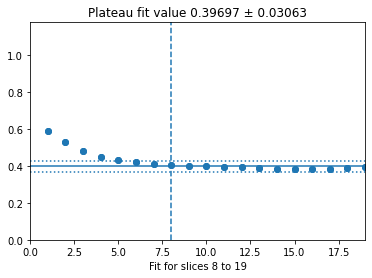

Adjusted to 8


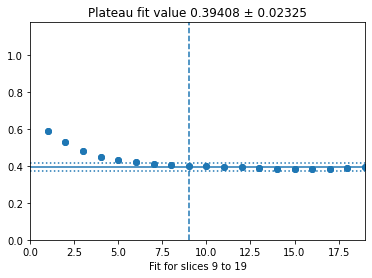

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


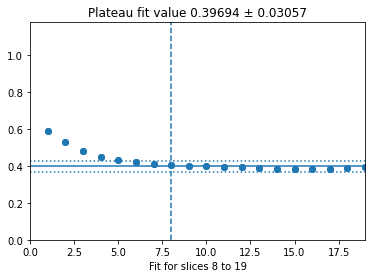

Adjusted to 8


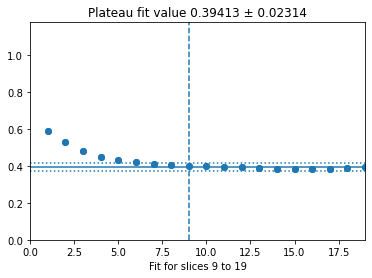

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


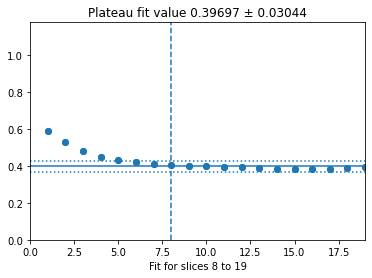

Adjusted to 8


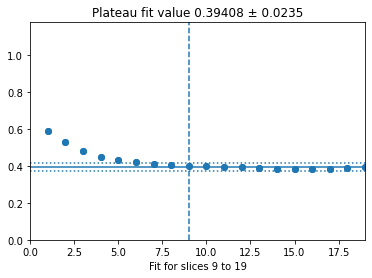

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


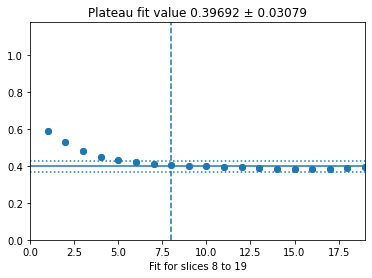

Adjusted to 8


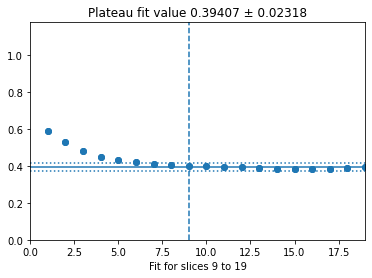

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


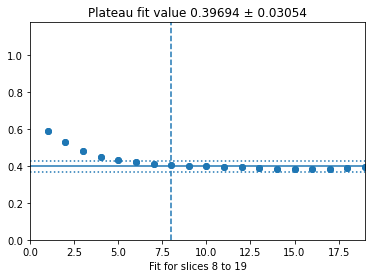

Adjusted to 8


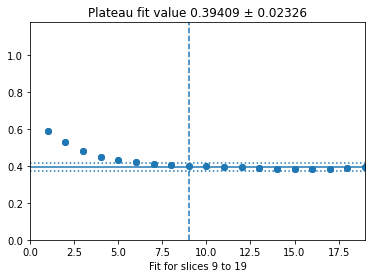

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


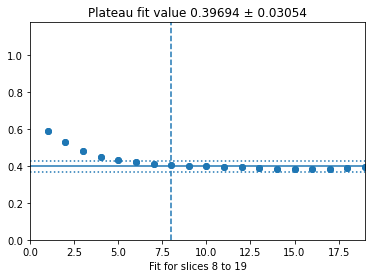

Adjusted to 8


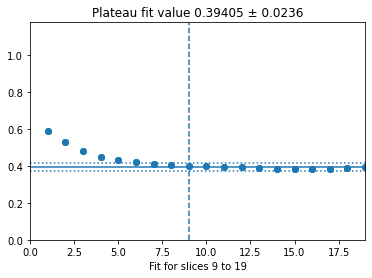

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


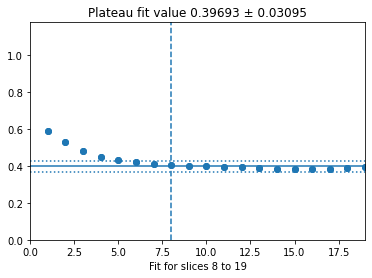

Adjusted to 8


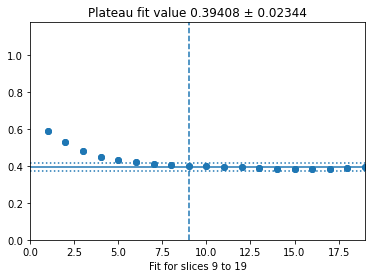

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


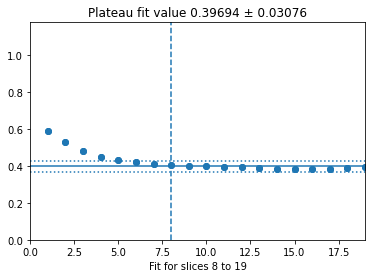

Adjusted to 8


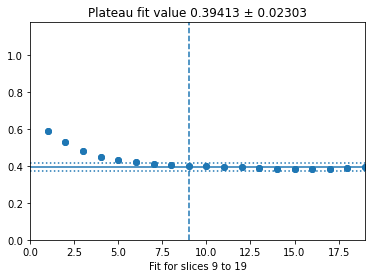

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


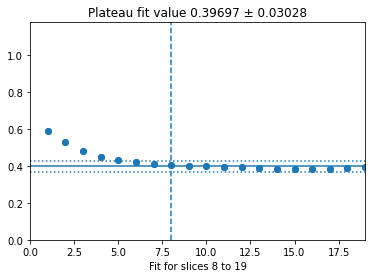

Adjusted to 8


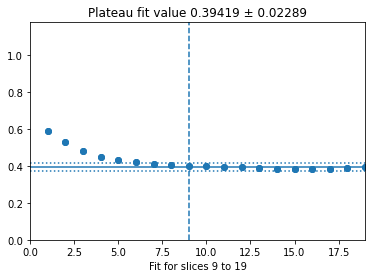

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


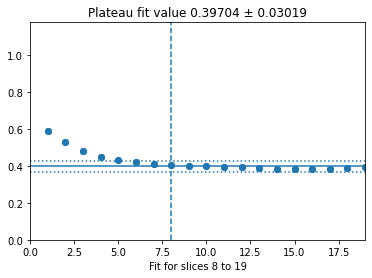

Adjusted to 8


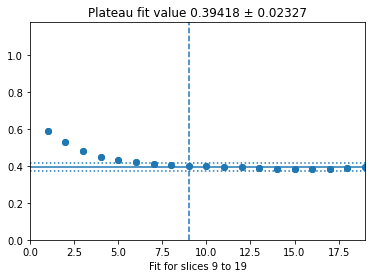

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


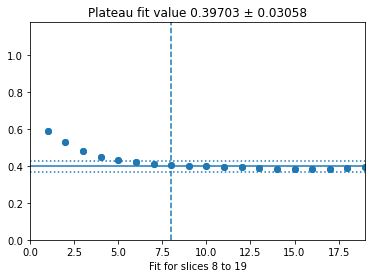

Adjusted to 8


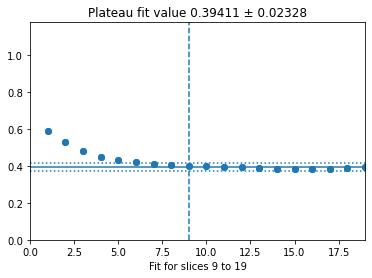

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


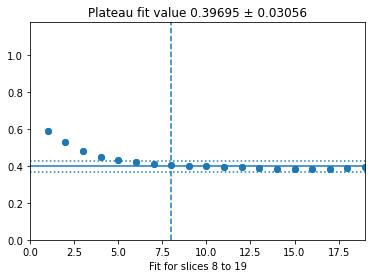

Adjusted to 8


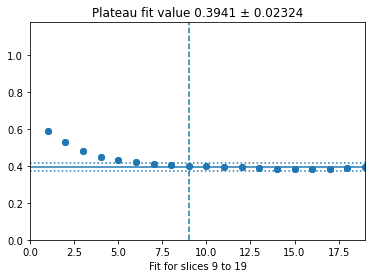

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


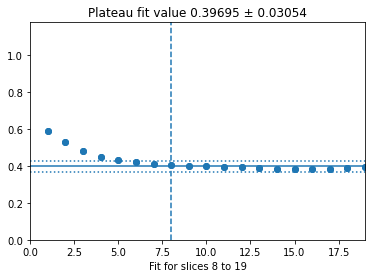

Adjusted to 8


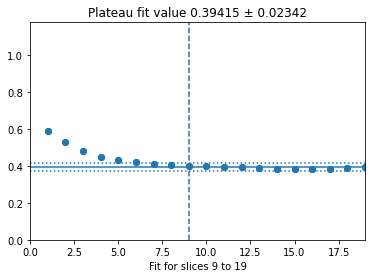

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


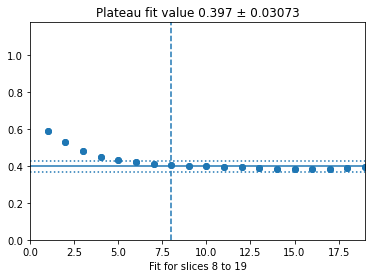

Adjusted to 8


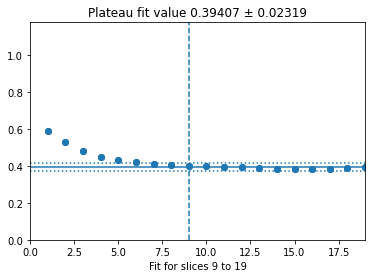

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


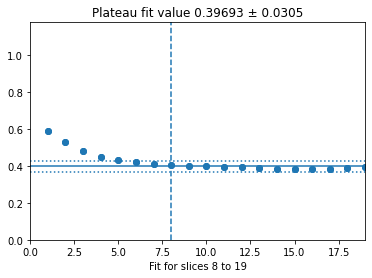

Adjusted to 8


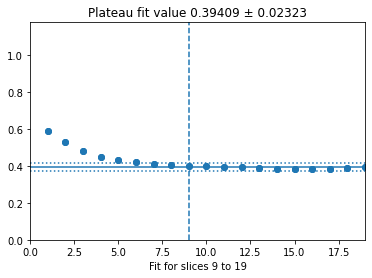

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


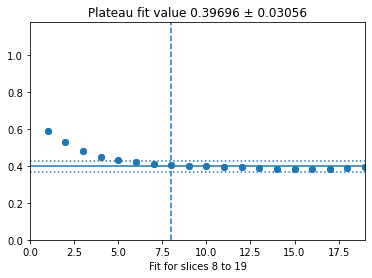

Adjusted to 8


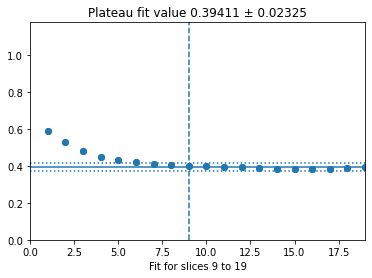

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


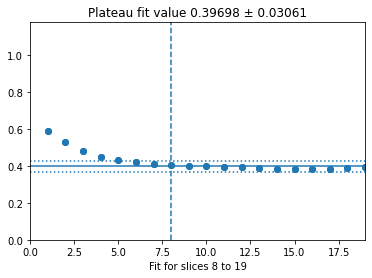

Adjusted to 8


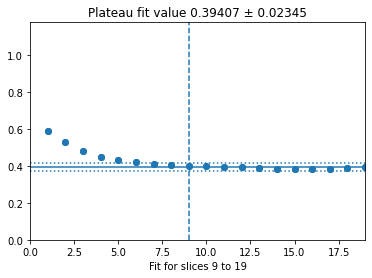

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


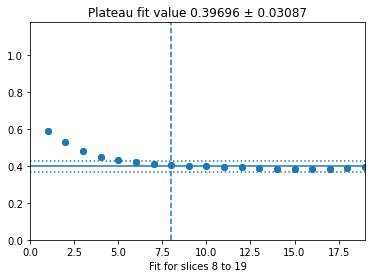

Adjusted to 8


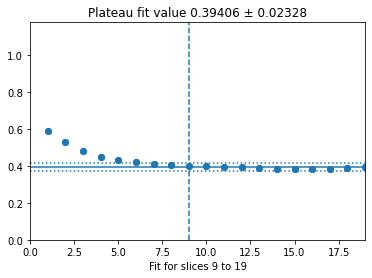

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


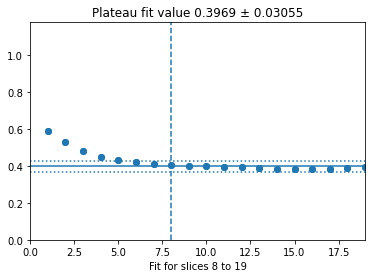

Adjusted to 8


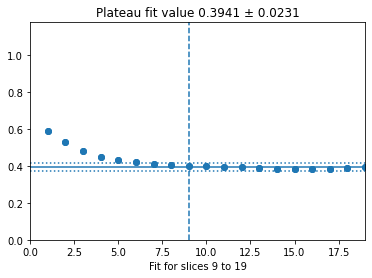

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


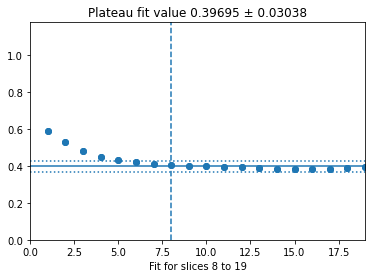

Adjusted to 8


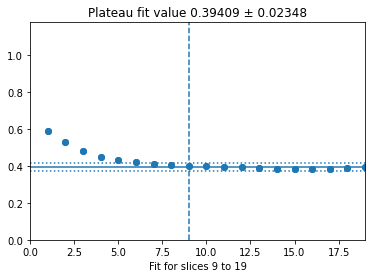

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


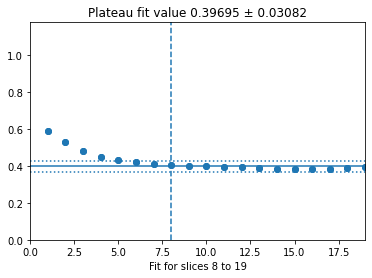

Adjusted to 8


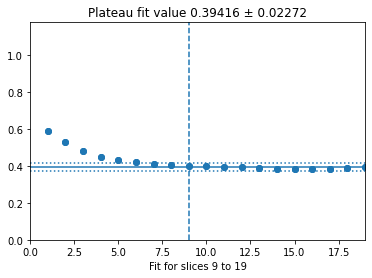

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


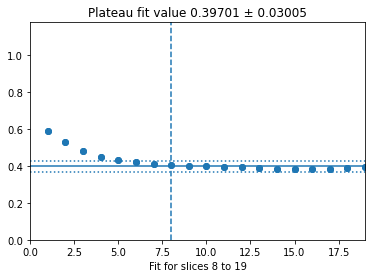

Adjusted to 8


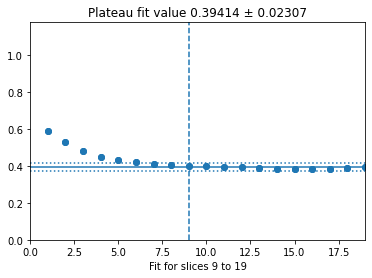

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


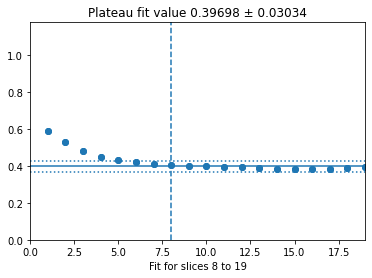

Adjusted to 8


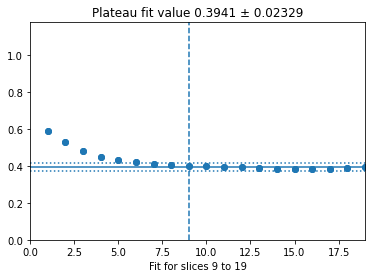

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


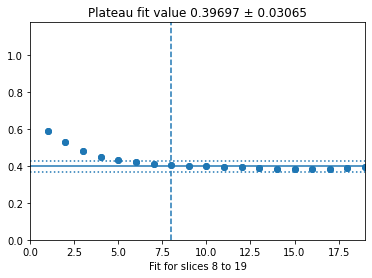

Adjusted to 8


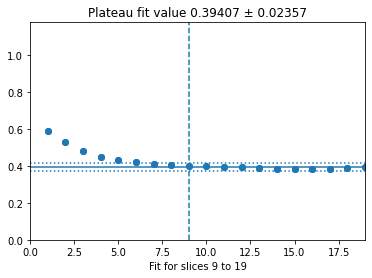

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


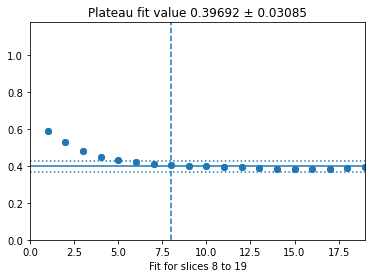

Adjusted to 8


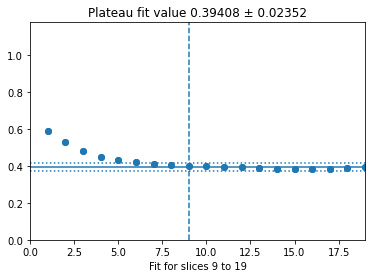

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


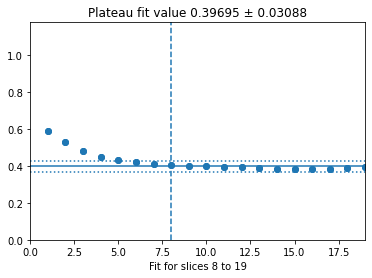

Adjusted to 8


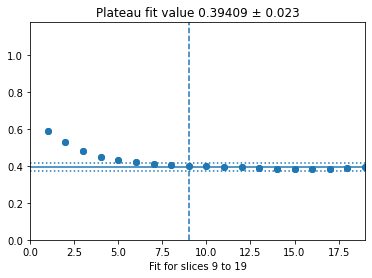

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


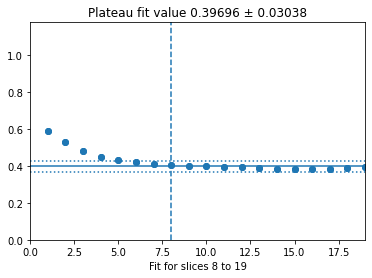

Adjusted to 8


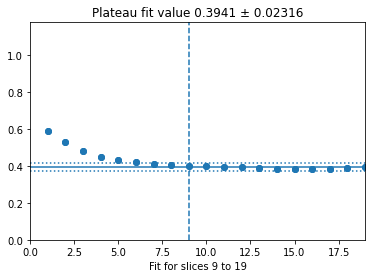

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


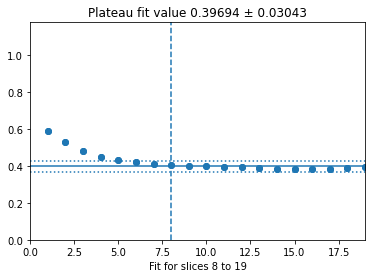

Adjusted to 8


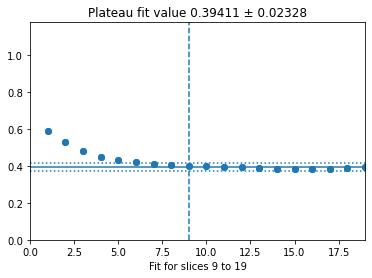

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


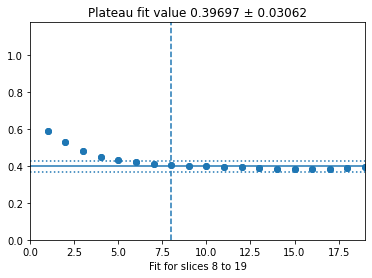

Adjusted to 8


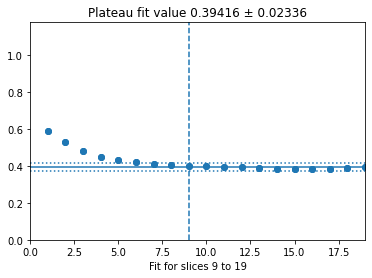

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


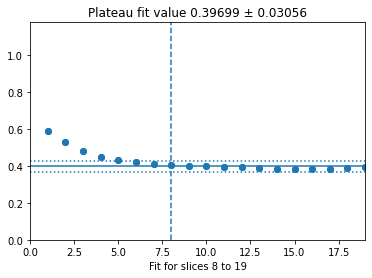

Adjusted to 8


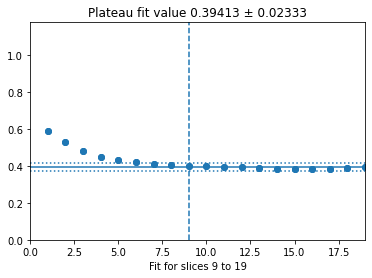

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


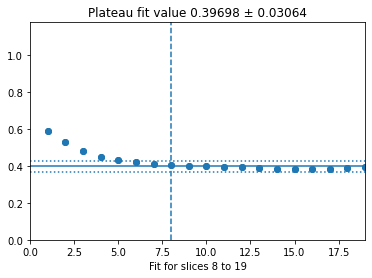

Adjusted to 8


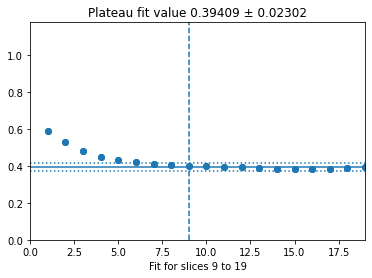

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


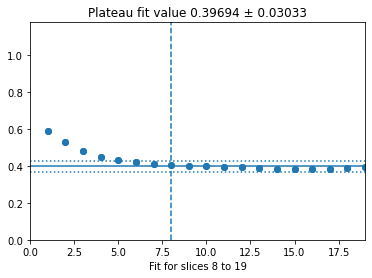

Adjusted to 8


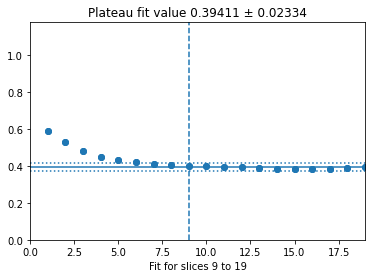

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


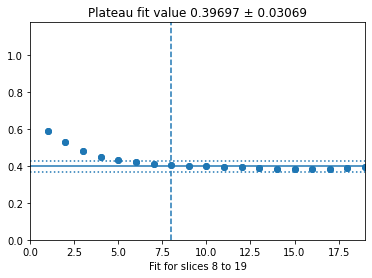

Adjusted to 8


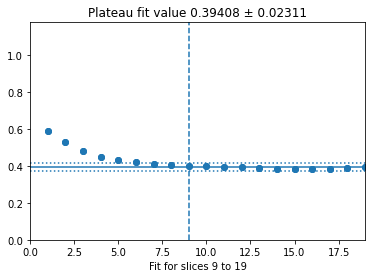

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


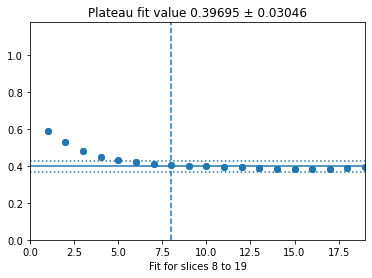

Adjusted to 8


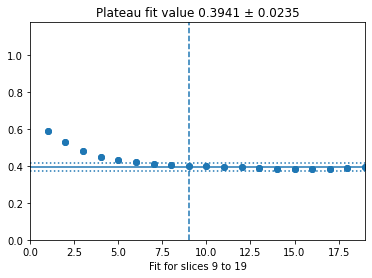

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


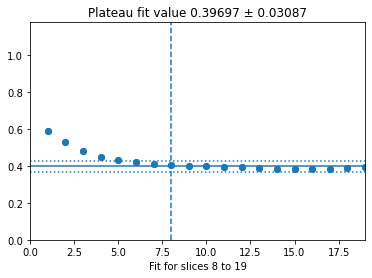

Adjusted to 8


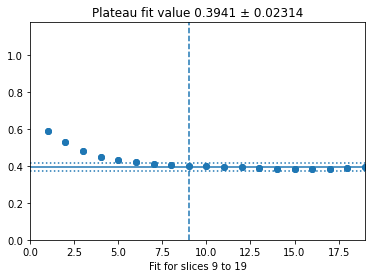

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


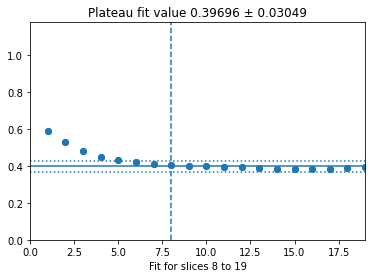

Adjusted to 8


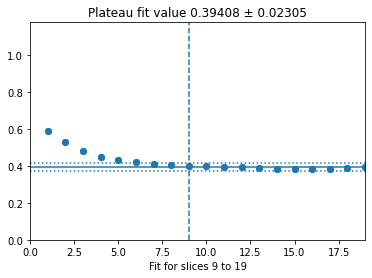

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


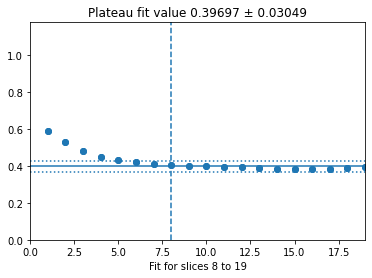

Adjusted to 8


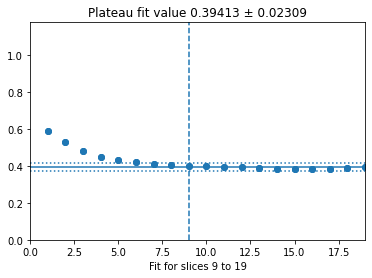

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


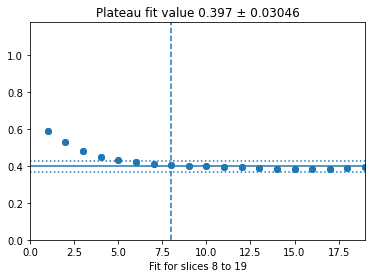

Adjusted to 8


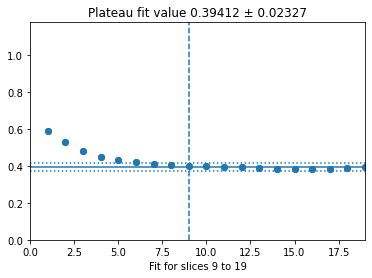

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


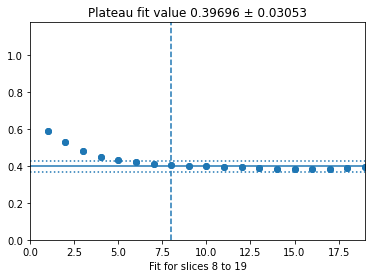

Adjusted to 8


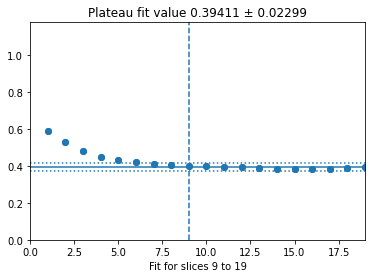

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


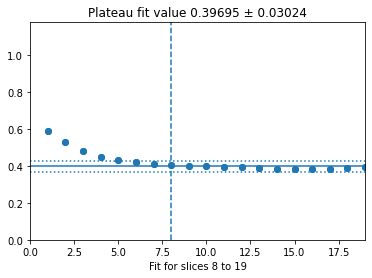

Adjusted to 8


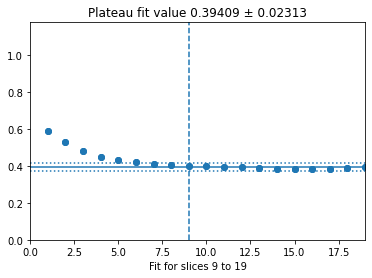

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


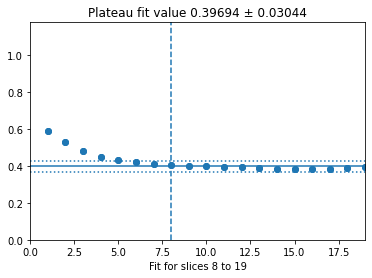

Adjusted to 8


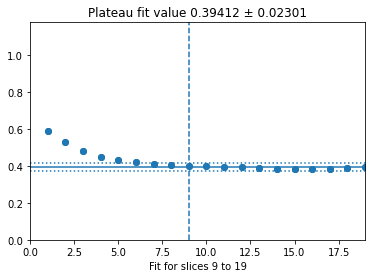

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


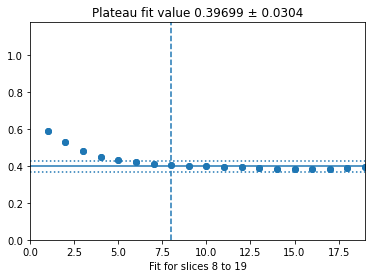

Adjusted to 8


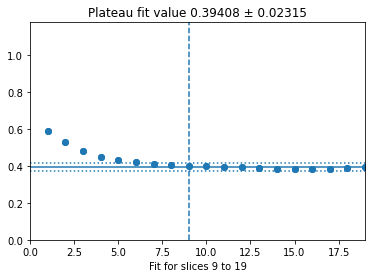

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


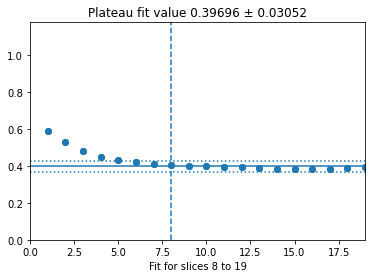

Adjusted to 8


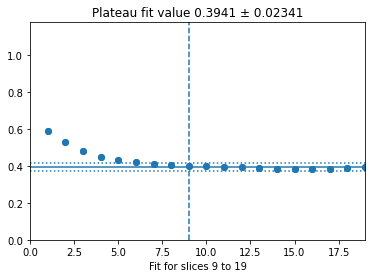

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


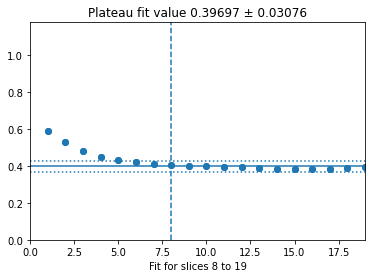

Adjusted to 8


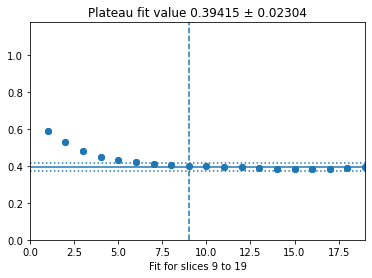

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


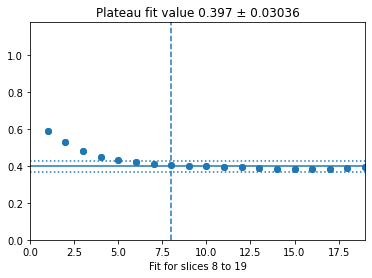

Adjusted to 8


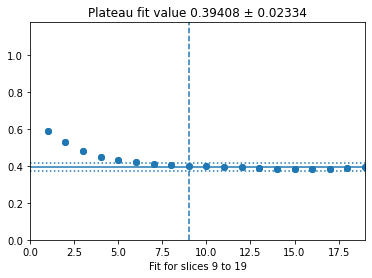

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


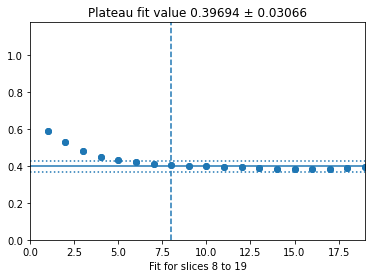

Adjusted to 8


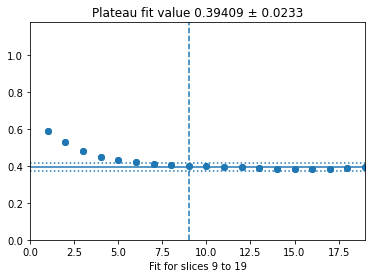

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


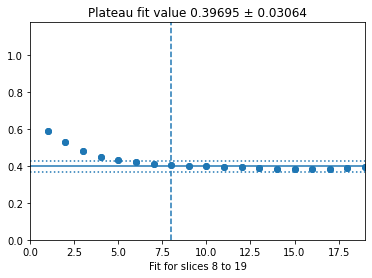

Adjusted to 8


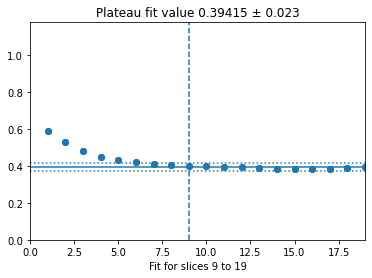

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


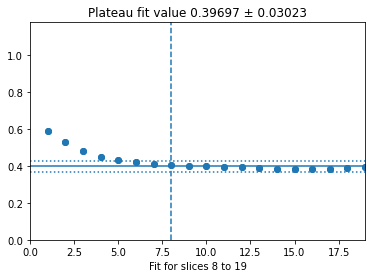

Adjusted to 8


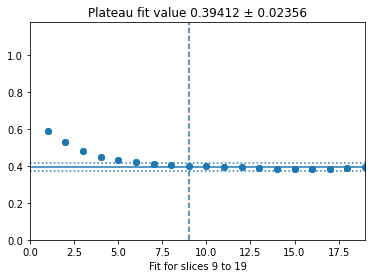

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


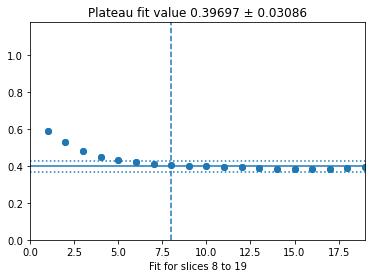

Adjusted to 8


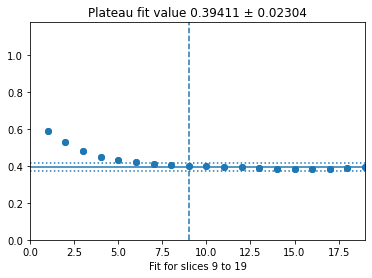

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


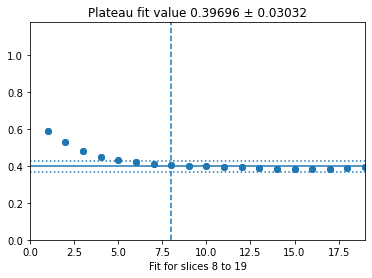

Adjusted to 8


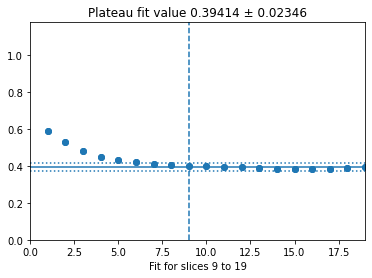

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


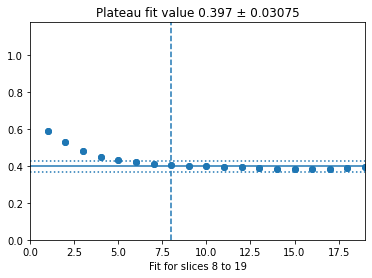

Adjusted to 8


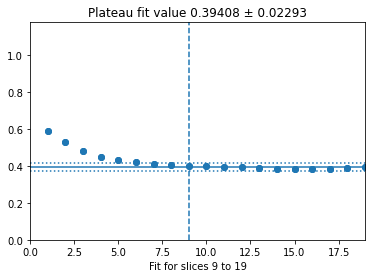

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


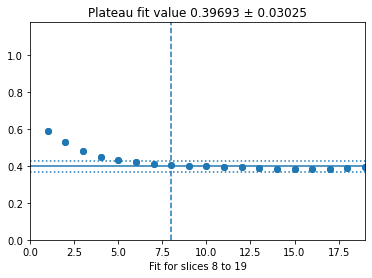

Adjusted to 8


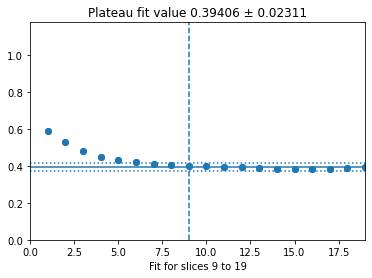

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


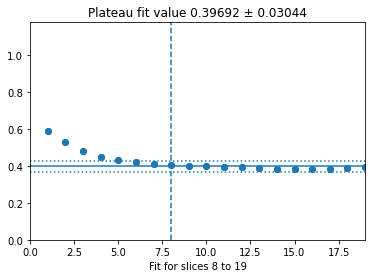

Adjusted to 8


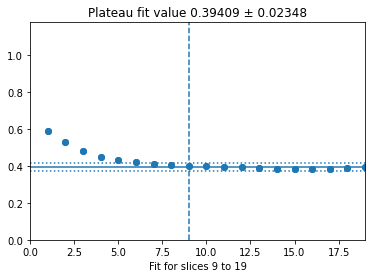

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


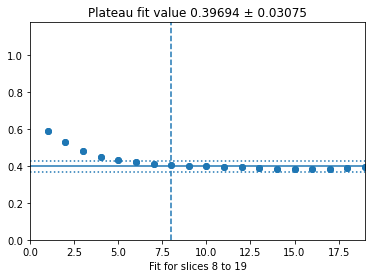

Adjusted to 8


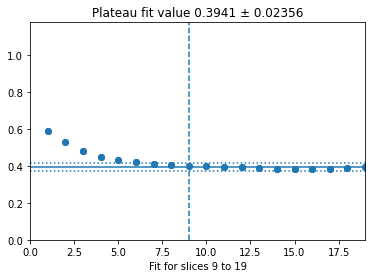

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


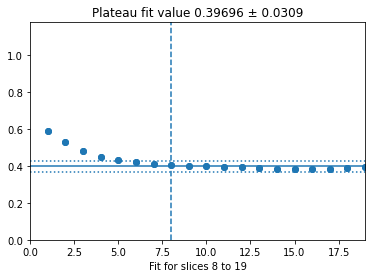

Adjusted to 8


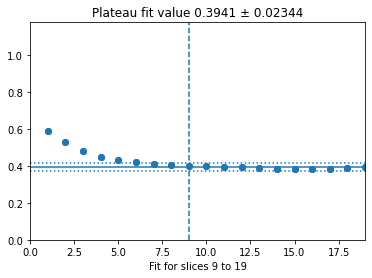

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


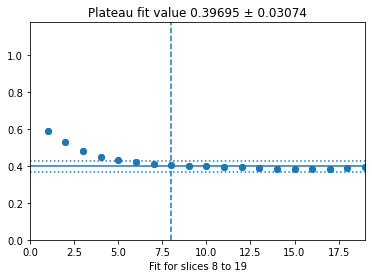

Adjusted to 8


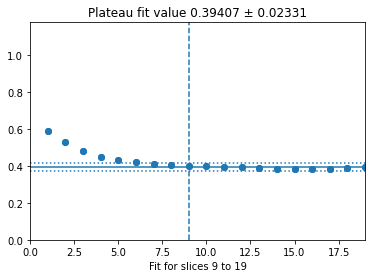

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


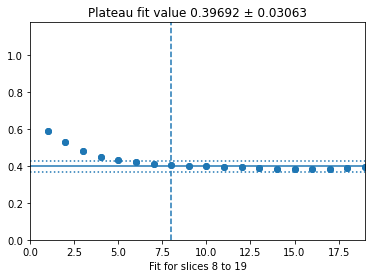

Adjusted to 8


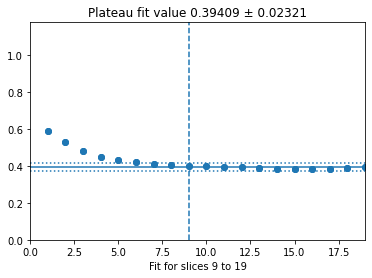

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


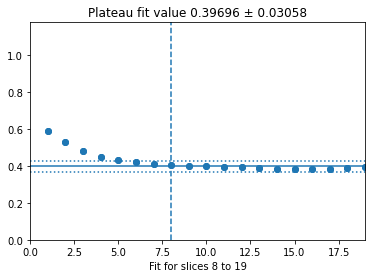

Adjusted to 8


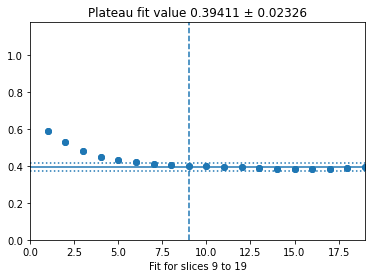

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


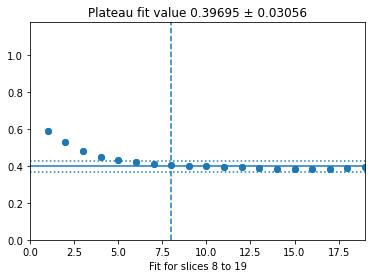

Adjusted to 8


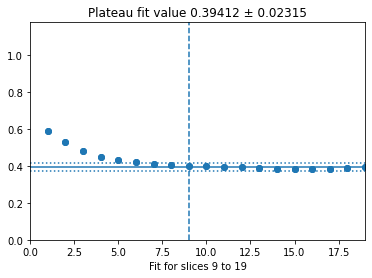

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


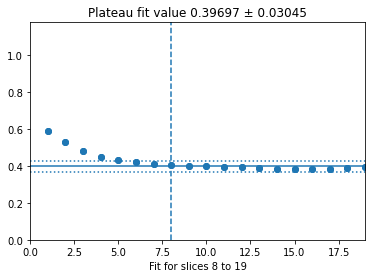

Adjusted to 8


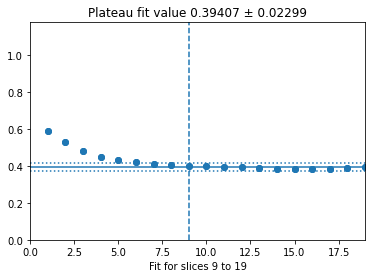

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


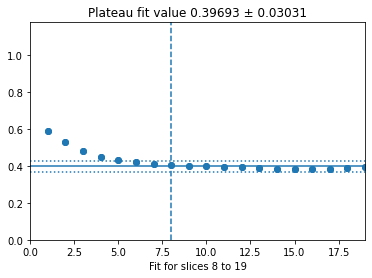

Adjusted to 8


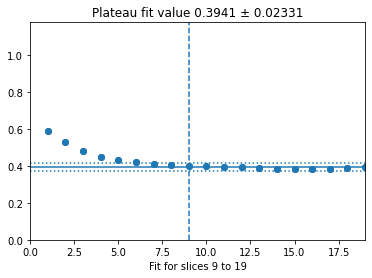

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


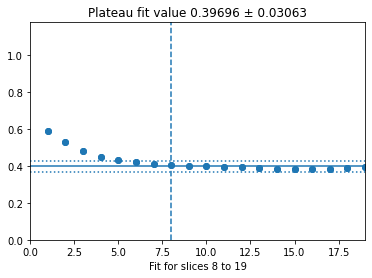

Adjusted to 8


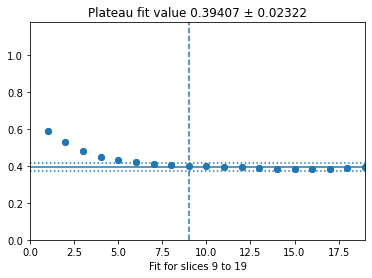

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


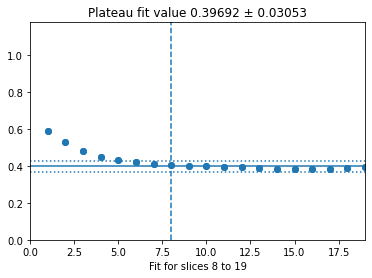

Adjusted to 8


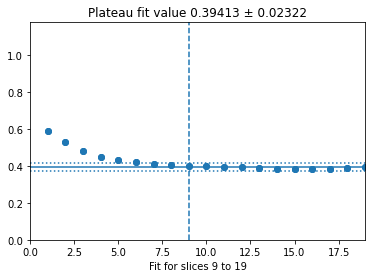

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


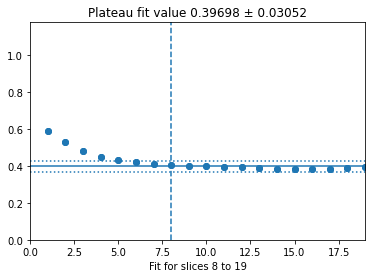

Adjusted to 8


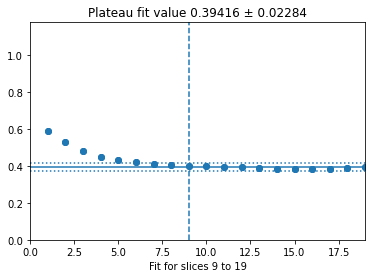

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


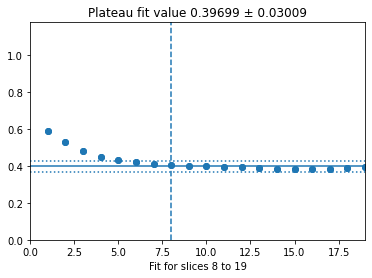

Adjusted to 8


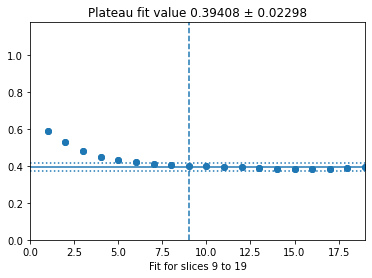

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


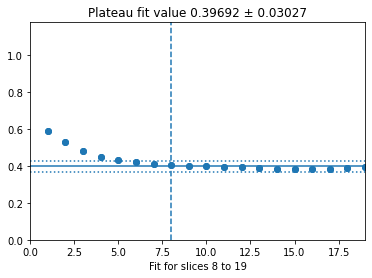

Adjusted to 8


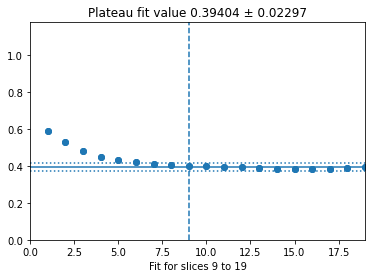

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


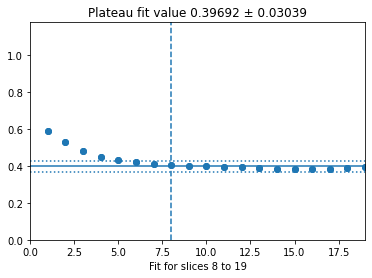

Adjusted to 8


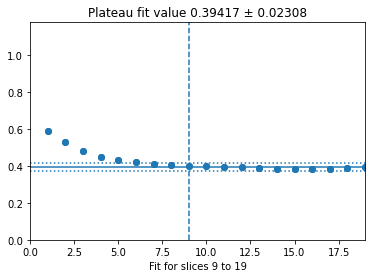

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


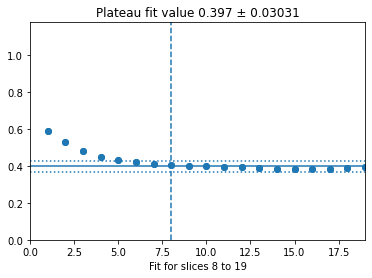

Adjusted to 8


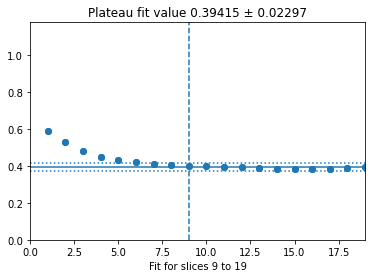

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


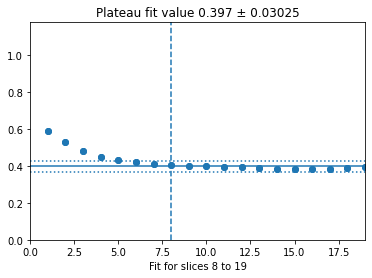

Adjusted to 8


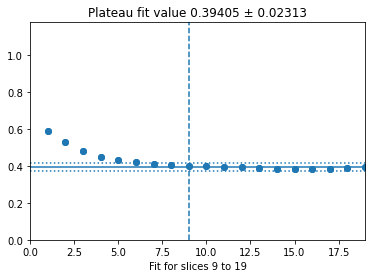

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


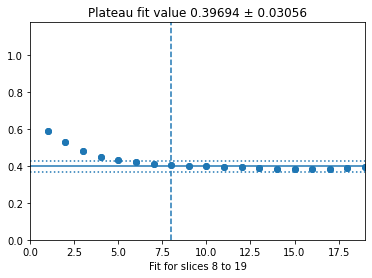

Adjusted to 8


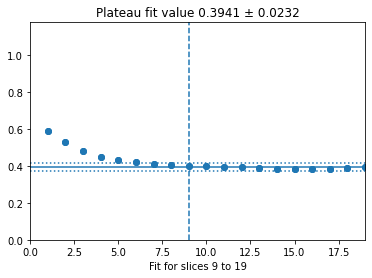

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


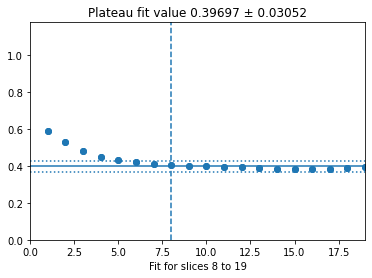

Adjusted to 8


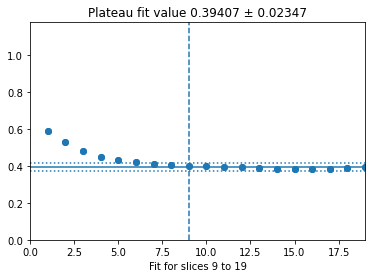

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


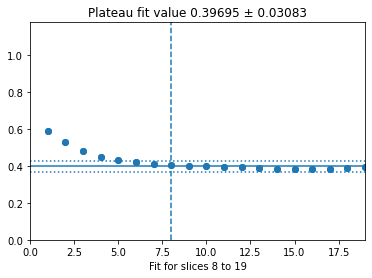

Adjusted to 8


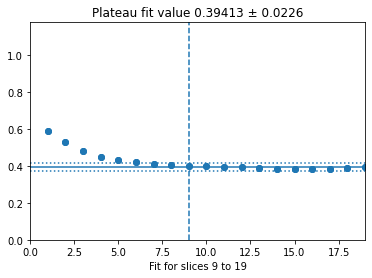

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


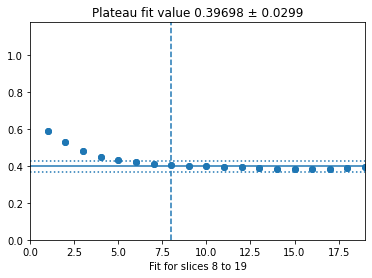

Adjusted to 8


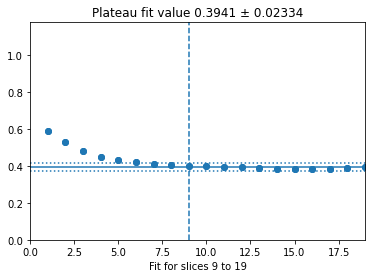

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


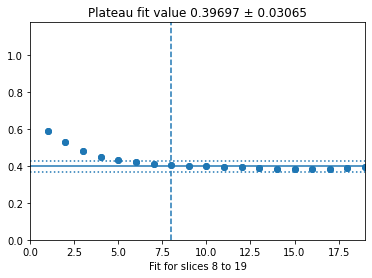

Adjusted to 8


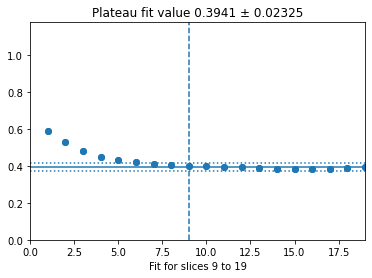

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


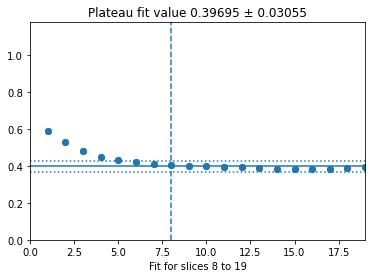

Adjusted to 8


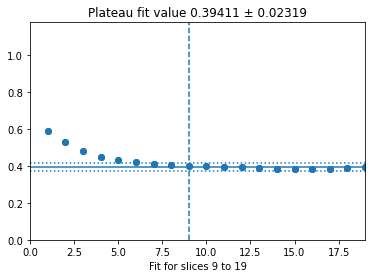

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


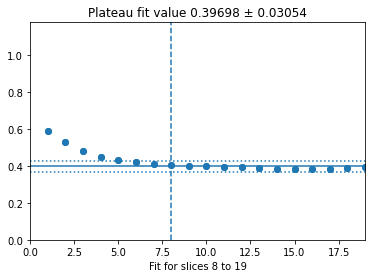

Adjusted to 8


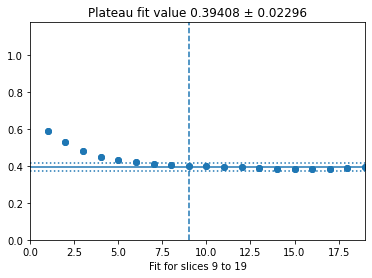

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


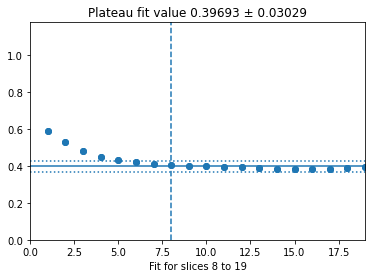

Adjusted to 8


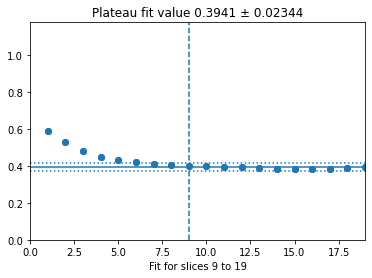

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


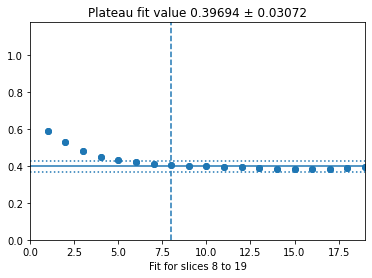

Adjusted to 8


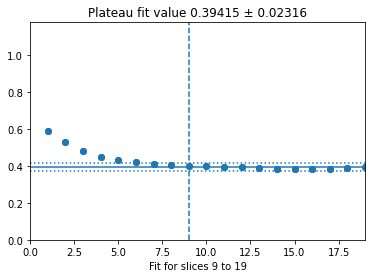

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


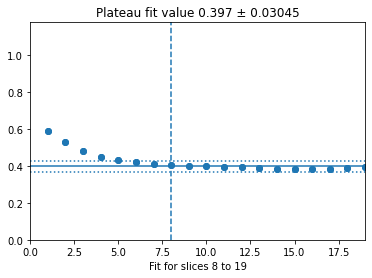

Adjusted to 8


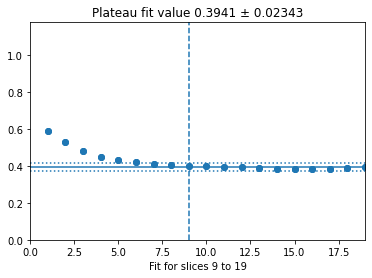

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


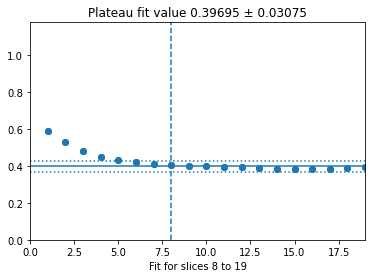

Adjusted to 8


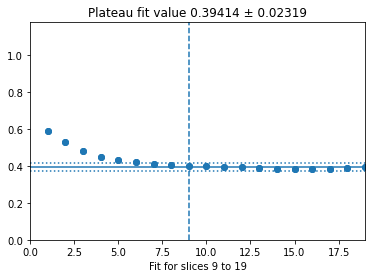

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


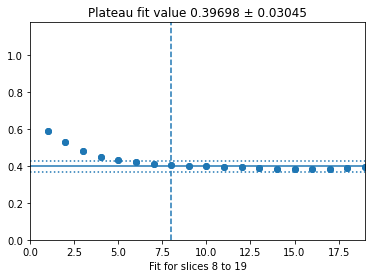

Adjusted to 8


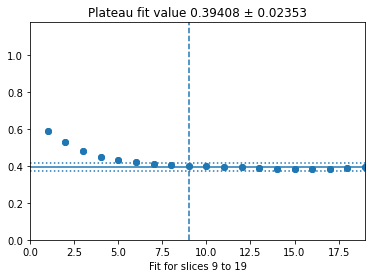

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


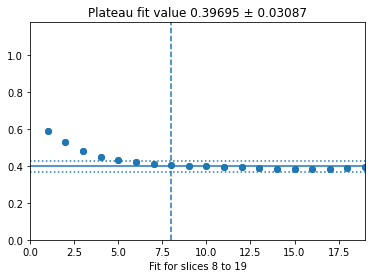

Adjusted to 8


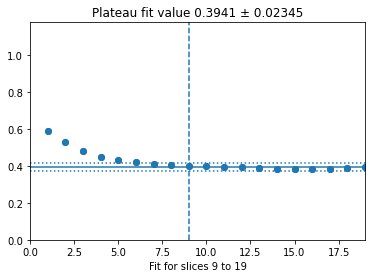

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


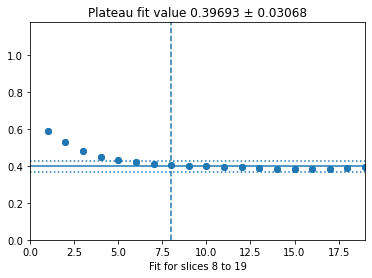

Adjusted to 8


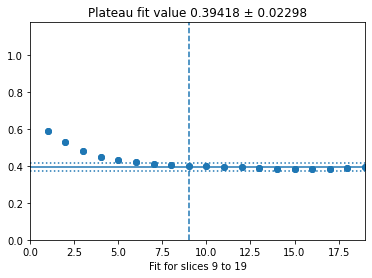

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


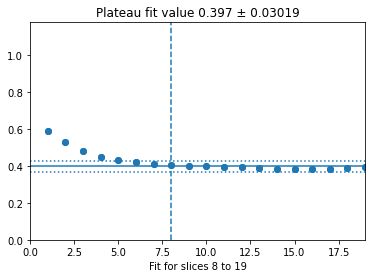

Adjusted to 8


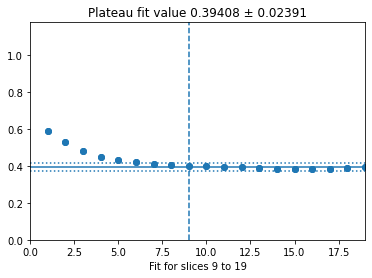

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


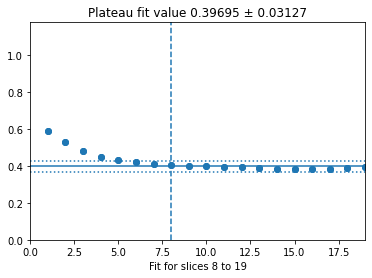

Adjusted to 8


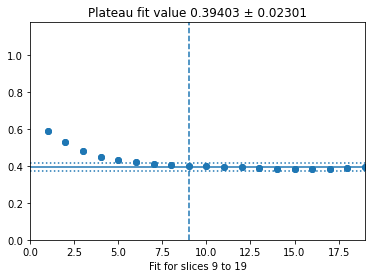

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


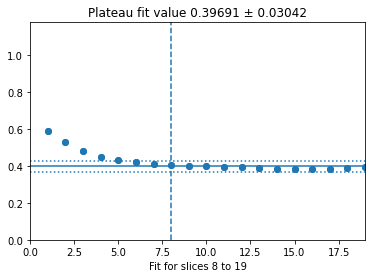

Adjusted to 8


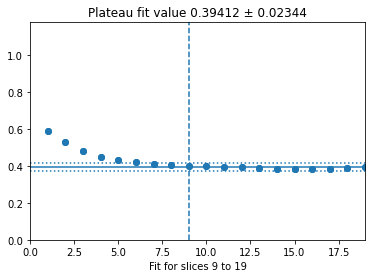

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


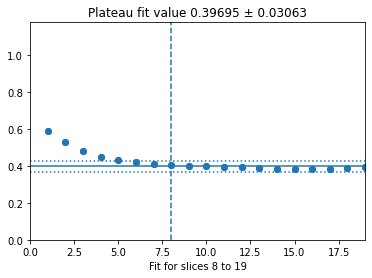

Adjusted to 8


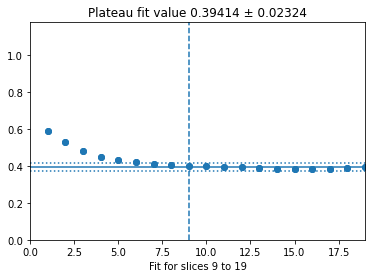

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


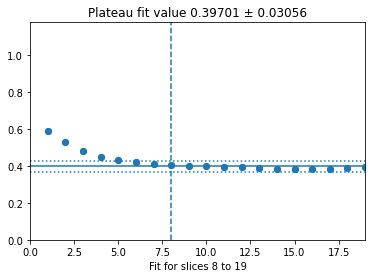

Adjusted to 8


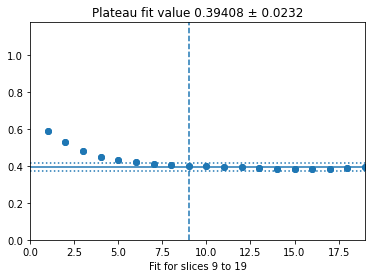

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


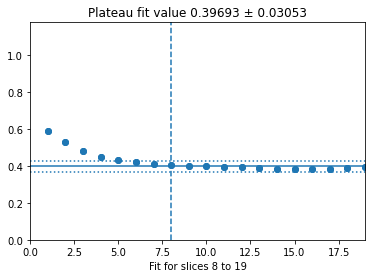

Adjusted to 8


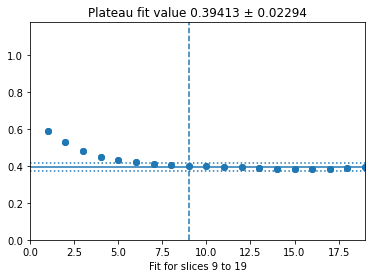

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


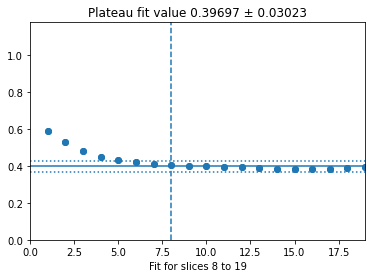

Adjusted to 8


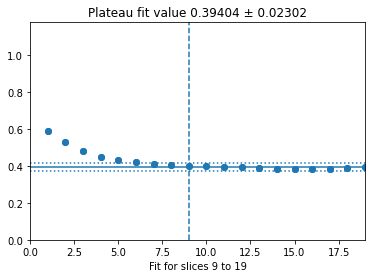

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


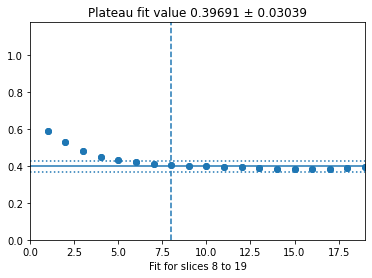

Adjusted to 8


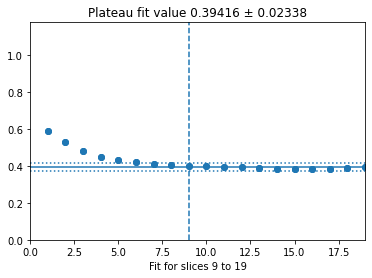

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


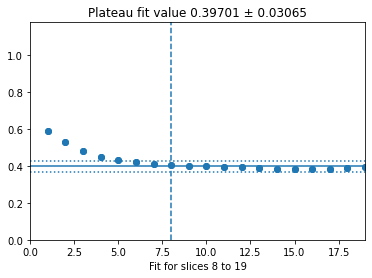

Adjusted to 8


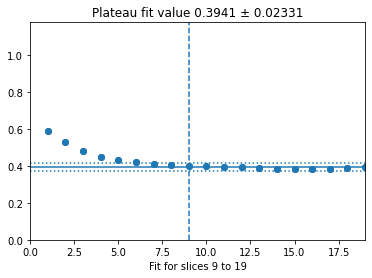

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


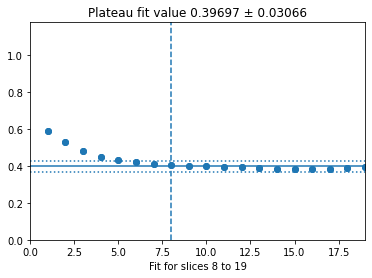

Adjusted to 8


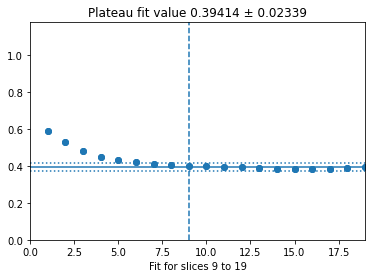

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


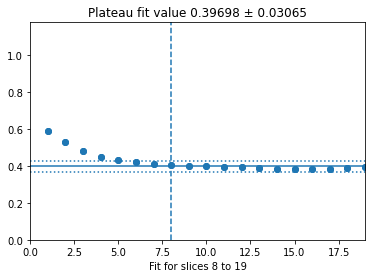

Adjusted to 8


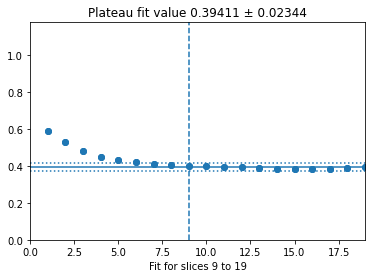

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


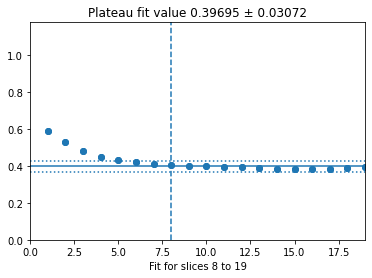

Adjusted to 8


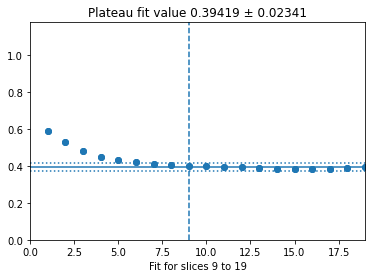

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


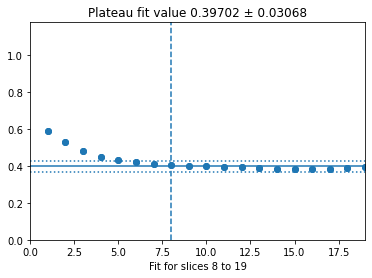

Adjusted to 8


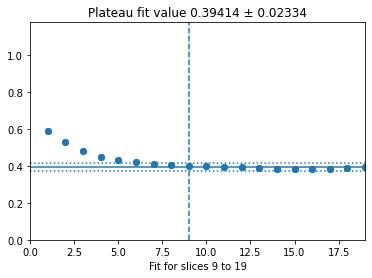

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


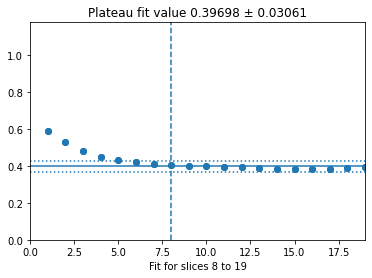

Adjusted to 8


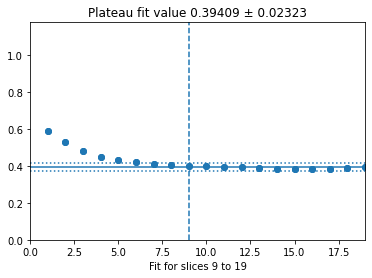

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


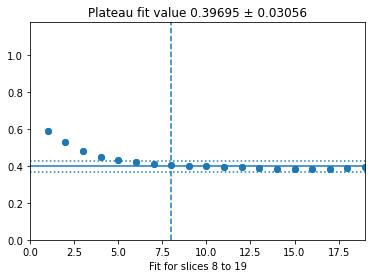

Adjusted to 8


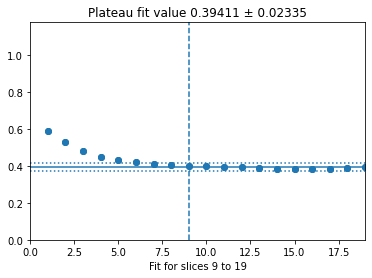

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


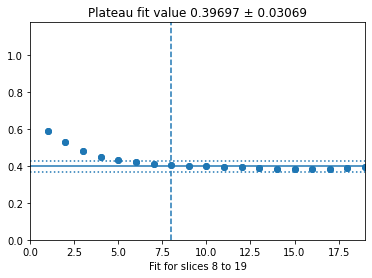

Adjusted to 8


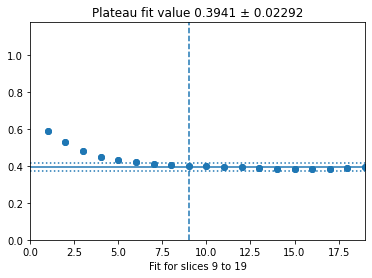

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


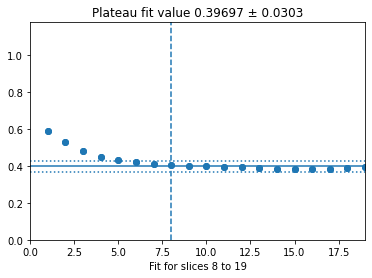

Adjusted to 8


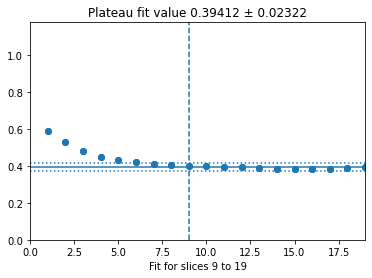

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


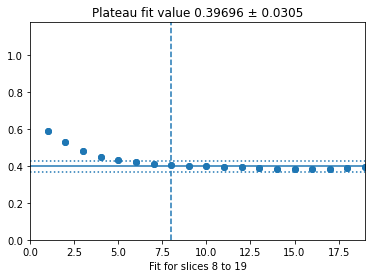

Adjusted to 8


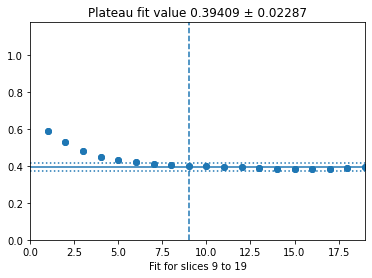

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


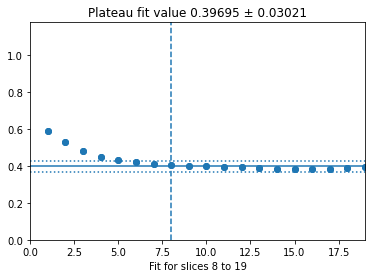

Adjusted to 8


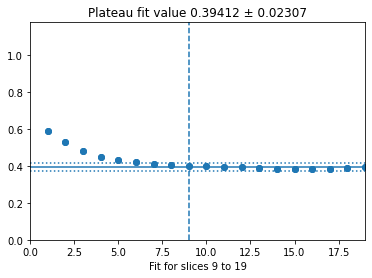

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


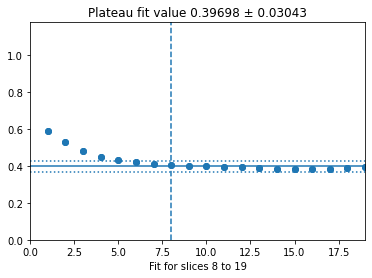

Adjusted to 8


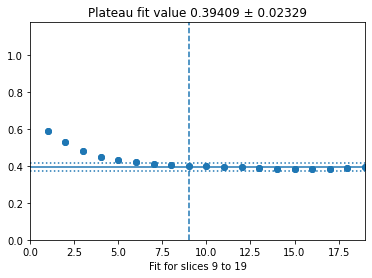

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


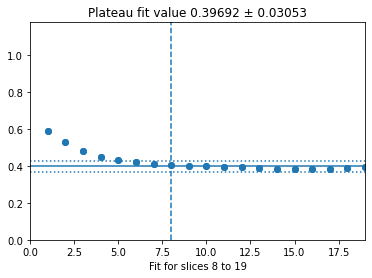

Adjusted to 8


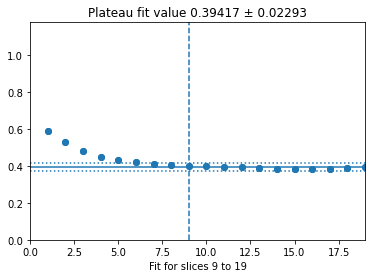

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


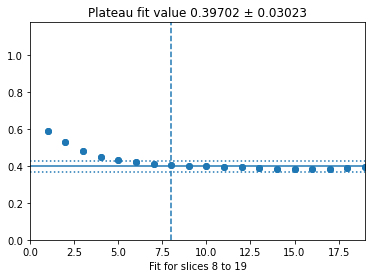

Adjusted to 8


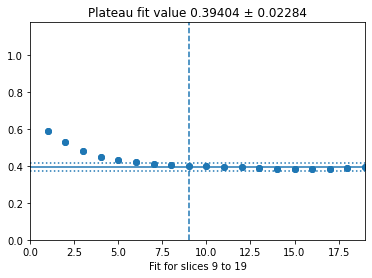

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


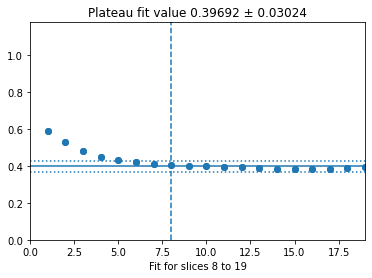

Adjusted to 8


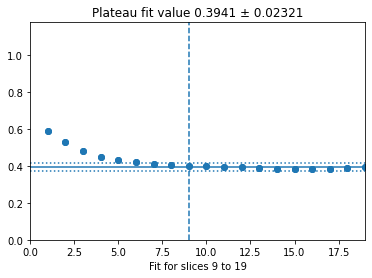

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


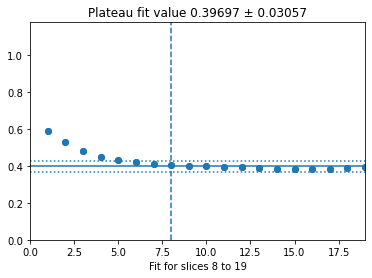

Adjusted to 8


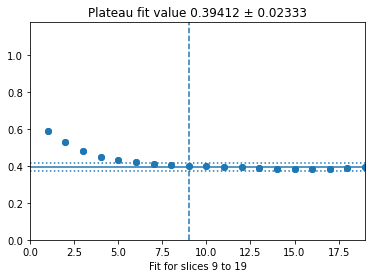

C:\Users\siril\AppData\Local\Temp\ipykernel_5192\3862958204.py:4: RuntimeWarning: invalid value encountered in double_scalars
  quo = num/den


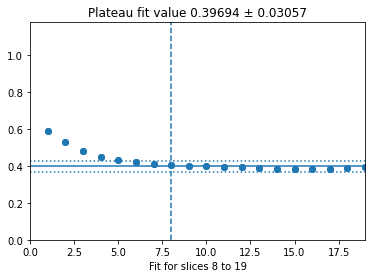

Adjusted to 8


In [102]:
def testAltFits(coords, err, static_bound, varied_bound, frac_delta=0.05):
    
    if varied_bound <= static_bound:
        rho_bar = getPlateauVal(coords, err, varied_bound, static_bound)
        delta = oneDimJacknife(coords[varied_bound:static_bound], avg=rho_bar)
        plotPlateauFit(coords, err, varied_bound, static_bound)
        if (delta/rho_bar < frac_delta):
            bound = rho_bar * frac_delta
        else:
            bound = delta
        
        while varied_bound > 0:
            next_slice = varied_bound - 1
            include_next_plateau = getPlateauVal(coords, err, next_slice, static_bound)

            if (rho_bar-bound) <= include_next_plateau <= (rho_bar+bound):
                varied_bound = next_slice
                rho_bar = getPlateauVal(coords, err, static_bound, varied_bound)
                plotPlateauFit(coords, err, varied_bound, static_bound)
                
            else:
                break
                
    else:
        rho_bar = getPlateauVal(coords, err, static_bound, varied_bound)
        delta = oneDimJacknife(coords[static_bound:varied_bound], avg=rho_bar)
        plotPlateauFit(coords, err, static_bound, varied_bound)
        if (delta/rho_bar < frac_delta):
            bound = rho_bar * frac_delta
        else:
            bound = delta
        
        while cursor < len(coords):
            next_slice = varied_bound + 1
            include_next_plateau = getPlateauVal(coords, err, static_bound, next_slice)
            
            if (rho_bar-bound) <= include_next_plateau <= (rho_bar+bound):
                varied_bound = next_slice
                rho_bar = getPlateauVal(coords, err, static_bound, varied_bound)
                plotPlateauFit(coords, err, static_bound, varied_bound)
                
            else:
                break
            
    return varied_bound

data_by_bin = np.transpose(binned_energy)
for i in range(len(data_by_bin)):
    new_min = testAltFits(data_by_bin[i], jack_err, 19, 9)
    print("Adjusted to", new_min)